In [1]:
import os

os.environ["VXM_BACKEND"] = "pytorch"

import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Sequential
import torch.optim as optim
import voxelmorph as vxm
import neurite as ne
import scipy.ndimage

device = torch.device(
    "cuda:0" if torch.cuda.is_available() else "cpu"
)

print("VXM_BACKEND:", os.environ.get("VXM_BACKEND"))
print("device:", device)

backend:pytorch
Pytorch
VXM_BACKEND: pytorch
device: cuda:0


In [2]:
# 画像を読み込み
x_train = np.load('Data/TrainData_NoBed.npz')['Train']
x_train = np.transpose(x_train, (3, 0, 1, 2))

print('Resized train vol_shape:', x_train.shape[1:])
print('Resized train shape:', x_train.shape)

Resized train vol_shape: (128, 256, 256)
Resized train shape: (400, 128, 256, 256)


In [3]:
import torch

def vxm_data_generator(x_data, batch_size):
    vol_shape = x_data.shape[1:]  # データ形状を取得
    ndims = len(vol_shape)
    
    zero_phi = np.zeros([batch_size, *vol_shape, ndims])
    
    while True:
        idx1 = np.random.randint(0, x_data.shape[0], size=batch_size)
        moving_images = x_data[idx1, ..., np.newaxis]
        # ファインチューニングでは同じ症例同士のペアを避ける
        idx2 = np.random.randint(0, x_data.shape[0], size=batch_size)
        while np.any(idx2 == idx1):
            same_case = idx2 == idx1
            idx2[same_case] = np.random.randint(0, x_data.shape[0], size=same_case.sum())
        fixed_images = x_data[idx2, ..., np.newaxis]

        # TensorFlowからPyTorchのデータ形式に変換
        moving_images = torch.tensor(moving_images).permute(0, 4, 1, 2, 3).float()
        fixed_images = torch.tensor(fixed_images).permute(0, 4, 1, 2, 3).float()

        # チャンネルを最初の次元に追加
        moving_images = moving_images.permute(0, 1, 2, 3, 4)  # チャンネルを最初の次元に移動
        fixed_images = fixed_images.permute(0, 1, 2, 3, 4)  # チャンネルを最初の次元に移動

        inputs = [moving_images, fixed_images]
        outputs = [fixed_images, zero_phi]

        yield (inputs, outputs)

In [4]:
train_generator = vxm_data_generator(x_train, batch_size=2)
in_sample, out_sample = next(train_generator)

# in_sampleとout_sampleの内容を確認する
print("Input Sample Shapes:")
print("Moving Images Shape:", in_sample[0].shape)
print("Fixed Images Shape:", in_sample[1].shape)

print("\nOutput Sample Shapes:")
print("Moved Images (Fixed) Shape:", out_sample[0].shape)
print("Zero Gradient Shape:", out_sample[1].shape)

Input Sample Shapes:
Moving Images Shape: torch.Size([2, 1, 128, 256, 256])
Fixed Images Shape: torch.Size([2, 1, 128, 256, 256])

Output Sample Shapes:
Moved Images (Fixed) Shape: torch.Size([2, 1, 128, 256, 256])
Zero Gradient Shape: (2, 128, 256, 256, 3)


In [4]:
mse_loss = vxm.losses.MSE().loss
grad_loss = vxm.losses.Grad('l2').loss

def total_loss(y_true, y_pred):
    mse = mse_loss(y_true, y_pred)
    grad = grad_loss(y_true, y_pred)
    return mse + 0.01 * grad, mse, grad
#     return mse_loss(y_true, y_pred)

def MSE_Loss(y_true, y_pred):
    y_true = y_true.to(device)
    y_pred = y_pred.to(device)
    mse = mse_loss(y_true, y_pred)
    return mse

def lncc_loss(I, J, window=9, eps=1e-5):
    # I, J: (B, 1, D, H, W)
    padding = window // 2
    weight = torch.ones(1, 1, window, window, window, device=I.device)

    I2 = I * I
    J2 = J * J
    IJ = I * J

    I_sum = F.conv3d(I, weight, padding=padding)
    J_sum = F.conv3d(J, weight, padding=padding)
    I2_sum = F.conv3d(I2, weight, padding=padding)
    J2_sum = F.conv3d(J2, weight, padding=padding)
    IJ_sum = F.conv3d(IJ, weight, padding=padding)

    win_size = window ** 3
    u_I = I_sum / win_size
    u_J = J_sum / win_size

    cross = IJ_sum - u_J * I_sum - u_I * J_sum + u_I * u_J * win_size
    I_var = I2_sum - 2 * u_I * I_sum + u_I * u_I * win_size
    J_var = J2_sum - 2 * u_J * J_sum + u_J * u_J * win_size

    lncc = cross * cross / (I_var * J_var + eps)
    return -torch.mean(lncc)  # maximize LNCC → minimize -LNCC

In [5]:
# configure unet input shape (concatenation of moving and fixed images)
ndim = 3
unet_input_features = 2
# inshape = (*x_train.shape[1:], unet_input_features)

nb_features = [
    [32, 64, 64, 64, 64],
    [64, 64, 64, 64, 64, 32, 16, 16]
]


In [6]:
import voxelmorph as vxm
import inspect

print(vxm.__file__)
print(vxm.networks.__file__)
print([name for name in dir(vxm.networks) if "VxmDense" in name])

d:\Saito\voxelmorph\__init__.py
d:\Saito\voxelmorph\torch\networks.py
['VxmDense', 'VxmDense1', 'VxmDense2', 'VxmDense_128_256', 'VxmDense_128_256_256']


In [7]:
transformer256 = vxm.layers.SpatialTransformer((128, 256, 256)).to(device)

c:\Users\user\anaconda3\envs\nn\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [8]:
import math
from pathlib import Path
import torch
import matplotlib.pyplot as plt

band_names = ['LLL', 'LLH', 'LHL', 'LHH', 'HLL', 'HLH', 'HHL', 'HHH']

wavelet_vis_enabled = False
wavelet_vis_every = 100
wavelet_vis_dir = Path('wavelet_stage_outputs')
wavelet_vis_dir.mkdir(exist_ok=True)

class Haar3DAnalysisOnly(nn.Module):
    def __init__(self):
        super().__init__()

        hL = torch.tensor([1.0, 1.0], dtype=torch.float32) / math.sqrt(2.0)
        hH = torch.tensor([1.0, -1.0], dtype=torch.float32) / math.sqrt(2.0)

        filters = []
        names = []

        for z_name, z_filter in zip(['L', 'H'], [hL, hH]):
            for y_name, y_filter in zip(['L', 'H'], [hL, hH]):
                for x_name, x_filter in zip(['L', 'H'], [hL, hH]):
                    kernel = (
                        z_filter[:, None, None]
                        * y_filter[None, :, None]
                        * x_filter[None, None, :]
                    )
                    filters.append(kernel)
                    names.append(z_name + y_name + x_name)

        weight = torch.stack(filters, dim=0).unsqueeze(1)
        self.register_buffer('weight', weight)
        self.names = names

    def forward(self, x):
        x = F.pad(x, (0, 1, 0, 1, 0, 1))
        return F.conv3d(x, self.weight, stride=1, padding=0)

def analysis_filter_3d(x, analysis_layer):
    return analysis_layer(x)

def down_sampling_3d(w):
    return w[:, :, ::2, ::2, ::2]

def up_sampling_3d(w_down):
    B, C, D, H, W = w_down.shape
    w_up = torch.zeros(
        B, C, D * 2, H * 2, W * 2,
        dtype=w_down.dtype,
        device=w_down.device
    )
    w_up[:, :, ::2, ::2, ::2] = w_down
    return w_up

def make_3d_filter(fz, fy, fx):
    return fz[:, None, None] * fy[None, :, None] * fx[None, None, :]

def create_synthesis_filters(device):
    low = torch.tensor([1.0, 1.0], dtype=torch.float32, device=device) / math.sqrt(2.0)
    high = torch.tensor([1.0, -1.0], dtype=torch.float32, device=device) / math.sqrt(2.0)

    filters = torch.stack([
        make_3d_filter(low, low, low),
        make_3d_filter(low, low, high),
        make_3d_filter(low, high, low),
        make_3d_filter(low, high, high),
        make_3d_filter(high, low, low),
        make_3d_filter(high, low, high),
        make_3d_filter(high, high, low),
        make_3d_filter(high, high, high),
    ], dim=0)

    filters = torch.flip(filters, dims=[1, 2, 3]).unsqueeze(1)
    return filters

def synthesis_filter_3d(
    w_up,
    synthesis_filters
):

    B, C, D, H, W = w_up.shape

    # ========================================================
    # 8帯域を1回のGrouped Conv3Dで処理
    #
    # input  : (B, 8, D, H, W)
    # filter : (8, 1, 2, 2, 2)
    # groups : 8
    #
    # 各Wavelet帯域に対応するfilterを独立して適用
    # ========================================================

    filtered_bands = F.conv3d(
        w_up,
        synthesis_filters,
        stride=1,
        padding=1,
        groups=C
    )

    # ========================================================
    # Originalと同じcrop
    # ========================================================

    filtered_bands = filtered_bands[
        :,
        :,
        :D,
        :H,
        :W
    ]

    # ========================================================
    # 8帯域を加算して再構成
    # ========================================================

    reconstructed = torch.sum(
        filtered_bands,
        dim=1,
        keepdim=True
    )

    return (
        reconstructed,
        filtered_bands
    )


In [9]:
from pathlib import Path
import csv
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# ==========================================
# カリキュラム学習・途中経過観察の設定
# ==========================================
OBSERVE_EVERY = 1000
OBSERVE_PATIENT_ID = 0
# 正負両方向を同じ絶対値で評価する
OBSERVE_SHIFTS = [-40, -30, -20, -10, 0, 10, 20, 30, 40]
OBSERVE_RANDOM_SEED = 20260803
OBSERVE_RANDOM_MAX_SHIFT = 40.0

OBSERVE_DIR = Path("curriculum_observation")
OBSERVE_DIR.mkdir(exist_ok=True)

OBSERVE_CSV = OBSERVE_DIR / "curriculum_observation_metrics.csv"

# 観察用の患者画像を固定
observation_moving = torch.from_numpy(
    x_train[OBSERVE_PATIENT_ID:OBSERVE_PATIENT_ID + 1]
).unsqueeze(1).to(
    device=device,
    dtype=torch.float32
)


def calculate_rmse(reference, prediction):
    return torch.sqrt(
        torch.mean((reference - prediction) ** 2)
    ).item()


def calculate_dvf_rmse(reference_flow, predicted_flow):
    return torch.sqrt(
        torch.mean((reference_flow - predicted_flow) ** 2)
    ).item()


def observe_curriculum_progress(
    model,
    epoch,
    moving_image,
    shifts,
):
    """
    固定患者・固定x方向変位を使い、
    カリキュラム学習途中の性能を表示・保存する。
    """

    was_training = model.training
    model.eval()

    epoch_dir = OBSERVE_DIR / f"epoch_{epoch:06d}"
    epoch_dir.mkdir(exist_ok=True)

    result_rows = []

    with torch.no_grad():
        moving_w = analysis_fast(
            moving_image
        )

        figure, axes = plt.subplots(
            len(shifts),
            4,
            figsize=(16, 4 * len(shifts)),
            constrained_layout=True
        )

        if len(shifts) == 1:
            axes = np.expand_dims(axes, axis=0)

        observation_slice = moving_image.shape[2] // 2

        moving_np = moving_image[
            0, 0, observation_slice
        ].detach().cpu().numpy()

        display_vmin, display_vmax = np.percentile(
            moving_np,
            [1, 99]
        )

        for row_index, shift_pixels in enumerate(shifts):

            # フル解像度の正解DVF
            # channel 0=z, 1=y, 2=x
            true_flow_full = torch.zeros(
                (
                    1,
                    3,
                    moving_image.shape[2],
                    moving_image.shape[3],
                    moving_image.shape[4]
                ),
                dtype=moving_image.dtype,
                device=device
            )

            true_flow_full[:, 2] = float(shift_pixels)

            # 正解画像 Moving′
            moving_prime = cubic_transformer256(
                moving_image,
                true_flow_full
            )

            moving_prime_w = analysis_fast(
                moving_prime
            )

            # DVF予測
            predicted_flow = model(
                moving_w,
                moving_prime_w
            )

            # 8バンドへ同じDVFを適用
            moved_w = cubic_transformer(
                moving_w,
                predicted_flow
            )

            moved = synthesis_filter_3d_fast(
                moved_w,
                synthesis_filters_fast
            )

            moved = moved.to(device)

            # 低解像度DVFの正解
            true_flow_low = torch.zeros_like(
                predicted_flow
            )

            true_flow_low[:, 2] = (
                float(shift_pixels) / 2.0
            )

            image_rmse_before = calculate_rmse(
                moving_prime,
                moving_image
            )

            image_rmse_after = calculate_rmse(
                moving_prime,
                moved
            )

            dvf_rmse = calculate_dvf_rmse(
                true_flow_low,
                predicted_flow
            )

            predicted_x_mean = (
                predicted_flow[:, 2]
                .mean()
                .item()
            )

            result_rows.append({
                "epoch": epoch,
                "shift_pixels_fullres_x": shift_pixels,
                "true_flow_x_lowres": shift_pixels / 2.0,
                "predicted_flow_x_mean_lowres": predicted_x_mean,
                "rmse_before": image_rmse_before,
                "rmse_after": image_rmse_after,
                "dvf_rmse": dvf_rmse,
            })

            moving_prime_np = moving_prime[
                0, 0, observation_slice
            ].detach().cpu().numpy()

            moved_np = moved[
                0, 0, observation_slice
            ].detach().cpu().numpy()

            predicted_flow_x_np = predicted_flow[
                0,
                2,
                predicted_flow.shape[2] // 2
            ].detach().cpu().numpy()

            axes[row_index, 0].imshow(
                moving_np,
                cmap="gray",
                vmin=display_vmin,
                vmax=display_vmax
            )
            axes[row_index, 0].set_title(
                f"Moving\nEpoch {epoch}"
            )

            axes[row_index, 1].imshow(
                moving_prime_np,
                cmap="gray",
                vmin=display_vmin,
                vmax=display_vmax
            )
            axes[row_index, 1].set_title(
                f"Moving'\nx shift={shift_pixels}px"
            )

            axes[row_index, 2].imshow(
                moved_np,
                cmap="gray",
                vmin=display_vmin,
                vmax=display_vmax
            )
            axes[row_index, 2].set_title(
                f"Moved\nRMSE={image_rmse_after:.5f}"
            )

            dvf_image = axes[row_index, 3].imshow(
                predicted_flow_x_np,
                cmap="jet"
            )

            axes[row_index, 3].set_title(
                "Predicted DVF x\n"
                f"mean={predicted_x_mean:.3f}, "
                f"RMSE={dvf_rmse:.3f}"
            )

            figure.colorbar(
                dvf_image,
                ax=axes[row_index, 3],
                fraction=0.046,
                pad=0.04
            )

            for column_index in range(4):
                axes[row_index, column_index].axis("off")

        figure.suptitle(
            f"Curriculum learning observation — Epoch {epoch}",
            fontsize=16
        )

        figure_path = (
            epoch_dir
            / f"curriculum_observation_epoch_{epoch:06d}.png"
        )

        figure.savefig(
            figure_path,
            dpi=180,
            bbox_inches="tight"
        )

        plt.show()
        plt.close(figure)

    csv_exists = OBSERVE_CSV.exists()

    with OBSERVE_CSV.open(
        "a",
        newline="",
        encoding="utf-8"
    ) as file:
        writer = csv.DictWriter(
            file,
            fieldnames=result_rows[0].keys()
        )

        if not csv_exists:
            writer.writeheader()

        writer.writerows(result_rows)

    if was_training:
        model.train()

    print(
        f"[Observation] Epoch {epoch}: "
        f"saved to {epoch_dir}"
    )


def observe_random_deformation_progress(model, epoch, moving_image):
    """学習と同型の固定ランダム・滑らかDVFで性能を観察する。"""
    was_training = model.training
    model.eval()
    epoch_dir = OBSERVE_DIR / f"epoch_{epoch:06d}"
    epoch_dir.mkdir(exist_ok=True)

    # 毎回まったく同じDVFを作るため、局所Generatorを使う。
    random_generator = torch.Generator(device="cpu")
    random_generator.manual_seed(OBSERVE_RANDOM_SEED)
    true_flow_full = (
        torch.rand((1, 3, 8, 16, 16), generator=random_generator) * 2 - 1
    ) * OBSERVE_RANDOM_MAX_SHIFT
    true_flow_full = gaussian_smooth_3d(true_flow_full, sigma=2.0)
    true_flow_full = F.interpolate(
        true_flow_full, size=(128, 256, 256), mode="trilinear", align_corners=False
    ).to(device)

    with torch.no_grad():
        moving_prime = cubic_transformer256(
            moving_image,
            true_flow_full
        )
        moving_w = analysis_fast(
            moving_image
        )

        moving_prime_w = analysis_fast(
            moving_prime
        )
        
        predicted_flow = model(
            moving_w,
            moving_prime_w
        )

        moved_w = cubic_transformer(
            moving_w,
            predicted_flow
        )

        moved = synthesis_filter_3d_fast(
            moved_w,
            synthesis_filters_fast
        )

        moved = moved.to(device)

        true_flow_low = F.interpolate(
            true_flow_full, size=predicted_flow.shape[2:], mode="trilinear", align_corners=False
        )/2.0
        rmse_before = calculate_rmse(moving_prime, moving_image)
        rmse_after = calculate_rmse(moving_prime, moved)
        dvf_rmse = calculate_dvf_rmse(true_flow_low, predicted_flow)

        result_row = {
            "epoch": epoch, "seed": OBSERVE_RANDOM_SEED,
            "max_initial_shift": OBSERVE_RANDOM_MAX_SHIFT,
            "rmse_before": rmse_before, "rmse_after": rmse_after,
            "dvf_rmse": dvf_rmse,
            "true_flow_absmax_lowres": true_flow_low.abs().max().item(),
            "predicted_flow_absmax_lowres": predicted_flow.abs().max().item(),
        }

        slice_index = moving_image.shape[2] // 2
        flow_slice = predicted_flow.shape[2] // 2
        figure, axes = plt.subplots(2, 3, figsize=(15, 9), constrained_layout=True)
        image_vmin, image_vmax = np.percentile(
            moving_image[0, 0, slice_index].detach().cpu().numpy(), [1, 99]
        )
        for ax, image, title in [
            (axes[0, 0], moving_image, "Moving"),
            (axes[0, 1], moving_prime, "Target (random DVF)"),
            (axes[0, 2], moved, f"Moved (RMSE={rmse_after:.5f})"),
        ]:
            ax.imshow(image[0, 0, slice_index].detach().cpu(), cmap="gray", vmin=image_vmin, vmax=image_vmax)
            ax.set_title(title)
            ax.axis("off")
        for component, name in enumerate(["z", "y", "x"]):
            error = (predicted_flow[0, component, flow_slice] - true_flow_low[0, component, flow_slice]).detach().cpu()
            dvf = axes[1, component].imshow(error, cmap="coolwarm")
            axes[1, component].set_title(f"{name}-DVF error")
            axes[1, component].axis("off")
            figure.colorbar(dvf, ax=axes[1, component], fraction=0.046, pad=0.04)
        figure.suptitle(f"Fixed random deformation observation — Epoch {epoch}; DVF RMSE={dvf_rmse:.4f}")
        figure.savefig(epoch_dir / f"random_deformation_epoch_{epoch:06d}.png", dpi=180, bbox_inches="tight")
        plt.show()
        plt.close(figure)

    random_csv = OBSERVE_DIR / "random_deformation_observation_metrics.csv"
    csv_exists = random_csv.exists()
    with random_csv.open("a", newline="", encoding="utf-8") as file:
        writer = csv.DictWriter(file, fieldnames=result_row.keys())
        if not csv_exists:
            writer.writeheader()
        writer.writerow(result_row)
    if was_training:
        model.train()
    print(f"[Random deformation observation] Epoch {epoch}: saved to {epoch_dir}")

In [10]:
# ============================================================
# Gaussian smoothing
# ============================================================

def gaussian_smooth_3d(tensor, sigma=1.0):
    from scipy.ndimage import gaussian_filter

    tensor_np = tensor.detach().cpu().numpy()

    smoothed_np = gaussian_filter(
        tensor_np,
        sigma=[0, 0, sigma, sigma, sigma]
    )

    return torch.tensor(
        smoothed_np,
        dtype=tensor.dtype,
        device=tensor.device
    )

In [11]:
test = torch.randn(
    2, 3, 8, 16, 16,
    device=device
)

test_smoothed = gaussian_smooth_3d(
    test,
    sigma=2.0
)

print("input :", test.shape, test.device)
print("output:", test_smoothed.shape, test_smoothed.device)

input : torch.Size([2, 3, 8, 16, 16]) cuda:0
output: torch.Size([2, 3, 8, 16, 16]) cuda:0


In [12]:
# ======================================================================
# OLD + FAST HAAR WAVELET IMPLEMENTATION
# ======================================================================

import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F


# ======================================================================
# 1. OLD Haar Analysis
#
# 旧方式:
#   Conv3D stride=1
#   ↓
#   [::2, ::2, ::2]
# ======================================================================

class Haar3DAnalysisOnly(nn.Module):

    def __init__(self):
        super().__init__()

        hL = (
            torch.tensor(
                [1.0, 1.0],
                dtype=torch.float32
            )
            / math.sqrt(2.0)
        )

        hH = (
            torch.tensor(
                [1.0, -1.0],
                dtype=torch.float32
            )
            / math.sqrt(2.0)
        )

        filters = []
        names = []

        for z_name, z_filter in zip(
            ["L", "H"],
            [hL, hH]
        ):
            for y_name, y_filter in zip(
                ["L", "H"],
                [hL, hH]
            ):
                for x_name, x_filter in zip(
                    ["L", "H"],
                    [hL, hH]
                ):

                    kernel = (
                        z_filter[:, None, None]
                        *
                        y_filter[None, :, None]
                        *
                        x_filter[None, None, :]
                    )

                    filters.append(kernel)
                    names.append(
                        z_name + y_name + x_name
                    )

        weight = (
            torch.stack(
                filters,
                dim=0
            )
            .unsqueeze(1)
        )

        self.register_buffer(
            "weight",
            weight
        )

        self.names = names


    def forward(self, x):

        x = F.pad(
            x,
            (
                0, 1,
                0, 1,
                0, 1
            )
        )

        return F.conv3d(
            x,
            self.weight,
            stride=1,
            padding=0
        )


# ======================================================================
# 2. FAST Haar Analysis
#
# 旧:
#   Conv stride=1
#   ↓
#   downsampling
#
# FAST:
#   Conv stride=2
#
# 数学的には同じ位置だけ計算する
# ======================================================================

class Haar3DAnalysisFast(nn.Module):

    def __init__(self):
        super().__init__()

        hL = (
            torch.tensor(
                [1.0, 1.0],
                dtype=torch.float32
            )
            / math.sqrt(2.0)
        )

        hH = (
            torch.tensor(
                [1.0, -1.0],
                dtype=torch.float32
            )
            / math.sqrt(2.0)
        )

        filters = []
        names = []

        for z_name, z_filter in zip(
            ["L", "H"],
            [hL, hH]
        ):
            for y_name, y_filter in zip(
                ["L", "H"],
                [hL, hH]
            ):
                for x_name, x_filter in zip(
                    ["L", "H"],
                    [hL, hH]
                ):

                    kernel = (
                        z_filter[:, None, None]
                        *
                        y_filter[None, :, None]
                        *
                        x_filter[None, None, :]
                    )

                    filters.append(kernel)
                    names.append(
                        z_name + y_name + x_name
                    )

        weight = (
            torch.stack(
                filters,
                dim=0
            )
            .unsqueeze(1)
        )

        self.register_buffer(
            "weight",
            weight
        )

        self.names = names


    def forward(self, x):

        x = F.pad(
            x,
            (
                0, 1,
                0, 1,
                0, 1
            )
        )

        return F.conv3d(
            x,
            self.weight,
            stride=2,
            padding=0
        )


# ======================================================================
# 3. OLD Analysis helpers
# ======================================================================

def analysis_filter_3d(
    x,
    analysis_layer
):
    return analysis_layer(x)


def down_sampling_3d(w):

    return w[
        :,
        :,
        ::2,
        ::2,
        ::2
    ]


# ======================================================================
# 4. OLD Upsampling
# ======================================================================

def up_sampling_3d(w_down):

    B, C, D, H, W = w_down.shape

    w_up = torch.zeros(
        B,
        C,
        D * 2,
        H * 2,
        W * 2,
        dtype=w_down.dtype,
        device=w_down.device
    )

    w_up[
        :,
        :,
        ::2,
        ::2,
        ::2
    ] = w_down

    return w_up


# ======================================================================
# 5. Synthesis filters
# ======================================================================

def make_3d_filter(
    fz,
    fy,
    fx
):

    return (
        fz[:, None, None]
        *
        fy[None, :, None]
        *
        fx[None, None, :]
    )


def create_synthesis_filters(device):

    low = (
        torch.tensor(
            [1.0, 1.0],
            dtype=torch.float32,
            device=device
        )
        / math.sqrt(2.0)
    )

    high = (
        torch.tensor(
            [1.0, -1.0],
            dtype=torch.float32,
            device=device
        )
        / math.sqrt(2.0)
    )

    filters = torch.stack(
        [
            make_3d_filter(low,  low,  low),
            make_3d_filter(low,  low,  high),
            make_3d_filter(low,  high, low),
            make_3d_filter(low,  high, high),
            make_3d_filter(high, low,  low),
            make_3d_filter(high, low,  high),
            make_3d_filter(high, high, low),
            make_3d_filter(high, high, high),
        ],
        dim=0
    )

    # 旧conv3d用
    filters = torch.flip(
        filters,
        dims=[1, 2, 3]
    ).unsqueeze(1)

    return filters


# ======================================================================
# 6. OLD Synthesis
# ======================================================================

def synthesis_filter_3d(
    w_up,
    synthesis_filters
):

    B, C, D, H, W = w_up.shape

    filtered_bands = F.conv3d(
        w_up,
        synthesis_filters,
        stride=1,
        padding=1,
        groups=C
    )

    filtered_bands = filtered_bands[
        :,
        :,
        :D,
        :H,
        :W
    ]

    reconstructed = torch.sum(
        filtered_bands,
        dim=1,
        keepdim=True
    )

    return (
        reconstructed,
        filtered_bands
    )


# ======================================================================
# 7. CREATE OLD + FAST ANALYSIS
# ======================================================================

analysis = (
    Haar3DAnalysisOnly()
    .to(device)
)

analysis_fast = (
    Haar3DAnalysisFast()
    .to(device)
)

analysis_names = analysis_fast.names


# ======================================================================
# 8. CREATE SYNTHESIS FILTERS
# ======================================================================

synthesis_filters = (
    create_synthesis_filters(
        device
    )
)


# ======================================================================
# 9. FAST Synthesis
#
# zero insertion
# +
# synthesis convolution
# +
# 8 bands sum
#
# をConvTranspose3Dでまとめる
# ======================================================================

synthesis_filters_fast = torch.flip(
    synthesis_filters,
    dims=[2, 3, 4]
).contiguous()


def synthesis_filter_3d_fast(
    w_down,
    synthesis_filters_fast
):

    return F.conv_transpose3d(
        w_down,
        synthesis_filters_fast,
        bias=None,
        stride=2,
        padding=0,
        output_padding=0,
        groups=1
    )


# ======================================================================
# 10. CURRENT DEFINITIONS
# ======================================================================

print("=" * 80)
print("OLD + FAST WAVELET IMPLEMENTATION")
print("=" * 80)

print(
    "OLD Analysis :",
    type(analysis)
)

print(
    "FAST Analysis:",
    type(analysis_fast)
)

print(
    "Analysis weight:",
    analysis_fast.weight.shape
)

print(
    "Synthesis filters:",
    synthesis_filters.shape
)

print(
    "FAST synthesis filters:",
    synthesis_filters_fast.shape
)

print(
    "Bands:",
    analysis_names
)


# ======================================================================
# 11. OLD vs FAST EQUIVALENCE TEST
# ======================================================================

with torch.no_grad():

    test_image = (
        torch.from_numpy(
            np.ascontiguousarray(
                x_train[0:1],
                dtype=np.float32
            )
        )
        .unsqueeze(1)
        .to(device)
    )


    # ================================================================
    # OLD Analysis
    # ================================================================

    old_analysis_full = analysis_filter_3d(
        test_image,
        analysis
    )

    old_wavelet = down_sampling_3d(
        old_analysis_full
    )


    # ================================================================
    # FAST Analysis
    # ================================================================

    fast_wavelet = analysis_fast(
        test_image
    )


    analysis_diff = (
        old_wavelet
        -
        fast_wavelet
    )


    print()
    print("=" * 80)
    print("ANALYSIS: OLD vs FAST")
    print("=" * 80)

    print(
        "OLD shape :",
        tuple(old_wavelet.shape)
    )

    print(
        "FAST shape:",
        tuple(fast_wavelet.shape)
    )

    print(
        f"MAE : "
        f"{analysis_diff.abs().mean().item():.10e}"
    )

    print(
        f"MAX : "
        f"{analysis_diff.abs().max().item():.10e}"
    )


    # ================================================================
    # OLD Synthesis
    # ================================================================

    old_up = up_sampling_3d(
        old_wavelet
    )

    (
        old_reconstructed,
        _
    ) = synthesis_filter_3d(
        old_up,
        synthesis_filters
    )


    # ================================================================
    # FAST Synthesis
    # ================================================================

    fast_reconstructed = (
        synthesis_filter_3d_fast(
            fast_wavelet,
            synthesis_filters_fast
        )
    )


    synthesis_diff = (
        old_reconstructed
        -
        fast_reconstructed
    )


    print()
    print("=" * 80)
    print("SYNTHESIS: OLD vs FAST")
    print("=" * 80)

    print(
        "OLD shape :",
        tuple(old_reconstructed.shape)
    )

    print(
        "FAST shape:",
        tuple(fast_reconstructed.shape)
    )

    print(
        f"MAE : "
        f"{synthesis_diff.abs().mean().item():.10e}"
    )

    print(
        f"MAX : "
        f"{synthesis_diff.abs().max().item():.10e}"
    )


    # ================================================================
    # FAST Perfect Reconstruction
    # ================================================================

    reconstruction_diff = (
        fast_reconstructed
        -
        test_image
    )


    print()
    print("=" * 80)
    print("FAST PERFECT RECONSTRUCTION")
    print("=" * 80)

    print(
        f"MAE : "
        f"{reconstruction_diff.abs().mean().item():.10e}"
    )

    print(
        f"MSE : "
        f"{reconstruction_diff.square().mean().item():.10e}"
    )

    print(
        f"RMSE: "
        f"{reconstruction_diff.square().mean().sqrt().item():.10e}"
    )

    print(
        f"MAX : "
        f"{reconstruction_diff.abs().max().item():.10e}"
    )


# ======================================================================
# 12. PASS / FAIL
# ======================================================================

analysis_mae = (
    analysis_diff
    .abs()
    .mean()
    .item()
)

synthesis_mae = (
    synthesis_diff
    .abs()
    .mean()
    .item()
)

reconstruction_mae = (
    reconstruction_diff
    .abs()
    .mean()
    .item()
)


print()
print("=" * 80)
print("VALIDATION")
print("=" * 80)

if analysis_mae < 1e-6:
    print("✓ FAST Analysis matches OLD")
else:
    raise RuntimeError(
        f"Analysis mismatch: "
        f"{analysis_mae:.10e}"
    )


if synthesis_mae < 1e-6:
    print("✓ FAST Synthesis matches OLD")
else:
    raise RuntimeError(
        f"Synthesis mismatch: "
        f"{synthesis_mae:.10e}"
    )


if reconstruction_mae < 1e-5:
    print("✓ FAST Perfect Reconstruction OK")
else:
    raise RuntimeError(
        f"Reconstruction failed: "
        f"{reconstruction_mae:.10e}"
    )

OLD + FAST WAVELET IMPLEMENTATION
OLD Analysis : <class '__main__.Haar3DAnalysisOnly'>
FAST Analysis: <class '__main__.Haar3DAnalysisFast'>
Analysis weight: torch.Size([8, 1, 2, 2, 2])
Synthesis filters: torch.Size([8, 1, 2, 2, 2])
FAST synthesis filters: torch.Size([8, 1, 2, 2, 2])
Bands: ['LLL', 'LLH', 'LHL', 'LHH', 'HLL', 'HLH', 'HHL', 'HHH']

ANALYSIS: OLD vs FAST
OLD shape : (1, 8, 64, 128, 128)
FAST shape: (1, 8, 64, 128, 128)
MAE : 0.0000000000e+00
MAX : 0.0000000000e+00

SYNTHESIS: OLD vs FAST
OLD shape : (1, 1, 128, 256, 256)
FAST shape: (1, 1, 128, 256, 256)
MAE : 1.1743806816e-08
MAX : 2.3841857910e-07

FAST PERFECT RECONSTRUCTION
MAE : 3.9782911188e-08
MSE : 5.4497447611e-15
RMSE: 7.3822384650e-08
MAX : 4.7683715820e-07

VALIDATION
✓ FAST Analysis matches OLD
✓ FAST Synthesis matches OLD
✓ FAST Perfect Reconstruction OK


In [13]:

analysis_fast = Haar3DAnalysisFast().to(device)
synthesis_filters = create_synthesis_filters(device)
analysis_names = analysis_fast.names

In [14]:
# ============================================================
# FAST Synthesis
# Old:
#   zero insertion
#   -> conv3d
#   -> sum bands
#
# Fast:
#   conv_transpose3d でまとめて実行
# ============================================================

# synthesis_filters はすでに反転済みなので、
# ConvTranspose用には元向きへ戻す
synthesis_filters_fast = torch.flip(
    synthesis_filters,
    dims=[2, 3, 4]
).contiguous()


def synthesis_filter_3d_fast(
    w_down,
    synthesis_filters_fast
):

    reconstructed = F.conv_transpose3d(
        w_down,
        synthesis_filters_fast,
        bias=None,
        stride=2,
        padding=0,
        output_padding=0,
        groups=1
    )

    return reconstructed

In [15]:
# ============================================================
# Fast Differentiable 3D Cubic Spatial Transformer
#
# Catmull-Rom cubic
# 4 x 4 x 4 = 64 neighbors
#
# Python triple-loopを除去して64近傍をまとめて処理
#
# source : (B,C,D,H,W)
# flow   : (B,3,D,H,W)
#
# flow:
#   0 = z
#   1 = y
#   2 = x
#
# Boundary:
#   zero padding
# ============================================================

import torch
import torch.nn as nn


def cubic_weight_fast(x, a=-0.5):

    ax = torch.abs(x)

    ax2 = ax * ax
    ax3 = ax2 * ax

    w1 = (
        (a + 2.0) * ax3
        - (a + 3.0) * ax2
        + 1.0
    )

    w2 = (
        a * ax3
        - 5.0 * a * ax2
        + 8.0 * a * ax
        - 4.0 * a
    )

    return torch.where(
        ax <= 1.0,
        w1,
        torch.where(
            ax < 2.0,
            w2,
            torch.zeros_like(ax)
        )
    )


class FastCubicSpatialTransformer3D(nn.Module):

    def __init__(
        self,
        size,
        a=-0.5
    ):

        super().__init__()

        self.size = tuple(size)
        self.a = a

        D, H, W = self.size

        z = torch.arange(
            D,
            dtype=torch.float32
        )

        y = torch.arange(
            H,
            dtype=torch.float32
        )

        x = torch.arange(
            W,
            dtype=torch.float32
        )

        zz, yy, xx = torch.meshgrid(
            z,
            y,
            x,
            indexing="ij"
        )

        grid = torch.stack(
            [
                zz,
                yy,
                xx
            ],
            dim=0
        )

        self.register_buffer(
            "grid",
            grid.unsqueeze(0)
        )

        offsets = torch.tensor(
            [-1, 0, 1, 2],
            dtype=torch.long
        )

        self.register_buffer(
            "offsets",
            offsets
        )


    def forward(
        self,
        source,
        flow
    ):

        B, C, D, H, W = source.shape

        if (D, H, W) != self.size:

            raise ValueError(
                f"source shape {(D,H,W)} "
                f"!= transformer size {self.size}"
            )

        if flow.shape != (
            B,
            3,
            D,
            H,
            W
        ):

            raise ValueError(
                f"flow shape must be "
                f"{(B,3,D,H,W)}, "
                f"got {tuple(flow.shape)}"
            )


        # ====================================================
        # Coordinates
        # ====================================================

        grid = self.grid.to(
            device=source.device,
            dtype=flow.dtype
        )

        coords = grid + flow

        z_coord = coords[:, 0]
        y_coord = coords[:, 1]
        x_coord = coords[:, 2]


        # ====================================================
        # Base voxel
        # ====================================================

        z0 = torch.floor(z_coord).long()
        y0 = torch.floor(y_coord).long()
        x0 = torch.floor(x_coord).long()


        # ====================================================
        # 4候補を一気に生成
        #
        # shape:
        # (B,4,D,H,W)
        # ====================================================

        offsets = self.offsets.to(
            device=source.device
        )

        offset_view = offsets.view(
            1,
            4,
            1,
            1,
            1
        )

        iz_raw = (
            z0.unsqueeze(1)
            +
            offset_view
        )

        iy_raw = (
            y0.unsqueeze(1)
            +
            offset_view
        )

        ix_raw = (
            x0.unsqueeze(1)
            +
            offset_view
        )


        # ====================================================
        # Cubic weights
        # ====================================================

        wz = cubic_weight_fast(
            z_coord.unsqueeze(1)
            -
            iz_raw.to(z_coord.dtype),
            a=self.a
        )

        wy = cubic_weight_fast(
            y_coord.unsqueeze(1)
            -
            iy_raw.to(y_coord.dtype),
            a=self.a
        )

        wx = cubic_weight_fast(
            x_coord.unsqueeze(1)
            -
            ix_raw.to(x_coord.dtype),
            a=self.a
        )


        # ====================================================
        # Valid masks
        # ====================================================

        valid_z = (
            (iz_raw >= 0)
            &
            (iz_raw < D)
        )

        valid_y = (
            (iy_raw >= 0)
            &
            (iy_raw < H)
        )

        valid_x = (
            (ix_raw >= 0)
            &
            (ix_raw < W)
        )


        # ====================================================
        # Clamp for gather
        # ====================================================

        iz = iz_raw.clamp(
            0,
            D - 1
        )

        iy = iy_raw.clamp(
            0,
            H - 1
        )

        ix = ix_raw.clamp(
            0,
            W - 1
        )


        # ====================================================
        # 64 combinations
        #
        # (4,4,4) → 64
        # ====================================================

        iz = iz[:, :, None, None]
        iy = iy[:, None, :, None]
        ix = ix[:, None, None, :]

        wz = wz[:, :, None, None]
        wy = wy[:, None, :, None]
        wx = wx[:, None, None, :]

        valid_z = valid_z[:, :, None, None]
        valid_y = valid_y[:, None, :, None]
        valid_x = valid_x[:, None, None, :]


        # ====================================================
        # Combined weight
        #
        # shape:
        # (B,4,4,4,D,H,W)
        # ====================================================

        weight = (
            wz
            *
            wy
            *
            wx
        )

        valid = (
            valid_z
            &
            valid_y
            &
            valid_x
        )

        weight = (
            weight
            *
            valid.to(weight.dtype)
        )


        # ====================================================
        # Linear index
        # ====================================================

        linear_index = (
            iz * H * W
            +
            iy * W
            +
            ix
        )

        linear_index = linear_index.reshape(
            B,
            64,
            D * H * W
        )


        # ====================================================
        # Source flatten
        # ====================================================

        source_flat = source.reshape(
            B,
            C,
            D * H * W
        )


        # ====================================================
        # Gather
        #
        # source:
        # (B,C,N)
        #
        # index:
        # (B,64,N)
        #
        # → broadcast用にexpand
        # ====================================================

        source_expand = source_flat.unsqueeze(2).expand(
            B,
            C,
            64,
            D * H * W
        )

        index_expand = linear_index.unsqueeze(1).expand(
            B,
            C,
            64,
            D * H * W
        )

        sampled = torch.gather(
            source_expand,
            dim=3,
            index=index_expand
        )


        # ====================================================
        # Weight
        # ====================================================

        weight = weight.reshape(
            B,
            64,
            D * H * W
        )

        weight = weight.unsqueeze(1)


        # ====================================================
        # Weighted sum
        # ====================================================

        output = (
            sampled
            *
            weight
        ).sum(
            dim=2
        )


        output = output.reshape(
            B,
            C,
            D,
            H,
            W
        )


        return output

In [29]:
# ============================================================
# Cubic Spatial Transformer
# ============================================================

# ------------------------------------------------------------
# Wavelet空間用
# 64 x 128 x 128
# ------------------------------------------------------------

cubic_transformer = (
    FastCubicSpatialTransformer3D(
        size=(
            64,
            128,
            128
        ),
        a=-0.5
    )
    .to(device)
)


# ------------------------------------------------------------
# 正解画像 Moving' 作成用
# 128 x 256 x 256
# ------------------------------------------------------------

cubic_transformer256_fast = (

    MemoryEfficientCubicSpatialTransformer3D(

        size=(

            128,

            256,

            256

        ),

        a=-0.5

    )

    .to(device)

)


print(
    "✓ Cubic SpatialTransformers created"
)

print(
    "Wavelet Cubic :",
    cubic_transformer.size
)

print(
    "Full Cubic    :",
    cubic_transformer256.size
)

✓ Cubic SpatialTransformers created
Wavelet Cubic : (64, 128, 128)
Full Cubic    : (128, 256, 256)


In [17]:
# ============================================================
# Cubic SpatialTransformer zero-flow test
# ============================================================

with torch.no_grad():

    test_moving = torch.from_numpy(
        np.ascontiguousarray(
            x_train[0:1],
            dtype=np.float32
        )
    ).unsqueeze(1).to(device)

    test_w = analysis_fast(
        test_moving
    )

    zero_flow = torch.zeros(
        (
            1,
            3,
            64,
            128,
            128
        ),
        dtype=torch.float32,
        device=device
    )

    test_w_cubic = cubic_transformer(
        test_w,
        zero_flow
    )

    diff = (
        test_w_cubic
        -
        test_w
    )

    print(
        "Cubic zero-flow MAE :",
        diff.abs().mean().item()
    )

    print(
        "Cubic zero-flow MAX :",
        diff.abs().max().item()
    )

Cubic zero-flow MAE : 0.0
Cubic zero-flow MAX : 0.0


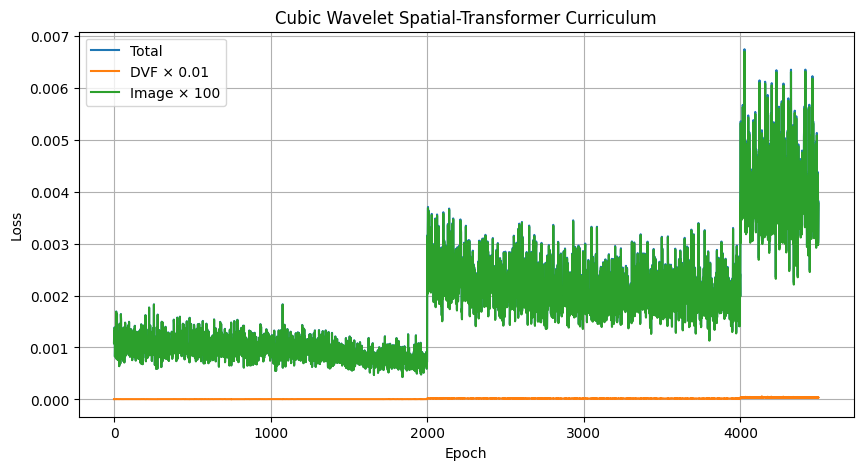

[Timing Epoch 4500] 6.8980 sec
Epoch 04600/80000 | Shift ±3 | Loss: 0.00401963 | DVF: 0.00331000 | Image: 0.00003987
[Timing Epoch 4600] 6.6224 sec


KeyboardInterrupt: 

In [19]:
# ============================================================
# Cubic Predicted-DVF Curriculum Pretraining
# FROM SCRATCH
#
# Synthetic true DVF:
#     coarse 8x16x16
#       -> Gaussian
#       -> Trilinear
#       -> 128x256x256
#
# Predicted DVF:
#     VoxelMorph
#       -> predicted DVF (64x128x128)
#
# Wavelet deformation:
#     Wavelet coefficients (64x128x128)
#       + predicted DVF
#       -> Cubic Spatial Sampling
#       -> warped Wavelet coefficients
#       -> Haar Synthesis
#       -> transformed image (128x256x256)
#
# Curriculum:
#     Epoch 1-2000       : ±1 voxel
#     Epoch 2001-4000    : ±2 voxels
#     Epoch 4001-6000    : ±3 voxels
#     ...
#     Epoch 78001-80000  : ±40 voxels
# ============================================================

from tqdm.notebook import tqdm
from IPython.display import clear_output

import os
import time
import numpy as np
import torch
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt

from pathlib import Path


# ============================================================
# 1. Gaussian smoothing
# ============================================================

def gaussian_smooth_3d(
    tensor,
    sigma=2.0
):
    from scipy.ndimage import gaussian_filter

    tensor_np = (
        tensor
        .detach()
        .cpu()
        .numpy()
    )

    smoothed_np = gaussian_filter(
        tensor_np,
        sigma=[
            0,
            0,
            sigma,
            sigma,
            sigma
        ]
    )

    return torch.as_tensor(
        smoothed_np,
        dtype=tensor.dtype,
        device=tensor.device
    )



# ============================================================
# 3. Training settings
# ============================================================

epochs = 80000

learning_rate = 1e-4

batch_size = 2

gaussian_sigma = 2.0


# ------------------------------------------------------------
# Curriculum
#
# 2000 epochごとに変位範囲を ±1 voxelずつ増加
#
# Epoch 1-2000       : ±1
# Epoch 2001-4000    : ±2
# ...
# Epoch 78001-80000  : ±40
# ------------------------------------------------------------

INITIAL_SHIFT = 1.0
SHIFT_STEP = 1.0
STEP_EPOCHS = 2000
MAX_SHIFT = 40.0


# ------------------------------------------------------------
# Loss weights
# ------------------------------------------------------------

DVF_WEIGHT = 0.01

IMAGE_WEIGHT = 100.0


# ============================================================
# 4. Save paths
# ============================================================

CHECKPOINT_DIR = Path(
    "cubic_curriculum_checkpoints"
)

CHECKPOINT_DIR.mkdir(
    exist_ok=True
)


LATEST_PATH = Path(
    "model_DVF_cubic_pretrain_latest.pth"
)


FINAL_PATH = Path(
    "model_DVF_cubic_pretrain_final.pth"
)


# ============================================================
# 5. Training generator
# ============================================================

train_generator_cubic = vxm_data_generator(
    x_train,
    batch_size=batch_size
)


# ============================================================
# 6. Model
#
# ★ 完全に新規初期化
# ============================================================

model3D_cubic = (
    vxm.networks.VxmDense_128_256_256(
        (128, 256, 256),
        nb_features,
        int_steps=0
    )
    .to(device)
)


# ============================================================
# 7. Optimizer
# ============================================================

optimizer_cubic = optim.Adam(
    model3D_cubic.parameters(),
    lr=learning_rate
)


# ============================================================
# 9. AMP
# ============================================================

use_amp = torch.cuda.is_available()


scaler_cubic = torch.cuda.amp.GradScaler(
    enabled=use_amp
)


# ============================================================
# 10. CUDA settings
# ============================================================

if torch.cuda.is_available():

    torch.backends.cudnn.benchmark = True

    torch.backends.cuda.matmul.allow_tf32 = True

    torch.backends.cudnn.allow_tf32 = True


# ============================================================
# 11. History
# ============================================================

losses = []

loss_vecs = []

loss_images = []


# ============================================================
# 12. Print settings
# ============================================================

print(
    "=" * 80
)

print(
    "CUBIC PREDICTED-DVF CURRICULUM TRAINING"
)

print(
    "=" * 80
)

print(
    "Start epoch        : 0"
)

print(
    "Final epoch        :",
    epochs
)

print(
    "Learning rate      :",
    learning_rate
)

print(
    "Batch size         :",
    batch_size
)

print(
    "Gaussian sigma     :",
    gaussian_sigma
)


print(
    "True DVF resize    : Trilinear"
)

print(
    "Wavelet warp       : Cubic Spatial Sampling"
)

print(
    "Cubic kernel       : Catmull-Rom (a=-0.5)"
)

print(
    "DVF loss weight    :",
    DVF_WEIGHT
)

print(
    "Image loss weight  :",
    IMAGE_WEIGHT
)

print(
    "AMP                :",
    use_amp
)

if torch.cuda.is_available():

    print(
        "GPU                :",
        torch.cuda.get_device_name(0)
    )


print(
    "=" * 80
)


# ============================================================
# 13. Timing
# ============================================================

PROFILE_FIRST_EPOCHS = 10

PROFILE_EVERY = 100


# ============================================================
# 14. Training
# ============================================================

model3D_cubic.train()


for epoch in tqdm(
    range(epochs)
):

    current_epoch = (
        epoch + 1
    )


    # ========================================================
    # Curriculum
    #
    # Epoch 1-2000       : ±1
    # Epoch 2001-4000    : ±2
    # Epoch 4001-6000    : ±3
    # ...
    # Epoch 78001-80000  : ±40
    # ========================================================

    current_epoch = epoch + 1

    shift_range = min(
        INITIAL_SHIFT
        + ((current_epoch - 1) // STEP_EPOCHS) * SHIFT_STEP,
        MAX_SHIFT
    )


    # ========================================================
    # Curriculum stage change log
    #
    # Epoch 1, 2001, 4001, ... のときだけ表示
    # ========================================================

    if (
        current_epoch == 1
        or (
            current_epoch > 1
            and (current_epoch - 1) % STEP_EPOCHS == 0
        )
    ):

        print()
        print("=" * 80)
        print("Curriculum stage changed")
        print(f"Epoch       : {current_epoch}")
        print(f"Shift range : ±{shift_range:.0f} voxels")
        print("=" * 80)

    # ========================================================
    # Timing
    # ========================================================

    do_profile = (
        current_epoch
        <= PROFILE_FIRST_EPOCHS
        or
        current_epoch
        % PROFILE_EVERY
        == 0
    )


    if (
        do_profile
        and
        torch.cuda.is_available()
    ):

        torch.cuda.synchronize()


    epoch_start = (
        time.perf_counter()
    )


    # ========================================================
    # Data
    # ========================================================

    train_batch, _ = next(
        train_generator_cubic
    )


    if torch.is_tensor(
        train_batch[0]
    ):

        moving_images = (
            train_batch[0]
            .to(
                device=device,
                dtype=torch.float32,
                non_blocking=True
            )
        )

    else:

        moving_images = torch.as_tensor(
            train_batch[0],
            dtype=torch.float32,
            device=device
        )


    B = moving_images.shape[
        0
    ]


    # ========================================================
    # 15. Coarse synthetic DVF
    #
    # (B,3,8,16,16)
    # ========================================================

    displacement_coarse = (
        (
            torch.rand(
                (
                    B,
                    3,
                    8,
                    16,
                    16
                ),
                dtype=torch.float32,
                device=device
            )
            * 2.0
        )
        - 1.0
    ) * shift_range


    # ========================================================
    # 16. Gaussian smoothing
    # ========================================================

    displacement_coarse = (
        gaussian_smooth_3d(
            displacement_coarse,
            sigma=gaussian_sigma
        )
    )


    # ========================================================
    # 17. Ground-truth DVF
    #
    # ★ ここはTrilinearのまま
    # ========================================================

    displacement_field_full = F.interpolate(
        displacement_coarse,
        size=(
            128,
            256,
            256
        ),
        mode="trilinear",
        align_corners=False
    )


    # ========================================================
    # 18. Low-resolution teacher DVF
    #
    # full-resolution
    #   ↓ Trilinear
    # wavelet resolution
    #
    # 変位量も1/2
    # ========================================================

    displacement_field_low = F.interpolate(
        displacement_field_full,
        size=(
            64,
            128,
            128
        ),
        mode="trilinear",
        align_corners=False
    ) / 2.0


    # ========================================================
    # 19. Create Moving'
    #
    # 正解DVF側は従来と同じ
    # ========================================================

    moving_prime = transformer256(
        moving_images,
        displacement_field_full
    )


    # ========================================================
    # 20. Wavelet analysis
    # ========================================================

    moving_w = analysis_fast(
        moving_images
    )

    moving_prime_w = analysis_fast(
        moving_prime
    )


    # ========================================================
    # Gradient reset
    # ========================================================

    optimizer_cubic.zero_grad(
        set_to_none=True
    )


    # ========================================================
    # 21. Forward
    # ========================================================

    with torch.cuda.amp.autocast(
        enabled=use_amp
    ):


        # ----------------------------------------------------
        # VoxelMorph prediction
        #
        # (B,3,64,128,128)
        # ----------------------------------------------------

        Vec = model3D_cubic(
            moving_w,
            moving_prime_w
        )
        

        # ★ここだけCubic interpolation版SpatialTransformer
        moving_warped = cubic_transformer(
            moving_w,
            Vec
        )

        transformed_image = synthesis_filter_3d_fast(
            moving_warped,
            synthesis_filters_fast
        )



        # ============================================================
        # Raw losses
        # ============================================================

        raw_loss_vec = MSE_Loss(
            displacement_field_low,
            Vec
        )

        raw_loss_image = MSE_Loss(
            moving_prime,
            transformed_image
        )


        # ============================================================
        # Weighted losses
        # ============================================================

        loss_vec = (
            raw_loss_vec
            * DVF_WEIGHT
        )

        loss_image = (
            raw_loss_image
            * IMAGE_WEIGHT
        )

        loss = (
            loss_vec
            +
            loss_image
        )


    # ========================================================
    # 22. Backward
    # ========================================================

    scaler_cubic.scale(
        loss
    ).backward()


    # ========================================================
    # 23. Optimizer
    # ========================================================

    scaler_cubic.step(
        optimizer_cubic
    )


    scaler_cubic.update()


    # ========================================================
    # 24. History
    # ========================================================

    loss_value = (
        loss
        .detach()
        .float()
        .cpu()
        .item()
    )


    loss_vec_value = (
        loss_vec
        .detach()
        .float()
        .cpu()
        .item()
    )


    loss_image_value = (
        loss_image
        .detach()
        .float()
        .cpu()
        .item()
    )


    losses.append(
        loss_value
    )


    loss_vecs.append(
        loss_vec_value
    )


    loss_images.append(
        loss_image_value
    )


    # ========================================================
    # 25. 100 epoch log
    # ========================================================

    if current_epoch % 100 == 0:

        print(
            f"Epoch "
            f"{current_epoch:05d}/"
            f"{epochs} | "
            f"Shift ±{shift_range:.0f} | "
            f"Loss: {loss_value:.8f} | "
            f"DVF: {raw_loss_vec.item():.8f} | "
            f"Image: {raw_loss_image.item():.8f}"
        )


    # ========================================================
    # 26. Latest checkpoint
    # ========================================================

    if current_epoch % 100 == 0:

        torch.save(
            {
                "epoch":
                    current_epoch,

                "model_state_dict":
                    model3D_cubic.state_dict(),

                "optimizer_state_dict":
                    optimizer_cubic.state_dict(),

                "scaler_state_dict":
                    scaler_cubic.state_dict(),

                "shift_range":
                    shift_range,

                "loss":
                    loss_value,

                "raw_dvf_loss":
                    raw_loss_vec.item(),

                "raw_image_loss":
                    raw_loss_image.item(),

                "interpolation":
                    "wavelet_spatial_transform_cubic_catmull_rom",

                "cubic_a":
                    -0.5,

                "learning_rate":
                    learning_rate,
            },
            LATEST_PATH
        )


    # ========================================================
    # 27. 1000 epoch checkpoint
    # ========================================================

    if current_epoch % 1000 == 0:

        checkpoint_path = (
            CHECKPOINT_DIR
            /
            f"cubic_pretrain_epoch_"
            f"{current_epoch:05d}.pth"
        )

        torch.save(
            {
                "epoch":
                    current_epoch,

                "model_state_dict":
                    model3D_cubic.state_dict(),

                "optimizer_state_dict":
                    optimizer_cubic.state_dict(),

                "scaler_state_dict":
                    scaler_cubic.state_dict(),

                "shift_range":
                    shift_range,

                "loss":
                    loss_value,

                "raw_dvf_loss":
                    raw_loss_vec.item(),

                "raw_image_loss":
                    raw_loss_image.item(),

                "interpolation":
                    "wavelet_spatial_transform_cubic_catmull_rom",

                "cubic_a":
                    -0.5,

                "learning_rate":
                    learning_rate,
            },
            checkpoint_path
        )

        print(
            f"Checkpoint saved: "
            f"{checkpoint_path}"
        )


    # ========================================================
    # 28. 1000 epoch observation
    # ========================================================

    if current_epoch % OBSERVE_EVERY == 0:

        observe_curriculum_progress(
            model=model3D_cubic,
            epoch=current_epoch,
            moving_image=observation_moving,
            shifts=OBSERVE_SHIFTS
        )

        observe_random_deformation_progress(
            model=model3D_cubic,
            epoch=current_epoch,
            moving_image=observation_moving
        )


    # ========================================================
    # 29. 500 epoch loss plot
    # ========================================================

    if current_epoch % 500 == 0:

        clear_output(
            wait=True
        )

        plt.figure(
            figsize=(
                10,
                5
            )
        )

        plt.plot(
            losses,
            label="Total"
        )

        plt.plot(
            loss_vecs,
            label="DVF × 0.01"
        )

        plt.plot(
            loss_images,
            label="Image × 100"
        )

        plt.xlabel(
            "Epoch"
        )

        plt.ylabel(
            "Loss"
        )

        plt.title(
            "Cubic Wavelet Spatial-Transformer Curriculum"
        )

        plt.legend()
        plt.grid(True)
        plt.show()


    # ========================================================
    # 30. Timing
    # ========================================================

    if do_profile:

        if torch.cuda.is_available():

            torch.cuda.synchronize()

        elapsed = (
            time.perf_counter()
            -
            epoch_start
        )

        print(
            f"[Timing "
            f"Epoch {current_epoch}] "
            f"{elapsed:.4f} sec"
        )

RANDOM SMOOTH DVF CUBIC RECONSTRUCTION TEST
Moving: (1, 1, 128, 256, 256)
Coarse DVF: (1, 3, 8, 16, 16)
Coarse DVF abs max: 8.104376792907715
Full true DVF: (1, 3, 128, 256, 256)
Full DVF abs max: 8.093637466430664
Low true DVF: (1, 3, 64, 128, 128)
Low DVF abs max: 4.041449546813965

MOVING' vs MOVED
MAE         : 9.5270201564e-03
MSE         : 8.0015975982e-04
RMSE        : 2.8287095949e-02
MAX abs     : 5.7558381557e-01
Relative L2 : 8.7308853865e-02
NCC         : 0.9941410422


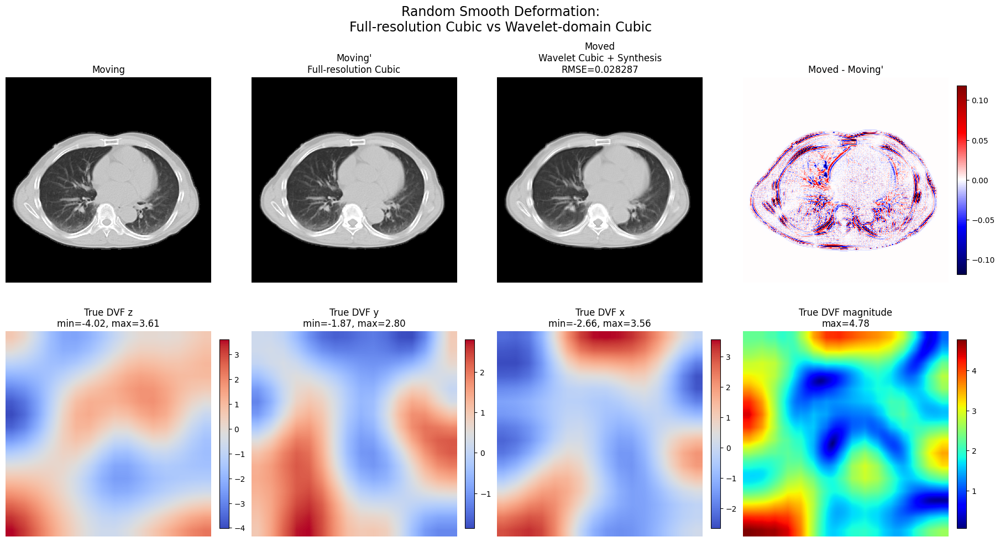

In [21]:
# ======================================================================
# RANDOM SMOOTH DVF
# CUBIC RECONSTRUCTION TEST
#
# 目的:
#
#   Moving
#      + smooth random true DVF
#      -> Full-resolution Cubic
#      -> Moving'
#
#   Moving
#      -> Haar DWT
#      + low-resolution true DVF
#      -> Cubic
#      -> Haar synthesis
#      -> Moved
#
#   Moving' と Moved がどこまで一致するか確認
#
# ★ VoxelMorphは使わない
# ★ 平行移動ではなく局所的な歪みを与える
# ======================================================================

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter


# ======================================================================
# 1. Settings
# ======================================================================

TEST_PATIENT_ID = 0

RANDOM_SEED = 20260904

# カリキュラムで確認したい最大変位
MAX_SHIFT = 40.0

# 学習時と同じ
GAUSSIAN_SIGMA = 2.0

# 粗いDVFサイズ
COARSE_SIZE = (
    8,
    16,
    16
)


# ======================================================================
# 2. Gaussian smoothing
# ======================================================================

def gaussian_smooth_3d_test(
    tensor,
    sigma=2.0
):

    tensor_np = (
        tensor
        .detach()
        .cpu()
        .numpy()
    )

    smoothed_np = gaussian_filter(
        tensor_np,
        sigma=[
            0,
            0,
            sigma,
            sigma,
            sigma
        ]
    )

    return torch.as_tensor(
        smoothed_np,
        dtype=tensor.dtype,
        device=tensor.device
    )


# ======================================================================
# 3. Metrics
# ======================================================================

def reconstruction_metrics(
    reference,
    prediction
):

    diff = (
        prediction
        -
        reference
    )

    mae = (
        diff
        .abs()
        .mean()
        .item()
    )

    mse = (
        diff
        .square()
        .mean()
        .item()
    )

    rmse = (
        diff
        .square()
        .mean()
        .sqrt()
        .item()
    )

    max_abs = (
        diff
        .abs()
        .max()
        .item()
    )


    # ----------------------------------------------------------
    # NCC
    # ----------------------------------------------------------

    ref = reference.flatten()

    pred = prediction.flatten()

    ref = (
        ref
        -
        ref.mean()
    )

    pred = (
        pred
        -
        pred.mean()
    )

    ncc = (
        torch.sum(
            ref
            *
            pred
        )
        /
        (
            torch.sqrt(
                torch.sum(
                    ref ** 2
                )
                *
                torch.sum(
                    pred ** 2
                )
            )
            +
            1e-12
        )
    ).item()


    # ----------------------------------------------------------
    # Relative L2
    # ----------------------------------------------------------

    relative_l2 = (
        torch.linalg.vector_norm(
            diff
        )
        /
        (
            torch.linalg.vector_norm(
                reference
            )
            +
            1e-12
        )
    ).item()


    return {
        "MAE":
            mae,

        "MSE":
            mse,

        "RMSE":
            rmse,

        "MAX":
            max_abs,

        "NCC":
            ncc,

        "Relative_L2":
            relative_l2,
    }


# ======================================================================
# 4. Load Moving
# ======================================================================

moving = (
    torch.from_numpy(
        np.ascontiguousarray(
            x_train[
                TEST_PATIENT_ID:
                TEST_PATIENT_ID + 1
            ],
            dtype=np.float32
        )
    )
    .unsqueeze(1)
    .to(device)
)


print("=" * 80)

print(
    "RANDOM SMOOTH DVF CUBIC RECONSTRUCTION TEST"
)

print("=" * 80)

print(
    "Moving:",
    tuple(
        moving.shape
    )
)


# ======================================================================
# 5. Generate random coarse DVF
#
# 学習時:
#   (B,3,8,16,16)
#
# channel:
#   0 = z
#   1 = y
#   2 = x
# ======================================================================

generator = torch.Generator(
    device="cpu"
)

generator.manual_seed(
    RANDOM_SEED
)


displacement_coarse = (
    (
        torch.rand(
            (
                1,
                3,
                *COARSE_SIZE
            ),
            generator=generator,
            dtype=torch.float32
        )
        *
        2.0
    )
    -
    1.0
) * MAX_SHIFT


# GPUへ
displacement_coarse = (
    displacement_coarse
    .to(device)
)


# ======================================================================
# 6. Gaussian smoothing
# ======================================================================

displacement_coarse = (
    gaussian_smooth_3d_test(
        displacement_coarse,
        sigma=GAUSSIAN_SIGMA
    )
)


print(
    "Coarse DVF:",
    tuple(
        displacement_coarse.shape
    )
)

print(
    "Coarse DVF abs max:",
    displacement_coarse
    .abs()
    .max()
    .item()
)


# ======================================================================
# 7. Full-resolution true DVF
#
# 8x16x16
#    ↓
# 128x256x256
# ======================================================================

true_flow_full = F.interpolate(
    displacement_coarse,
    size=(
        128,
        256,
        256
    ),
    mode="trilinear",
    align_corners=False
)


print(
    "Full true DVF:",
    tuple(
        true_flow_full.shape
    )
)

print(
    "Full DVF abs max:",
    true_flow_full
    .abs()
    .max()
    .item()
)


# ======================================================================
# 8. Low-resolution true DVF
#
# Wavelet resolution
#
# 128x256x256
#      ↓
# 64x128x128
#
# displacement magnitude / 2
# ======================================================================

true_flow_low = F.interpolate(
    true_flow_full,
    size=(
        64,
        128,
        128
    ),
    mode="trilinear",
    align_corners=False
) / 2.0


print(
    "Low true DVF:",
    tuple(
        true_flow_low.shape
    )
)

print(
    "Low DVF abs max:",
    true_flow_low
    .abs()
    .max()
    .item()
)


# ======================================================================
# 9. Full-resolution route
#
# Moving
#   +
# true DVF
#   ↓
# Cubic
#   ↓
# Moving'
# ======================================================================

with torch.no_grad():

    moving_prime = cubic_transformer256(
        moving,
        true_flow_full
    )


# ======================================================================
# 10. Wavelet route
#
# Moving
#   ↓
# Haar
#   ↓
# 8 bands
#   +
# low true DVF
#   ↓
# Cubic
#   ↓
# warped bands
#   ↓
# Haar synthesis
#   ↓
# Moved
# ======================================================================

with torch.no_grad():

    moving_w = analysis_fast(
        moving
    )

    moved_w = cubic_transformer(
        moving_w,
        true_flow_low
    )

    moved = synthesis_filter_3d_fast(
        moved_w,
        synthesis_filters_fast
    )


# ======================================================================
# 11. Metrics
# ======================================================================

metrics = reconstruction_metrics(
    moving_prime,
    moved
)


print()

print("=" * 80)

print(
    "MOVING' vs MOVED"
)

print("=" * 80)

print(
    f"MAE         : "
    f"{metrics['MAE']:.10e}"
)

print(
    f"MSE         : "
    f"{metrics['MSE']:.10e}"
)

print(
    f"RMSE        : "
    f"{metrics['RMSE']:.10e}"
)

print(
    f"MAX abs     : "
    f"{metrics['MAX']:.10e}"
)

print(
    f"Relative L2 : "
    f"{metrics['Relative_L2']:.10e}"
)

print(
    f"NCC         : "
    f"{metrics['NCC']:.10f}"
)


# ======================================================================
# 12. Image visualization
# ======================================================================

slice_index = (
    moving.shape[2]
    //
    2
)

flow_slice = (
    true_flow_full.shape[2]
    //
    2
)


moving_np = (
    moving[
        0,
        0,
        slice_index
    ]
    .detach()
    .cpu()
    .numpy()
)

moving_prime_np = (
    moving_prime[
        0,
        0,
        slice_index
    ]
    .detach()
    .cpu()
    .numpy()
)

moved_np = (
    moved[
        0,
        0,
        slice_index
    ]
    .detach()
    .cpu()
    .numpy()
)

difference_np = (
    moved_np
    -
    moving_prime_np
)


# ======================================================================
# Display range
# ======================================================================

vmin, vmax = np.percentile(
    moving_np,
    [
        1,
        99
    ]
)


diff_limit = max(
    np.percentile(
        np.abs(
            difference_np
        ),
        99
    ),
    1e-8
)


# ======================================================================
# 13. Images
# ======================================================================

fig, axes = plt.subplots(
    2,
    4,
    figsize=(
        18,
        10
    ),
    constrained_layout=True
)


# ----------------------------------------------------------------------
# Moving
# ----------------------------------------------------------------------

axes[
    0,
    0
].imshow(
    moving_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)

axes[
    0,
    0
].set_title(
    "Moving"
)


# ----------------------------------------------------------------------
# Moving'
# ----------------------------------------------------------------------

axes[
    0,
    1
].imshow(
    moving_prime_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)

axes[
    0,
    1
].set_title(
    "Moving'\n"
    "Full-resolution Cubic"
)


# ----------------------------------------------------------------------
# Moved
# ----------------------------------------------------------------------

axes[
    0,
    2
].imshow(
    moved_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)

axes[
    0,
    2
].set_title(
    "Moved\n"
    "Wavelet Cubic + Synthesis\n"
    f"RMSE={metrics['RMSE']:.6f}"
)


# ----------------------------------------------------------------------
# Difference
# ----------------------------------------------------------------------

diff_image = axes[
    0,
    3
].imshow(
    difference_np,
    cmap="seismic",
    vmin=-diff_limit,
    vmax=diff_limit
)

axes[
    0,
    3
].set_title(
    "Moved - Moving'"
)

fig.colorbar(
    diff_image,
    ax=axes[
        0,
        3
    ],
    fraction=0.046,
    pad=0.04
)


# ======================================================================
# 14. DVF visualization
# ======================================================================

for component, name in enumerate(
    [
        "z",
        "y",
        "x"
    ]
):

    flow_np = (
        true_flow_full[
            0,
            component,
            flow_slice
        ]
        .detach()
        .cpu()
        .numpy()
    )

    dvf_image = axes[
        1,
        component
    ].imshow(
        flow_np,
        cmap="coolwarm"
    )

    axes[
        1,
        component
    ].set_title(
        f"True DVF {name}\n"
        f"min={flow_np.min():.2f}, "
        f"max={flow_np.max():.2f}"
    )

    fig.colorbar(
        dvf_image,
        ax=axes[
            1,
            component
        ],
        fraction=0.046,
        pad=0.04
    )


# ----------------------------------------------------------------------
# DVF magnitude
# ----------------------------------------------------------------------

flow_magnitude = torch.sqrt(
    torch.sum(
        true_flow_full ** 2,
        dim=1
    )
)

flow_magnitude_np = (
    flow_magnitude[
        0,
        flow_slice
    ]
    .detach()
    .cpu()
    .numpy()
)


mag_image = axes[
    1,
    3
].imshow(
    flow_magnitude_np,
    cmap="jet"
)

axes[
    1,
    3
].set_title(
    "True DVF magnitude\n"
    f"max={flow_magnitude_np.max():.2f}"
)

fig.colorbar(
    mag_image,
    ax=axes[
        1,
        3
    ],
    fraction=0.046,
    pad=0.04
)


# ======================================================================
# Remove axes
# ======================================================================

for ax in axes.flat:

    ax.axis(
        "off"
    )


fig.suptitle(
    "Random Smooth Deformation:\n"
    "Full-resolution Cubic vs Wavelet-domain Cubic",
    fontsize=17
)

plt.show()

RANDOM SMOOTH DVF
CUBIC FULL vs CUBIC WAVELET RECONSTRUCTION TEST
Moving shape : (1, 1, 128, 256, 256)
Patient ID   : 0
Max shift    : 40.0
Gaussian σ   : 2.0
Wavelet shape: (1, 8, 64, 128, 128)

Random deformation seed = 20260901
Full DVF abs max : 6.1011
Low DVF abs max  : 3.0488
MAE              : 9.27812047e-03
RMSE             : 2.77572889e-02
MAX error        : 5.61827302e-01
Relative L2      : 8.63682628e-02
NCC              : 0.99430853

Random deformation seed = 20260902
Full DVF abs max : 9.0474
Low DVF abs max  : 4.5237
MAE              : 9.55391675e-03
RMSE             : 2.84884684e-02
MAX error        : 5.73036432e-01
Relative L2      : 8.77526477e-02
NCC              : 0.99406874

Random deformation seed = 20260903
Full DVF abs max : 9.6546
Low DVF abs max  : 4.8273
MAE              : 9.50709358e-03
RMSE             : 2.75874995e-02
MAX error        : 5.97010911e-01
Relative L2      : 8.50637853e-02
NCC              : 0.99443316

Random deformation seed = 20260904
Full DV

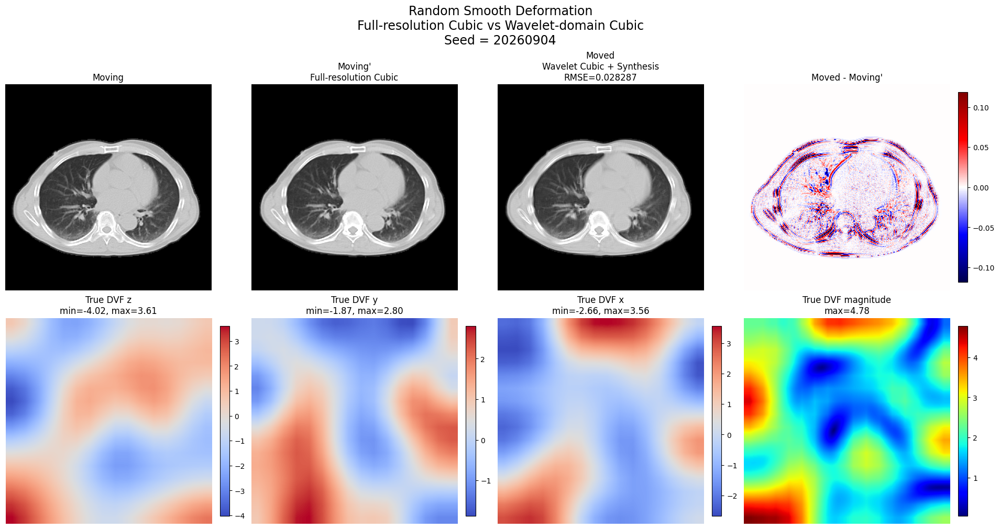

In [19]:
# ======================================================================
# RANDOM SMOOTH DVF - CUBIC RECONSTRUCTION TEST
#
# 目的:
#
# Full-resolution route
# Moving
#   + smooth random true DVF (128x256x256)
#   -> Cubic
#   -> Moving'
#
# Wavelet route
# Moving
#   -> Haar Analysis
#   + same true DVF / 2 (64x128x128)
#   -> Cubic
#   -> Haar Synthesis
#   -> Moved
#
# Moving' vs Moved を比較
#
# ★ VoxelMorph / predicted DVF は使用しない
# ★ 単純平行移動ではなく、局所的な滑らかな変形
# ======================================================================

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from tabulate import tabulate


# ======================================================================
# 1. Settings
# ======================================================================

TEST_PATIENT_ID = 0

# 複数の異なる歪みで検証
TEST_SEEDS = [
    20260901,
    20260902,
    20260903,
    20260904,
    20260905,
]

# 学習時の最大変位と合わせる
MAX_SHIFT = 40.0

# 学習時と同じGaussian smoothing
GAUSSIAN_SIGMA = 2.0

# coarse DVF
COARSE_SIZE = (
    8,
    16,
    16
)

# 表示するseed
DISPLAY_SEED = 20260904


# ======================================================================
# 2. Gaussian smoothing
# ======================================================================

def gaussian_smooth_3d_test(
    tensor,
    sigma=2.0
):

    tensor_np = (
        tensor
        .detach()
        .cpu()
        .numpy()
    )

    smoothed_np = gaussian_filter(
        tensor_np,
        sigma=[
            0,
            0,
            sigma,
            sigma,
            sigma
        ]
    )

    return torch.as_tensor(
        smoothed_np,
        dtype=tensor.dtype,
        device=tensor.device
    )


# ======================================================================
# 3. Metrics
# ======================================================================

def reconstruction_metrics(
    reference,
    prediction
):

    diff = (
        prediction
        -
        reference
    )

    mae = (
        diff
        .abs()
        .mean()
        .item()
    )

    mse = (
        diff
        .square()
        .mean()
        .item()
    )

    rmse = (
        diff
        .square()
        .mean()
        .sqrt()
        .item()
    )

    max_abs = (
        diff
        .abs()
        .max()
        .item()
    )


    # --------------------------------------------------------------
    # Relative L2
    # --------------------------------------------------------------

    relative_l2 = (
        torch.linalg.vector_norm(
            diff
        )
        /
        (
            torch.linalg.vector_norm(
                reference
            )
            +
            1e-12
        )
    ).item()


    # --------------------------------------------------------------
    # NCC
    # --------------------------------------------------------------

    ref_flat = reference.flatten()

    pred_flat = prediction.flatten()

    ref_centered = (
        ref_flat
        -
        ref_flat.mean()
    )

    pred_centered = (
        pred_flat
        -
        pred_flat.mean()
    )

    ncc = (
        torch.sum(
            ref_centered
            *
            pred_centered
        )
        /
        (
            torch.sqrt(
                torch.sum(
                    ref_centered ** 2
                )
                *
                torch.sum(
                    pred_centered ** 2
                )
            )
            +
            1e-12
        )
    ).item()


    return {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAX": max_abs,
        "Relative L2": relative_l2,
        "NCC": ncc,
    }


# ======================================================================
# 4. Load patient
# ======================================================================

moving = (
    torch.from_numpy(
        np.ascontiguousarray(
            x_train[
                TEST_PATIENT_ID:
                TEST_PATIENT_ID + 1
            ],
            dtype=np.float32
        )
    )
    .unsqueeze(1)
    .to(device)
)


print("=" * 90)
print("RANDOM SMOOTH DVF")
print("CUBIC FULL vs CUBIC WAVELET RECONSTRUCTION TEST")
print("=" * 90)

print(
    "Moving shape :",
    tuple(moving.shape)
)

print(
    "Patient ID   :",
    TEST_PATIENT_ID
)

print(
    "Max shift    :",
    MAX_SHIFT
)

print(
    "Gaussian σ   :",
    GAUSSIAN_SIGMA
)


# ======================================================================
# 5. Haar analysis
#
# Movingは全seedで共通なので1回だけ
# ======================================================================

with torch.no_grad():

    moving_w = analysis_fast(
        moving
    )


print(
    "Wavelet shape:",
    tuple(moving_w.shape)
)


# ======================================================================
# 6. Evaluation
# ======================================================================

results = []

saved_data = {}


with torch.no_grad():

    for seed in TEST_SEEDS:

        print()
        print(
            "=" * 70
        )

        print(
            f"Random deformation seed = {seed}"
        )

        print(
            "=" * 70
        )


        # ==============================================================
        # 6-1. Random coarse true DVF
        #
        # (1,3,8,16,16)
        #
        # channel:
        #   0 = z
        #   1 = y
        #   2 = x
        # ==============================================================

        generator = torch.Generator(
            device="cpu"
        )

        generator.manual_seed(
            seed
        )


        displacement_coarse = (
            (
                torch.rand(
                    (
                        1,
                        3,
                        *COARSE_SIZE
                    ),
                    generator=generator,
                    dtype=torch.float32
                )
                *
                2.0
            )
            -
            1.0
        ) * MAX_SHIFT


        displacement_coarse = (
            displacement_coarse
            .to(device)
        )


        # ==============================================================
        # 6-2. Gaussian smoothing
        #
        # 学習時と同じ
        # ==============================================================

        displacement_coarse = (
            gaussian_smooth_3d_test(
                displacement_coarse,
                sigma=GAUSSIAN_SIGMA
            )
        )


        # ==============================================================
        # 6-3. Full-resolution true DVF
        #
        # 8x16x16
        #    ↓ Trilinear resize
        # 128x256x256
        # ==============================================================

        true_flow_full = F.interpolate(
            displacement_coarse,
            size=(
                128,
                256,
                256
            ),
            mode="trilinear",
            align_corners=False
        )


        # ==============================================================
        # 6-4. Low-resolution true DVF
        #
        # Wavelet空間:
        # 64x128x128
        #
        # 変位量も / 2
        # ==============================================================

        true_flow_low = F.interpolate(
            true_flow_full,
            size=(
                64,
                128,
                128
            ),
            mode="trilinear",
            align_corners=False
        ) / 2.0


        # ==============================================================
        # 6-5. Full-resolution route
        #
        # Moving
        #   + true_flow_full
        #   ↓
        # Catmull-Rom Cubic
        #   ↓
        # Moving'
        # ==============================================================

        moving_prime = cubic_transformer256(
            moving,
            true_flow_full
        )


        # ==============================================================
        # 6-6. Wavelet route
        #
        # Moving
        #   ↓ Haar
        # Moving_w
        #   +
        # true_flow_low
        #   ↓ Cubic
        # moved_w
        #   ↓ Haar synthesis
        # Moved
        # ==============================================================

        moved_w = cubic_transformer(
            moving_w,
            true_flow_low
        )


        moved = synthesis_filter_3d_fast(
            moved_w,
            synthesis_filters_fast
        )


        # ==============================================================
        # 6-7. Metrics
        # ==============================================================

        metrics = reconstruction_metrics(
            moving_prime,
            moved
        )


        full_absmax = (
            true_flow_full
            .abs()
            .max()
            .item()
        )

        low_absmax = (
            true_flow_low
            .abs()
            .max()
            .item()
        )


        results.append({
            "Seed":
                seed,

            "Full DVF max":
                full_absmax,

            "Low DVF max":
                low_absmax,

            **metrics
        })


        # ==============================================================
        # 6-8. Save visualization data
        # ==============================================================

        if seed == DISPLAY_SEED:

            saved_data = {

                "moving":
                    moving.detach().cpu(),

                "moving_prime":
                    moving_prime.detach().cpu(),

                "moved":
                    moved.detach().cpu(),

                "difference":
                    (
                        moved
                        -
                        moving_prime
                    ).detach().cpu(),

                "true_flow_full":
                    true_flow_full.detach().cpu(),

                "true_flow_low":
                    true_flow_low.detach().cpu(),
            }


        print(
            f"Full DVF abs max : "
            f"{full_absmax:.4f}"
        )

        print(
            f"Low DVF abs max  : "
            f"{low_absmax:.4f}"
        )

        print(
            f"MAE              : "
            f"{metrics['MAE']:.8e}"
        )

        print(
            f"RMSE             : "
            f"{metrics['RMSE']:.8e}"
        )

        print(
            f"MAX error        : "
            f"{metrics['MAX']:.8e}"
        )

        print(
            f"Relative L2      : "
            f"{metrics['Relative L2']:.8e}"
        )

        print(
            f"NCC              : "
            f"{metrics['NCC']:.8f}"
        )


# ======================================================================
# 7. Result table
# ======================================================================

table = []

for result in results:

    table.append([
        result["Seed"],
        result["Full DVF max"],
        result["Low DVF max"],
        result["MAE"],
        result["MSE"],
        result["RMSE"],
        result["MAX"],
        result["Relative L2"],
        result["NCC"],
    ])


print()
print("=" * 120)
print("RANDOM DEFORMATION CUBIC RECONSTRUCTION RESULTS")
print("=" * 120)

print(
    tabulate(
        table,
        headers=[
            "Seed",
            "Full DVF max",
            "Low DVF max",
            "MAE",
            "MSE",
            "RMSE",
            "MAX abs",
            "Relative L2",
            "NCC"
        ],
        floatfmt=[
            ".0f",
            ".4f",
            ".4f",
            ".8e",
            ".8e",
            ".8e",
            ".8e",
            ".8e",
            ".8f"
        ],
        tablefmt="github"
    )
)


# ======================================================================
# 8. Mean ± SD
# ======================================================================

metric_names = [
    "MAE",
    "MSE",
    "RMSE",
    "MAX",
    "Relative L2",
    "NCC"
]


print()
print("=" * 90)
print("MEAN ± SD")
print("=" * 90)


for name in metric_names:

    values = np.array(
        [
            result[name]
            for result in results
        ],
        dtype=np.float64
    )

    print(
        f"{name:12s}: "
        f"{values.mean():.8e} "
        f"± "
        f"{values.std(ddof=1):.8e}"
    )


# ======================================================================
# 9. Visualization
# ======================================================================

if len(saved_data) == 0:

    raise RuntimeError(
        f"DISPLAY_SEED={DISPLAY_SEED} "
        "is not included in TEST_SEEDS."
    )


slice_index = (
    moving.shape[2]
    //
    2
)

flow_slice = (
    saved_data[
        "true_flow_full"
    ].shape[2]
    //
    2
)


moving_np = (
    saved_data[
        "moving"
    ][
        0,
        0,
        slice_index
    ]
    .numpy()
)


moving_prime_np = (
    saved_data[
        "moving_prime"
    ][
        0,
        0,
        slice_index
    ]
    .numpy()
)


moved_np = (
    saved_data[
        "moved"
    ][
        0,
        0,
        slice_index
    ]
    .numpy()
)


difference_np = (
    saved_data[
        "difference"
    ][
        0,
        0,
        slice_index
    ]
    .numpy()
)


# ======================================================================
# 10. Display ranges
# ======================================================================

vmin, vmax = np.percentile(
    moving_np,
    [
        1,
        99
    ]
)


diff_limit = max(
    float(
        np.percentile(
            np.abs(
                difference_np
            ),
            99
        )
    ),
    1e-8
)


# ======================================================================
# 11. Image + DVF visualization
# ======================================================================

figure, axes = plt.subplots(
    2,
    4,
    figsize=(
        19,
        10
    ),
    constrained_layout=True
)


# ----------------------------------------------------------------------
# Moving
# ----------------------------------------------------------------------

axes[
    0,
    0
].imshow(
    moving_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)

axes[
    0,
    0
].set_title(
    "Moving"
)


# ----------------------------------------------------------------------
# Moving'
# ----------------------------------------------------------------------

axes[
    0,
    1
].imshow(
    moving_prime_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)

axes[
    0,
    1
].set_title(
    "Moving'\n"
    "Full-resolution Cubic"
)


# ----------------------------------------------------------------------
# Moved
# ----------------------------------------------------------------------

axes[
    0,
    2
].imshow(
    moved_np,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)


display_result = next(
    result
    for result in results
    if result["Seed"] == DISPLAY_SEED
)


axes[
    0,
    2
].set_title(
    "Moved\n"
    "Wavelet Cubic + Synthesis\n"
    f"RMSE={display_result['RMSE']:.6f}"
)


# ----------------------------------------------------------------------
# Difference
# ----------------------------------------------------------------------

difference_image = axes[
    0,
    3
].imshow(
    difference_np,
    cmap="seismic",
    vmin=-diff_limit,
    vmax=diff_limit
)


axes[
    0,
    3
].set_title(
    "Moved - Moving'"
)


figure.colorbar(
    difference_image,
    ax=axes[
        0,
        3
    ],
    fraction=0.046,
    pad=0.04
)


# ======================================================================
# 12. DVF components
# ======================================================================

for component, name in enumerate(
    [
        "z",
        "y",
        "x"
    ]
):

    flow_np = (
        saved_data[
            "true_flow_full"
        ][
            0,
            component,
            flow_slice
        ]
        .numpy()
    )


    dvf_image = axes[
        1,
        component
    ].imshow(
        flow_np,
        cmap="coolwarm"
    )


    axes[
        1,
        component
    ].set_title(
        f"True DVF {name}\n"
        f"min={flow_np.min():.2f}, "
        f"max={flow_np.max():.2f}"
    )


    figure.colorbar(
        dvf_image,
        ax=axes[
            1,
            component
        ],
        fraction=0.046,
        pad=0.04
    )


# ======================================================================
# 13. DVF magnitude
# ======================================================================

flow_full = saved_data[
    "true_flow_full"
]


flow_magnitude = torch.sqrt(
    torch.sum(
        flow_full ** 2,
        dim=1
    )
)


flow_magnitude_np = (
    flow_magnitude[
        0,
        flow_slice
    ]
    .numpy()
)


magnitude_image = axes[
    1,
    3
].imshow(
    flow_magnitude_np,
    cmap="jet"
)


axes[
    1,
    3
].set_title(
    "True DVF magnitude\n"
    f"max={flow_magnitude_np.max():.2f}"
)


figure.colorbar(
    magnitude_image,
    ax=axes[
        1,
        3
    ],
    fraction=0.046,
    pad=0.04
)


for ax in axes.flat:

    ax.axis(
        "off"
    )


figure.suptitle(
    "Random Smooth Deformation\n"
    "Full-resolution Cubic vs Wavelet-domain Cubic\n"
    f"Seed = {DISPLAY_SEED}",
    fontsize=17
)


plt.show()

ARTIFICIAL SMOOTH DVF CUBIC RECONSTRUCTION TEST
Moving shape : (1, 1, 128, 256, 256)
Patient ID   : 0
Shift levels : [0.0, 10.0, 20.0, 30.0, 40.0]
Wavelet shape: (1, 8, 64, 128, 128)
Normalized coarse DVF abs max: 1.0

Artificial deformation = 0 px
Full DVF max : 0.0000 px
Low DVF max  : 0.0000 px
MAE          : 3.97829112e-08
RMSE         : 7.38223846e-08
NCC          : 0.99999988

Artificial deformation = 10 px
Full DVF max : 9.9867 px
Low DVF max  : 4.9867 px
MAE          : 9.69122443e-03
RMSE         : 2.86474582e-02
NCC          : 0.99397737

Artificial deformation = 20 px
Full DVF max : 19.9735 px
Low DVF max  : 9.9735 px
MAE          : 9.40485857e-03
RMSE         : 2.82007847e-02
NCC          : 0.99409342

Artificial deformation = 30 px
Full DVF max : 29.9602 px
Low DVF max  : 14.9602 px
MAE          : 9.19747725e-03
RMSE         : 2.79229172e-02
NCC          : 0.99413842

Artificial deformation = 40 px
Full DVF max : 39.9470 px
Low DVF max  : 19.9470 px
MAE          : 9.1406013

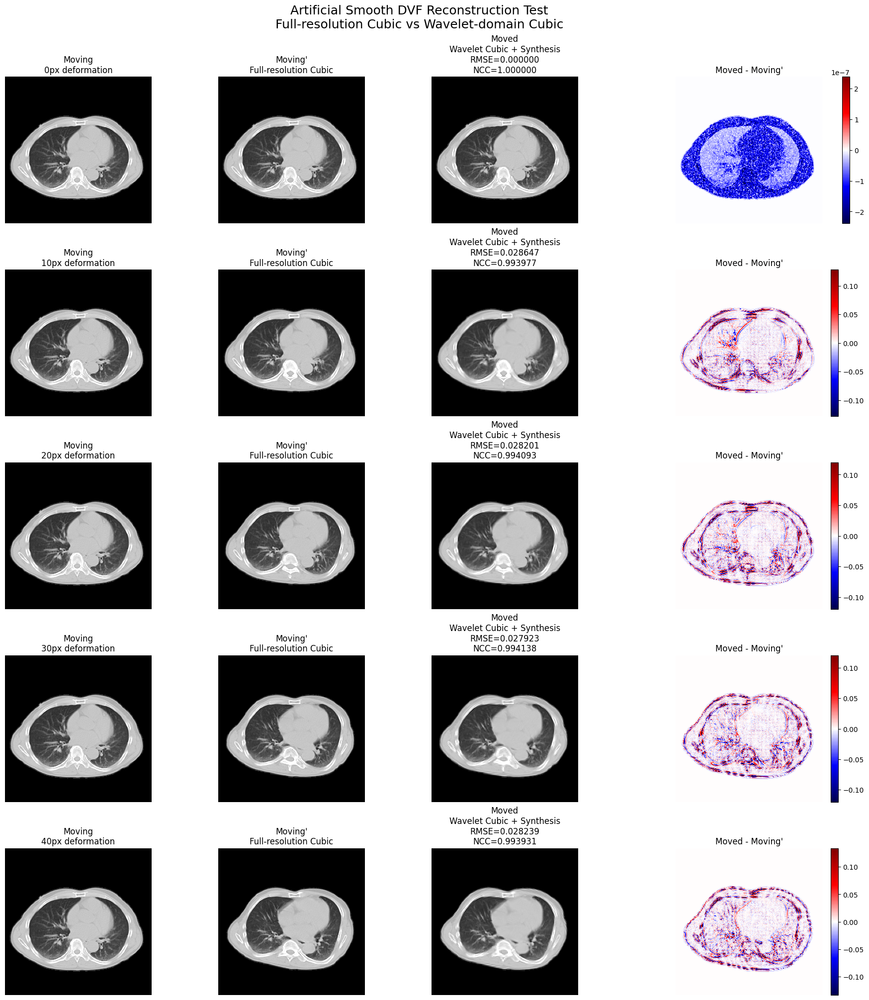

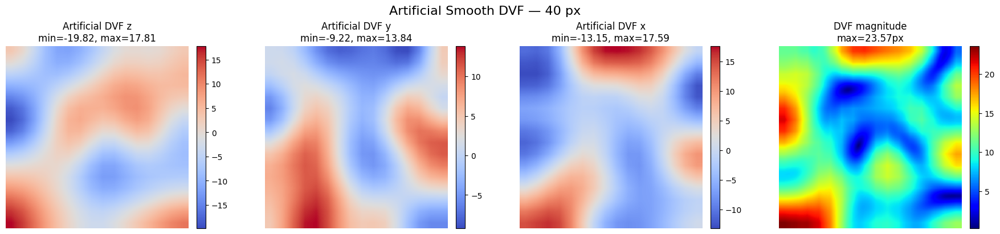

In [20]:
# ======================================================================
# ARTIFICIAL SMOOTH DVF RECONSTRUCTION TEST
#
# VoxelMorphなし
#
# 1, 10, 20, 30, 40 px の人工DVFを作成し、
#
# Full-resolution route:
#   Moving
#      + true DVF
#      -> Cubic
#      -> Moving'
#
# Wavelet route:
#   Moving
#      -> Haar Analysis
#      + true DVF / 2
#      -> Cubic
#      -> Haar Synthesis
#      -> Moved
#
# Moving' vs Moved を画像・数値で比較
# ======================================================================

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from tabulate import tabulate


# ======================================================================
# 1. Settings
# ======================================================================

TEST_PATIENT_ID = 0

# 1px → 10px → 20px → 30px → 40px
TEST_SHIFT_LEVELS = [
    0.0,
    10.0,
    20.0,
    30.0,
    40.0,
]

# 全段階で同じ「歪み形状」を使う
# 振幅だけ1,10,20,30,40倍にする
RANDOM_SEED = 20260904

GAUSSIAN_SIGMA = 2.0

COARSE_SIZE = (
    8,
    16,
    16
)


# ======================================================================
# 2. Gaussian smoothing
# ======================================================================

def gaussian_smooth_3d_test(
    tensor,
    sigma=2.0
):

    tensor_np = (
        tensor
        .detach()
        .cpu()
        .numpy()
    )

    smoothed_np = gaussian_filter(
        tensor_np,
        sigma=[
            0,
            0,
            sigma,
            sigma,
            sigma
        ]
    )

    return torch.as_tensor(
        smoothed_np,
        dtype=tensor.dtype,
        device=tensor.device
    )


# ======================================================================
# 3. Metrics
# ======================================================================

def reconstruction_metrics(
    reference,
    prediction
):

    diff = (
        prediction
        -
        reference
    )

    mae = (
        diff
        .abs()
        .mean()
        .item()
    )

    mse = (
        diff
        .square()
        .mean()
        .item()
    )

    rmse = (
        diff
        .square()
        .mean()
        .sqrt()
        .item()
    )

    max_abs = (
        diff
        .abs()
        .max()
        .item()
    )

    relative_l2 = (
        torch.linalg.vector_norm(
            diff
        )
        /
        (
            torch.linalg.vector_norm(
                reference
            )
            +
            1e-12
        )
    ).item()


    # NCC
    ref_flat = (
        reference
        .flatten()
    )

    pred_flat = (
        prediction
        .flatten()
    )

    ref_centered = (
        ref_flat
        -
        ref_flat.mean()
    )

    pred_centered = (
        pred_flat
        -
        pred_flat.mean()
    )

    ncc = (
        torch.sum(
            ref_centered
            *
            pred_centered
        )
        /
        (
            torch.sqrt(
                torch.sum(
                    ref_centered ** 2
                )
                *
                torch.sum(
                    pred_centered ** 2
                )
            )
            +
            1e-12
        )
    ).item()


    return {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "MAX": max_abs,
        "Relative L2": relative_l2,
        "NCC": ncc,
    }


# ======================================================================
# 4. Load Moving
# ======================================================================

moving = (
    torch.from_numpy(
        np.ascontiguousarray(
            x_train[
                TEST_PATIENT_ID:
                TEST_PATIENT_ID + 1
            ],
            dtype=np.float32
        )
    )
    .unsqueeze(1)
    .to(device)
)


print("=" * 90)
print("ARTIFICIAL SMOOTH DVF CUBIC RECONSTRUCTION TEST")
print("=" * 90)

print(
    "Moving shape :",
    tuple(moving.shape)
)

print(
    "Patient ID   :",
    TEST_PATIENT_ID
)

print(
    "Shift levels :",
    TEST_SHIFT_LEVELS
)


# ======================================================================
# 5. Haar Analysis
#
# Movingは全条件で同じなので1回だけ
# ======================================================================

with torch.no_grad():

    moving_w = analysis_fast(
        moving
    )


print(
    "Wavelet shape:",
    tuple(moving_w.shape)
)


# ======================================================================
# 6. Base artificial DVF
#
# 重要:
# 1,10,20,30,40で毎回ランダム形状を変えるのではなく、
# 同じ歪み形状を使って振幅だけ変える。
#
# これで「変位量が大きくなると再構成誤差がどう変わるか」
# を公平に比較できる。
# ======================================================================

generator = torch.Generator(
    device="cpu"
)

generator.manual_seed(
    RANDOM_SEED
)


base_coarse_flow = (
    (
        torch.rand(
            (
                1,
                3,
                *COARSE_SIZE
            ),
            generator=generator,
            dtype=torch.float32
        )
        *
        2.0
    )
    -
    1.0
)


base_coarse_flow = (
    base_coarse_flow
    .to(device)
)


# Gaussian smoothing
base_coarse_flow = (
    gaussian_smooth_3d_test(
        base_coarse_flow,
        sigma=GAUSSIAN_SIGMA
    )
)


# ======================================================================
# 7. Normalize base DVF
#
# Gaussian後の最大絶対値を1.0にする
#
# こうしておけば、
#
# level = 1  → 実際の最大変位 ≒ 1px
# level = 10 → 実際の最大変位 ≒ 10px
# ...
# level = 40 → 実際の最大変位 ≒ 40px
#
# になる。
# ======================================================================

base_absmax = (
    base_coarse_flow
    .abs()
    .max()
)


base_coarse_flow = (
    base_coarse_flow
    /
    (
        base_absmax
        +
        1e-12
    )
)


print(
    "Normalized coarse DVF abs max:",
    base_coarse_flow
    .abs()
    .max()
    .item()
)


# ======================================================================
# 8. Evaluation
# ======================================================================

results = []

saved_data = {}


with torch.no_grad():

    for shift_level in TEST_SHIFT_LEVELS:

        print()
        print("=" * 70)
        print(
            f"Artificial deformation = {shift_level:.0f} px"
        )
        print("=" * 70)


        # ==============================================================
        # 8-1. Coarse DVF
        #
        # 同じ形状 × 振幅
        # ==============================================================

        displacement_coarse = (
            base_coarse_flow
            *
            float(
                shift_level
            )
        )


        # ==============================================================
        # 8-2. Full-resolution DVF
        #
        # 8x16x16
        #    ↓
        # 128x256x256
        # ==============================================================

        true_flow_full = F.interpolate(
            displacement_coarse,
            size=(
                128,
                256,
                256
            ),
            mode="trilinear",
            align_corners=False
        )


        # ==============================================================
        # 8-3. Wavelet-resolution DVF
        #
        # 64x128x128
        #
        # 変位量も1/2
        # ==============================================================

        true_flow_low = F.interpolate(
            true_flow_full,
            size=(
                64,
                128,
                128
            ),
            mode="trilinear",
            align_corners=False
        ) / 2.0


        # ==============================================================
        # 8-4. Full-resolution Cubic
        #
        # Moving
        #   +
        # true_flow_full
        #   ↓
        # Cubic
        #   ↓
        # Moving'
        # ==============================================================

        moving_prime = cubic_transformer256(
            moving,
            true_flow_full
        )


        # ==============================================================
        # 8-5. Wavelet Cubic
        #
        # Moving
        #   ↓ Haar
        # Moving_w
        #   +
        # true_flow_low
        #   ↓ Cubic
        # moved_w
        #   ↓ Haar synthesis
        # Moved
        # ==============================================================

        moved_w = cubic_transformer(
            moving_w,
            true_flow_low
        )


        moved = synthesis_filter_3d_fast(
            moved_w,
            synthesis_filters_fast
        )


        # ==============================================================
        # 8-6. Metrics
        # ==============================================================

        metrics = reconstruction_metrics(
            moving_prime,
            moved
        )


        full_absmax = (
            true_flow_full
            .abs()
            .max()
            .item()
        )

        low_absmax = (
            true_flow_low
            .abs()
            .max()
            .item()
        )


        results.append(
            {
                "Shift":
                    shift_level,

                "Full DVF max":
                    full_absmax,

                "Low DVF max":
                    low_absmax,

                **metrics
            }
        )


        # ==============================================================
        # 8-7. Save images
        # ==============================================================

        saved_data[
            shift_level
        ] = {

            "moving":
                moving.detach().cpu(),

            "moving_prime":
                moving_prime.detach().cpu(),

            "moved":
                moved.detach().cpu(),

            "difference":
                (
                    moved
                    -
                    moving_prime
                ).detach().cpu(),

            "flow":
                true_flow_full.detach().cpu()
        }


        print(
            f"Full DVF max : "
            f"{full_absmax:.4f} px"
        )

        print(
            f"Low DVF max  : "
            f"{low_absmax:.4f} px"
        )

        print(
            f"MAE          : "
            f"{metrics['MAE']:.8e}"
        )

        print(
            f"RMSE         : "
            f"{metrics['RMSE']:.8e}"
        )

        print(
            f"NCC          : "
            f"{metrics['NCC']:.8f}"
        )


# ======================================================================
# 9. Result table
# ======================================================================

table = []

for result in results:

    table.append(
        [
            result["Shift"],
            result["Full DVF max"],
            result["Low DVF max"],
            result["MAE"],
            result["RMSE"],
            result["Relative L2"],
            result["NCC"],
        ]
    )


print()
print("=" * 110)
print("RECONSTRUCTION RESULTS")
print("=" * 110)

print(
    tabulate(
        table,
        headers=[
            "Target px",
            "Full DVF max",
            "Low DVF max",
            "MAE",
            "RMSE",
            "Relative L2",
            "NCC"
        ],
        floatfmt=[
            ".0f",
            ".4f",
            ".4f",
            ".8e",
            ".8e",
            ".8e",
            ".8f"
        ],
        tablefmt="github"
    )
)


# ======================================================================
# 10. Visualization
#
# 行:
#   1px
#   10px
#   20px
#   30px
#   40px
#
# 列:
#   Moving
#   Moving'
#   Moved
#   Difference
# ======================================================================

slice_index = (
    moving.shape[2]
    //
    2
)


moving_np_reference = (
    moving[
        0,
        0,
        slice_index
    ]
    .detach()
    .cpu()
    .numpy()
)


vmin, vmax = np.percentile(
    moving_np_reference,
    [
        1,
        99
    ]
)


figure, axes = plt.subplots(
    len(TEST_SHIFT_LEVELS),
    4,
    figsize=(
        18,
        4 * len(TEST_SHIFT_LEVELS)
    ),
    constrained_layout=True
)


for row, shift_level in enumerate(
    TEST_SHIFT_LEVELS
):

    data = saved_data[
        shift_level
    ]


    moving_np = (
        data[
            "moving"
        ][
            0,
            0,
            slice_index
        ]
        .numpy()
    )


    moving_prime_np = (
        data[
            "moving_prime"
        ][
            0,
            0,
            slice_index
        ]
        .numpy()
    )


    moved_np = (
        data[
            "moved"
        ][
            0,
            0,
            slice_index
        ]
        .numpy()
    )


    diff_np = (
        data[
            "difference"
        ][
            0,
            0,
            slice_index
        ]
        .numpy()
    )


    result = next(
        result
        for result in results
        if result["Shift"]
        ==
        shift_level
    )


    # ==============================================================
    # Moving
    # ==============================================================

    axes[
        row,
        0
    ].imshow(
        moving_np,
        cmap="gray",
        vmin=vmin,
        vmax=vmax
    )

    axes[
        row,
        0
    ].set_title(
        f"Moving\n"
        f"{shift_level:.0f}px deformation"
    )


    # ==============================================================
    # Moving'
    # ==============================================================

    axes[
        row,
        1
    ].imshow(
        moving_prime_np,
        cmap="gray",
        vmin=vmin,
        vmax=vmax
    )

    axes[
        row,
        1
    ].set_title(
        "Moving'\n"
        "Full-resolution Cubic"
    )


    # ==============================================================
    # Moved
    # ==============================================================

    axes[
        row,
        2
    ].imshow(
        moved_np,
        cmap="gray",
        vmin=vmin,
        vmax=vmax
    )

    axes[
        row,
        2
    ].set_title(
        "Moved\n"
        "Wavelet Cubic + Synthesis\n"
        f"RMSE={result['RMSE']:.6f}\n"
        f"NCC={result['NCC']:.6f}"
    )


    # ==============================================================
    # Difference
    # ==============================================================

    diff_limit = max(
        float(
            np.percentile(
                np.abs(
                    diff_np
                ),
                99
            )
        ),
        1e-8
    )


    diff_image = axes[
        row,
        3
    ].imshow(
        diff_np,
        cmap="seismic",
        vmin=-diff_limit,
        vmax=diff_limit
    )


    axes[
        row,
        3
    ].set_title(
        "Moved - Moving'"
    )


    figure.colorbar(
        diff_image,
        ax=axes[
            row,
            3
        ],
        fraction=0.046,
        pad=0.04
    )


    for column in range(
        4
    ):

        axes[
            row,
            column
        ].axis(
            "off"
        )


figure.suptitle(
    "Artificial Smooth DVF Reconstruction Test\n"
    "Full-resolution Cubic vs Wavelet-domain Cubic",
    fontsize=18
)


plt.show()


# ======================================================================
# 11. DVF visualization
#
# 40px時の人工DVFを表示
# ======================================================================

display_shift = 40.0

flow = saved_data[
    display_shift
][
    "flow"
]


flow_slice = (
    flow.shape[2]
    //
    2
)


figure, axes = plt.subplots(
    1,
    4,
    figsize=(
        18,
        4
    ),
    constrained_layout=True
)


# z / y / x
for component, name in enumerate(
    [
        "z",
        "y",
        "x"
    ]
):

    flow_np = (
        flow[
            0,
            component,
            flow_slice
        ]
        .numpy()
    )


    image = axes[
        component
    ].imshow(
        flow_np,
        cmap="coolwarm"
    )


    axes[
        component
    ].set_title(
        f"Artificial DVF {name}\n"
        f"min={flow_np.min():.2f}, "
        f"max={flow_np.max():.2f}"
    )


    figure.colorbar(
        image,
        ax=axes[
            component
        ],
        fraction=0.046,
        pad=0.04
    )


# magnitude
flow_magnitude = torch.sqrt(
    torch.sum(
        flow ** 2,
        dim=1
    )
)


flow_magnitude_np = (
    flow_magnitude[
        0,
        flow_slice
    ]
    .numpy()
)


image = axes[
    3
].imshow(
    flow_magnitude_np,
    cmap="jet"
)


axes[
    3
].set_title(
    "DVF magnitude\n"
    f"max={flow_magnitude_np.max():.2f}px"
)


figure.colorbar(
    image,
    ax=axes[
        3
    ],
    fraction=0.046,
    pad=0.04
)


for ax in axes:

    ax.axis(
        "off"
    )


figure.suptitle(
    "Artificial Smooth DVF — 40 px",
    fontsize=16
)


plt.show()

DEVICE
Device: cuda
GPU: NVIDIA GeForce RTX 3090
AMP: True

DATA
x_train shape: (400, 128, 256, 256)
x_train dtype: float32

FINAL FULL-RESOLUTION TEACHER CUBIC
Implementation : chunked_vectorized_64_neighbors
Interpolation : Catmull-Rom / Keys Cubic
Cubic a       : -0.5
Neighbors     : 64
Chunk depth   : 1
Target warp   : cubic_catmull_rom_chunked_vectorized
Boundary      : Out-of-bounds = 0
[64, 128, 128]

START FROM SCRATCH

FINAL PRODUCTION SETTINGS
Epochs                  : 80000
Learning rate           : 0.0001
Batch size              : 2
Curriculum              : ±1 -> ±40 pre-smoothing
Gaussian sigma          : 2.0
Teacher                 : chunked_vectorized_64_neighbors
Teacher chunk depth     : 1
Target image warp       : cubic_catmull_rom_chunked_vectorized
Wavelet warp            : Catmull-Rom Cubic
VoxelMorph              : VxmDense_128_256_256
AMP                     : True
Loss                    : FP32
Image weight            : 100.0
DVF weight              : 0.01

STA

Curriculum training:   0%|          | 0/80000 [00:00<?, ?it/s]


TENSOR SHAPES
Moving         : (2, 1, 128, 256, 256) torch.float32
Moving'        : (2, 1, 128, 256, 256) torch.float32
Moving Wavelet : (2, 8, 64, 128, 128) torch.float16
Target Wavelet : (2, 8, 64, 128, 128) torch.float16
True DVF full  : (2, 3, 128, 256, 256) torch.float32
True DVF low   : (2, 3, 64, 128, 128) torch.float32
Predicted DVF  : (2, 3, 64, 128, 128) torch.float16
Moved          : (2, 1, 128, 256, 256) torch.float16

Epoch 00001/80000
Curriculum parameter : ±1 px (pre-smoothing)
Total Loss : 0.00053870
Image MSE  : 0.00000534
DVF MSE    : 0.00045254
True DVF max(full): 0.1912
True DVF max(low) : 0.0954
Pred DVF max      : 0.0000
GradScaler scale  : 65536.0

Observation Epoch 1
Image MSE : 0.00197498
DVF MSE   : 0.18553576
True DVF max(low) : 1.9145
Pred DVF max      : 0.0010


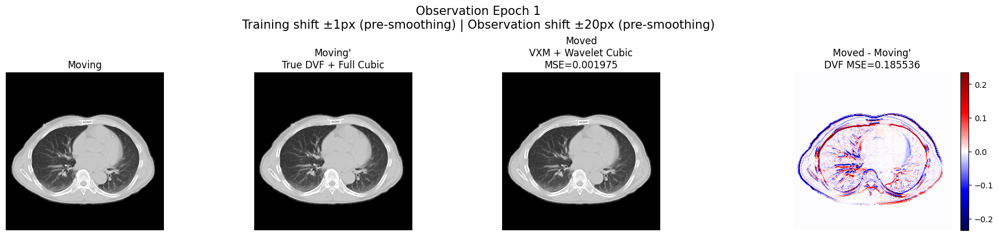


Epoch 00100/80000
Curriculum parameter : ±1 px (pre-smoothing)
Total Loss : 0.00063141
Image MSE  : 0.00000626
DVF MSE    : 0.00057670
True DVF max(full): 0.2271
True DVF max(low) : 0.1136
Pred DVF max      : 0.0075
GradScaler scale  : 65536.0

PRODUCTION SPEED RESULT
Measured iterations : 200
Total time          : 98.70 sec
Mean                : 0.4935 sec/iteration
Iterations/hour     : 7295.0
Estimated 80,000 iterations : 10.97 hours

Epoch 00200/80000
Curriculum parameter : ±1 px (pre-smoothing)
Total Loss : 0.00060063
Image MSE  : 0.00000596
DVF MSE    : 0.00050653
True DVF max(full): 0.2422
True DVF max(low) : 0.1211
Pred DVF max      : 0.0085
GradScaler scale  : 65536.0

Epoch 00300/80000
Curriculum parameter : ±1 px (pre-smoothing)
Total Loss : 0.00052431
Image MSE  : 0.00000519
DVF MSE    : 0.00053313
True DVF max(full): 0.2103
True DVF max(low) : 0.1051
Pred DVF max      : 0.0031
GradScaler scale  : 65536.0

Epoch 00400/80000
Curriculum parameter : ±1 px (pre-smoothing)
Tota

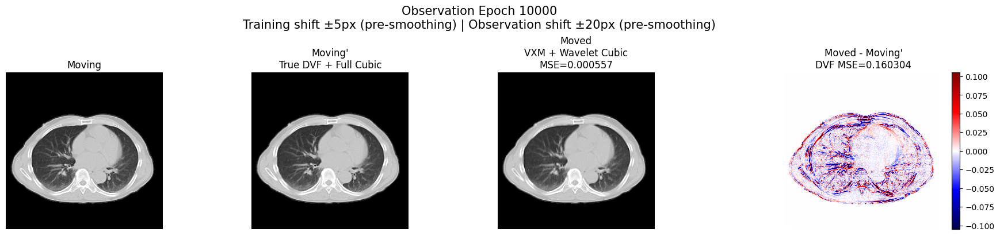


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_10000.pth

Epoch 10100/80000
Curriculum parameter : ±6 px (pre-smoothing)
Total Loss : 0.01054679
Image MSE  : 0.00010414
DVF MSE    : 0.01329521
True DVF max(full): 1.1818
True DVF max(low) : 0.5909
Pred DVF max      : 0.8804
GradScaler scale  : 1048576.0

Epoch 10200/80000
Curriculum parameter : ±6 px (pre-smoothing)
Total Loss : 0.01526208
Image MSE  : 0.00015158
DVF MSE    : 0.01037991
True DVF max(full): 1.1534
True DVF max(low) : 0.5763
Pred DVF max      : 1.0146
GradScaler scale  : 1048576.0

Epoch 10300/80000
Curriculum parameter : ±6 px (pre-smoothing)
Total Loss : 0.00887204
Image MSE  : 0.00008763
DVF MSE    : 0.01094722
True DVF max(full): 1.4042
True DVF max(low) : 0.7021
Pred DVF max      : 0.7944
GradScaler scale  : 1048576.0

Epoch 10400/80000
Curriculum parameter : ±6 px (pre-smoothing)
Total Loss : 0.01302492
Image MSE  : 0.00012885
DVF MSE    : 0.01399930
True DVF max(full): 1.1981
True DVF max(low)

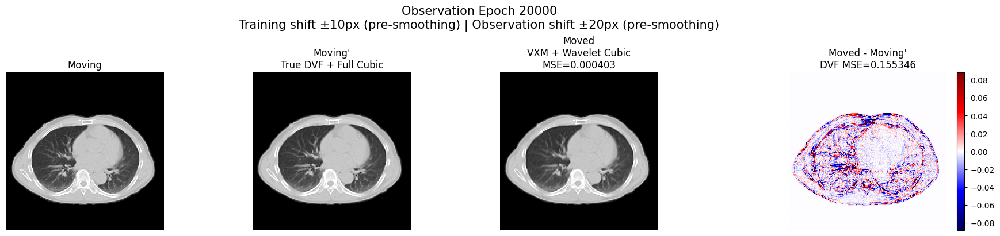


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_20000.pth

Epoch 20100/80000
Curriculum parameter : ±11 px (pre-smoothing)
Total Loss : 0.02351927
Image MSE  : 0.00023094
DVF MSE    : 0.04249754
True DVF max(full): 2.7273
True DVF max(low) : 1.3637
Pred DVF max      : 3.2812
GradScaler scale  : 1048576.0

Epoch 20200/80000
Curriculum parameter : ±11 px (pre-smoothing)
Total Loss : 0.02266125
Image MSE  : 0.00022246
DVF MSE    : 0.04147790
True DVF max(full): 1.9645
True DVF max(low) : 0.9801
Pred DVF max      : 2.6680
GradScaler scale  : 1048576.0

Epoch 20300/80000
Curriculum parameter : ±11 px (pre-smoothing)
Total Loss : 0.02697398
Image MSE  : 0.00026618
DVF MSE    : 0.03558938
True DVF max(full): 1.5201
True DVF max(low) : 0.7601
Pred DVF max      : 2.2734
GradScaler scale  : 1048576.0

Epoch 20400/80000
Curriculum parameter : ±11 px (pre-smoothing)
Total Loss : 0.02227242
Image MSE  : 0.00021837
DVF MSE    : 0.04353131
True DVF max(full): 1.9744
True DVF max(

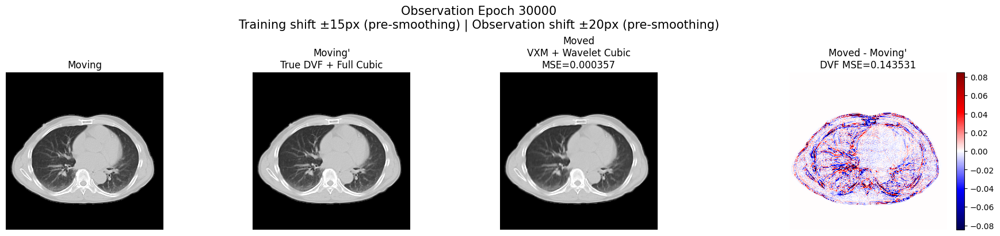


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_30000.pth

Epoch 30100/80000
Curriculum parameter : ±16 px (pre-smoothing)
Total Loss : 0.04355434
Image MSE  : 0.00042736
DVF MSE    : 0.08186179
True DVF max(full): 4.1910
True DVF max(low) : 2.0955
Pred DVF max      : 4.7773
GradScaler scale  : 1048576.0

Epoch 30200/80000
Curriculum parameter : ±16 px (pre-smoothing)
Total Loss : 0.04199900
Image MSE  : 0.00040993
DVF MSE    : 0.10057335
True DVF max(full): 3.4018
True DVF max(low) : 1.7009
Pred DVF max      : 5.1992
GradScaler scale  : 1048576.0

Epoch 30300/80000
Curriculum parameter : ±16 px (pre-smoothing)
Total Loss : 0.04082972
Image MSE  : 0.00040200
DVF MSE    : 0.06301412
True DVF max(full): 3.3469
True DVF max(low) : 1.6715
Pred DVF max      : 3.6074
GradScaler scale  : 1048576.0

Epoch 30400/80000
Curriculum parameter : ±16 px (pre-smoothing)
Total Loss : 0.05208788
Image MSE  : 0.00051342
DVF MSE    : 0.07454022
True DVF max(full): 2.9248
True DVF max(

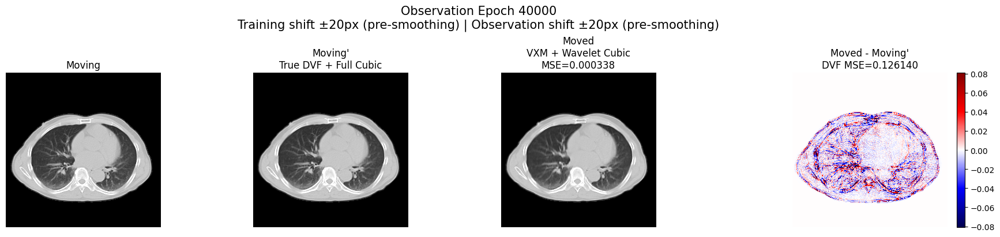


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_40000.pth

Epoch 40100/80000
Curriculum parameter : ±21 px (pre-smoothing)
Total Loss : 0.05181683
Image MSE  : 0.00050438
DVF MSE    : 0.13788418
True DVF max(full): 4.2612
True DVF max(low) : 2.1275
Pred DVF max      : 4.5859
GradScaler scale  : 1048576.0

Epoch 40200/80000
Curriculum parameter : ±21 px (pre-smoothing)
Total Loss : 0.05716321
Image MSE  : 0.00055504
DVF MSE    : 0.16590583
True DVF max(full): 3.8667
True DVF max(low) : 1.9333
Pred DVF max      : 4.8672
GradScaler scale  : 2097152.0

Epoch 40300/80000
Curriculum parameter : ±21 px (pre-smoothing)
Total Loss : 0.05656083
Image MSE  : 0.00055222
DVF MSE    : 0.13392079
True DVF max(full): 4.5514
True DVF max(low) : 2.2750
Pred DVF max      : 4.6211
GradScaler scale  : 1048576.0

Epoch 40400/80000
Curriculum parameter : ±21 px (pre-smoothing)
Total Loss : 0.05246614
Image MSE  : 0.00051198
DVF MSE    : 0.12684475
True DVF max(full): 5.5323
True DVF max(

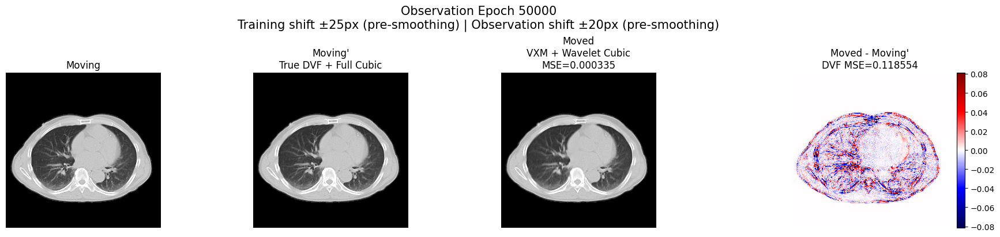


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_50000.pth

Epoch 50100/80000
Curriculum parameter : ±26 px (pre-smoothing)
Total Loss : 0.06130098
Image MSE  : 0.00059353
DVF MSE    : 0.19479744
True DVF max(full): 6.0180
True DVF max(low) : 3.0075
Pred DVF max      : 7.5859
GradScaler scale  : 524288.0

Epoch 50200/80000
Curriculum parameter : ±26 px (pre-smoothing)
Total Loss : 0.07308838
Image MSE  : 0.00071226
DVF MSE    : 0.18621115
True DVF max(full): 4.9725
True DVF max(low) : 2.4862
Pred DVF max      : 6.0469
GradScaler scale  : 524288.0

Epoch 50300/80000
Curriculum parameter : ±26 px (pre-smoothing)
Total Loss : 0.06469363
Image MSE  : 0.00062703
DVF MSE    : 0.19903290
True DVF max(full): 5.4915
True DVF max(low) : 2.7430
Pred DVF max      : 5.6719
GradScaler scale  : 524288.0

Epoch 50400/80000
Curriculum parameter : ±26 px (pre-smoothing)
Total Loss : 0.06345775
Image MSE  : 0.00061699
DVF MSE    : 0.17583776
True DVF max(full): 5.8692
True DVF max(low

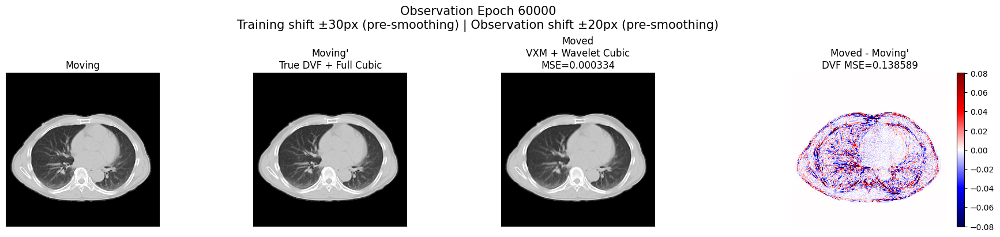


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_60000.pth

Epoch 60100/80000
Curriculum parameter : ±31 px (pre-smoothing)
Total Loss : 0.05445138
Image MSE  : 0.00052333
DVF MSE    : 0.21186948
True DVF max(full): 6.6663
True DVF max(low) : 3.3332
Pred DVF max      : 8.0312
GradScaler scale  : 524288.0

Epoch 60200/80000
Curriculum parameter : ±31 px (pre-smoothing)
Total Loss : 0.04864470
Image MSE  : 0.00045858
DVF MSE    : 0.27866185
True DVF max(full): 7.8494
True DVF max(low) : 3.9247
Pred DVF max      : 5.8711
GradScaler scale  : 524288.0

Epoch 60300/80000
Curriculum parameter : ±31 px (pre-smoothing)
Total Loss : 0.06293304
Image MSE  : 0.00060770
DVF MSE    : 0.21628526
True DVF max(full): 6.3428
True DVF max(low) : 3.1714
Pred DVF max      : 6.4453
GradScaler scale  : 524288.0

Epoch 60400/80000
Curriculum parameter : ±31 px (pre-smoothing)
Total Loss : 0.06397929
Image MSE  : 0.00061315
DVF MSE    : 0.26639450
True DVF max(full): 6.0503
True DVF max(low

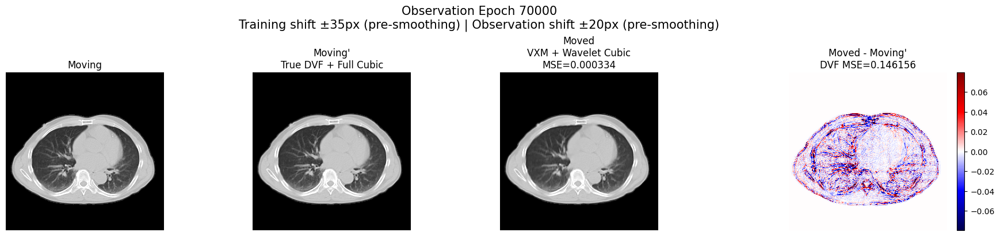


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_70000.pth

Epoch 70100/80000
Curriculum parameter : ±36 px (pre-smoothing)
Total Loss : 0.06550431
Image MSE  : 0.00062192
DVF MSE    : 0.33127439
True DVF max(full): 7.3921
True DVF max(low) : 3.6961
Pred DVF max      : 4.1484
GradScaler scale  : 131072.0

Epoch 70200/80000
Curriculum parameter : ±36 px (pre-smoothing)
Total Loss : 0.06242365
Image MSE  : 0.00059856
DVF MSE    : 0.25677469
True DVF max(full): 8.1538
True DVF max(low) : 4.0769
Pred DVF max      : 6.9570
GradScaler scale  : 131072.0

Epoch 70300/80000
Curriculum parameter : ±36 px (pre-smoothing)
Total Loss : 0.06485582
Image MSE  : 0.00061932
DVF MSE    : 0.29233229
True DVF max(full): 7.0111
True DVF max(low) : 3.5056
Pred DVF max      : 8.7812
GradScaler scale  : 131072.0

Epoch 70400/80000
Curriculum parameter : ±36 px (pre-smoothing)
Total Loss : 0.05205916
Image MSE  : 0.00049570
DVF MSE    : 0.24895886
True DVF max(full): 6.5394
True DVF max(low

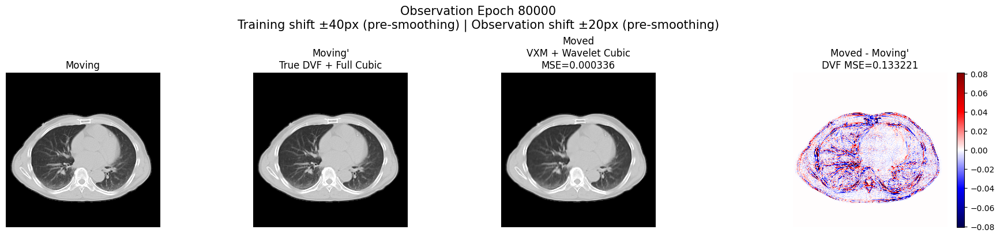


Checkpoint saved: curriculum_cubic_amp_checkpoints\curriculum_epoch_80000.pth

TRAINING COMPLETE
Final model: model_DVF_cubic_amp_curriculum_final.pth
Latest model: model_DVF_cubic_amp_curriculum_latest.pth


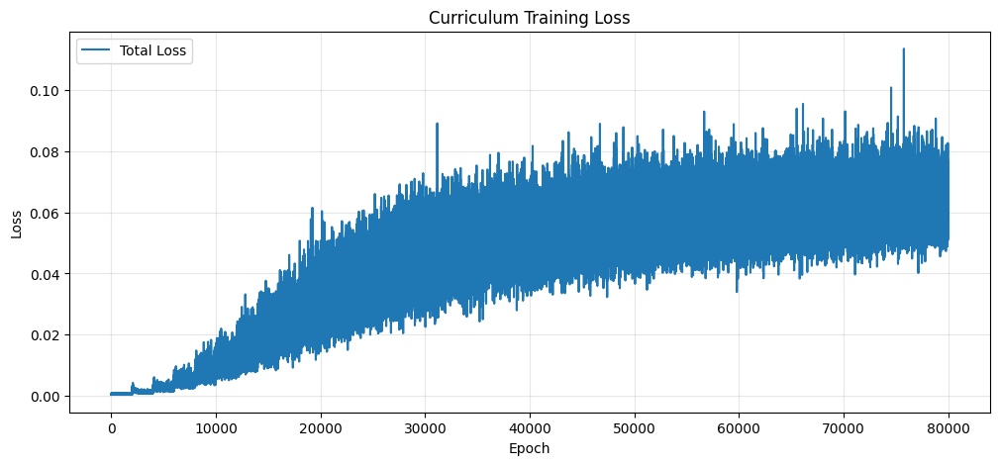

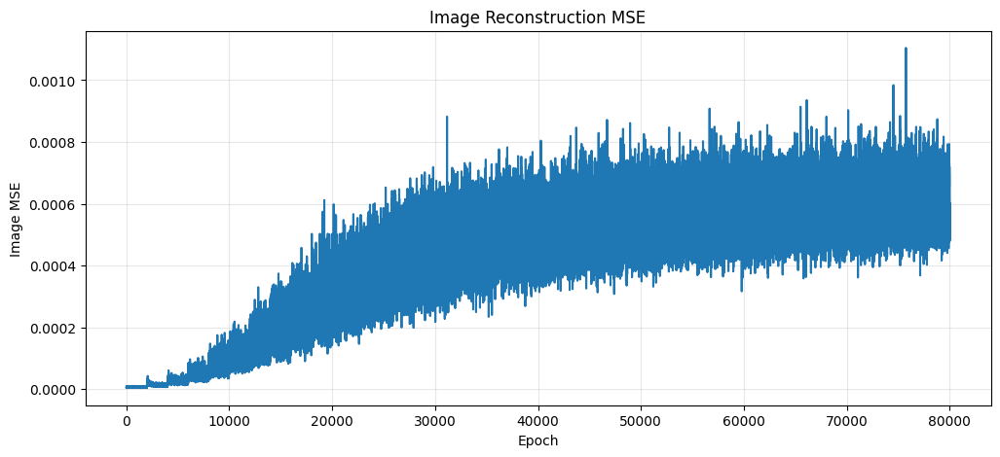

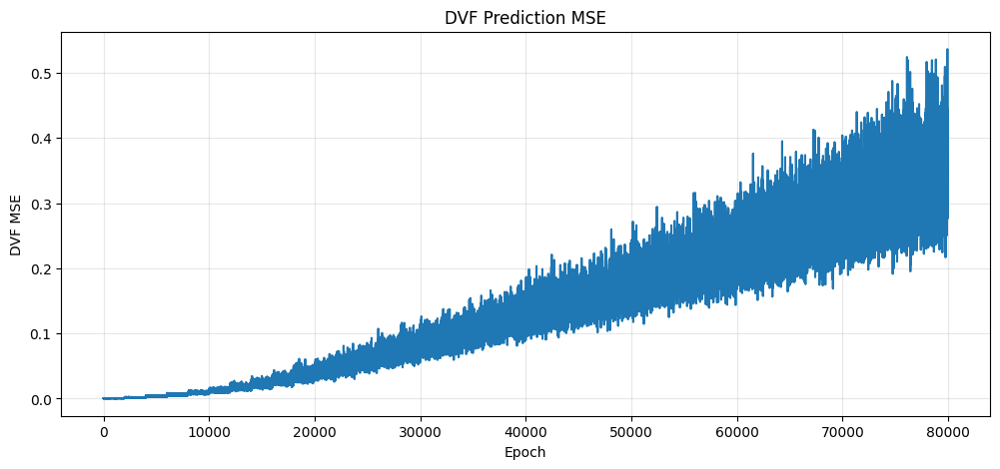

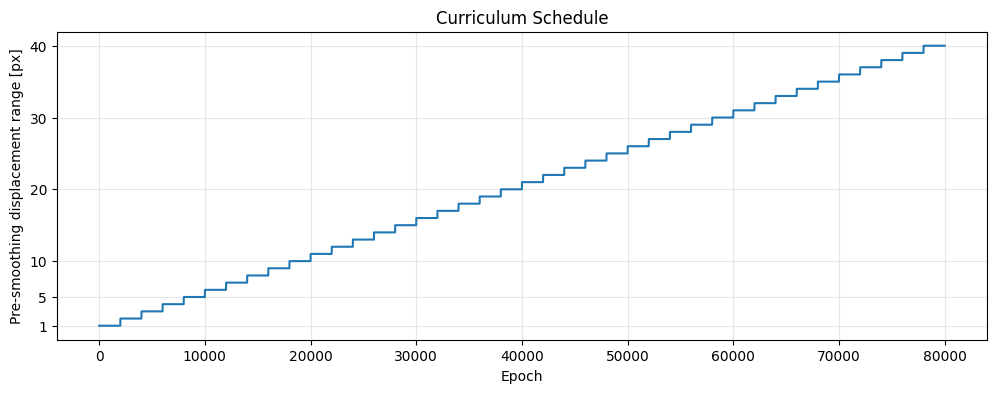

In [52]:
# ======================================================================
# FINAL PRODUCTION CURRICULUM TRAINING
#
# Fixed configuration:
#
#   Teacher interpolation
#       Chunked Vectorized Catmull-Rom Cubic
#       chunk_depth = 1
#       64 neighbors
#       a = -0.5
#       OOB = 0
#
#   Training forward
#       Full AMP
#
#       Haar Analysis
#           ↓
#       Current VoxelMorph
#           ↓
#       Wavelet-domain Catmull-Rom Cubic
#           ↓
#       Haar Synthesis
#
#   Loss
#       FP32
#
#       100 × Image MSE
#       +
#       0.01 × DVF MSE
#
#   Backward
#       AMP GradScaler
#
#   Artificial DVF
#       GPU Gaussian smoothing
#       SciPy-compatible reflect
#
#
# IMPORTANT:
#
# Curriculum ±1 ... ±40 px means:
#
#   Gaussian smoothing 前の
#   coarse DVF random range
#
# 実際の最終DVF最大変位が
# ±1 ... ±40 voxelという意味ではない。
#
#
# Verified production-like speed on RTX3090:
#
#   ~0.503 sec / iteration
#   ~11.2 hours / 80,000 iterations
#
# Main GPU-time breakdown:
#
#   Full Cubic Teacher : ~0.288 sec
#   Backward           : ~0.092 sec
#   Wavelet Cubic      : ~0.042 sec
#   VoxelMorph         : ~0.028 sec
#
# ======================================================================


# ======================================================================
# 0. Imports
# ======================================================================

from pathlib import Path

import gc
import os
import random
import time

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt

from tqdm.notebook import tqdm


# ======================================================================
# 1. Reproducibility
# ======================================================================

SEED = 20260904


def set_seed(seed):

    random.seed(seed)

    np.random.seed(seed)

    torch.manual_seed(seed)

    if torch.cuda.is_available():

        torch.cuda.manual_seed_all(seed)


# ======================================================================
# 2. Device
# ======================================================================

device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else
    "cpu"
)


AMP_ENABLED = (
    device.type == "cuda"
)


print("=" * 80)
print("DEVICE")
print("=" * 80)

print(
    "Device:",
    device
)

if torch.cuda.is_available():

    print(
        "GPU:",
        torch.cuda.get_device_name(0)
    )

print(
    "AMP:",
    AMP_ENABLED
)


# ======================================================================
# 3. Training settings
# ======================================================================

EPOCHS = 80000

LEARNING_RATE = 1e-4

BATCH_SIZE = 2


# ----------------------------------------------------------------------
# Resume
# ----------------------------------------------------------------------

RESUME = False


# ----------------------------------------------------------------------
# Curriculum
# ----------------------------------------------------------------------

INITIAL_SHIFT = 1

SHIFT_STEP = 1

STEP_EPOCHS = 2000

MAX_SHIFT = 40


# ----------------------------------------------------------------------
# Artificial DVF
# ----------------------------------------------------------------------

COARSE_SIZE = (
    8,
    16,
    16
)

FULL_SIZE = (
    128,
    256,
    256
)

LOW_SIZE = (
    64,
    128,
    128
)


GAUSSIAN_SIGMA = 2.0

GAUSSIAN_TRUNCATE = 4.0


# ----------------------------------------------------------------------
# Loss
# ----------------------------------------------------------------------

IMAGE_WEIGHT = 100.0

DVF_WEIGHT = 0.01


# ----------------------------------------------------------------------
# Teacher Cubic
# ----------------------------------------------------------------------

TEACHER_CUBIC_IMPLEMENTATION = (
    "chunked_vectorized_64_neighbors"
)

TEACHER_CUBIC_CHUNK_DEPTH = 1

TEACHER_TARGET_IMAGE_WARP = (
    "cubic_catmull_rom_chunked_vectorized"
)

CUBIC_A = -0.5


# ----------------------------------------------------------------------
# Observation
# ----------------------------------------------------------------------

OBS_PATIENT_ID = 0

OBS_SHIFT = 20

OBSERVE_EVERY = 1000

VISUALIZE_EVERY = 10000


# ----------------------------------------------------------------------
# Logging
# ----------------------------------------------------------------------

CONSOLE_EVERY = 100

TQDM_UPDATE_EVERY = 10


# ----------------------------------------------------------------------
# Checkpoint
# ----------------------------------------------------------------------

CHECKPOINT_EVERY = 2000


CHECKPOINT_DIR = Path(
    "curriculum_cubic_amp_checkpoints"
)

CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


LATEST_PATH = Path(
    "model_DVF_cubic_amp_curriculum_latest.pth"
)

FINAL_PATH = Path(
    "model_DVF_cubic_amp_curriculum_final.pth"
)


# ----------------------------------------------------------------------
# Speed benchmark
#
# IMPORTANT:
# epochごとにcuda synchronizeしない。
#
# 最初と最後だけ同期する。
# ----------------------------------------------------------------------

SPEED_BENCHMARK_EPOCHS = 200


# ======================================================================
# 4. Required objects
# ======================================================================

required_names = [

    "x_train",

    "vxm",

    "analysis_fast",

    "synthesis_filter_3d_fast",

    "synthesis_filters_fast",

    "cubic_transformer",
]


for name in required_names:

    if name not in globals():

        raise NameError(
            f"{name} が定義されていません。"
            "前のセルを実行してください。"
        )


# ======================================================================
# 5. x_train -> contiguous float32
# ======================================================================

x_train = np.ascontiguousarray(
    x_train,
    dtype=np.float32
)


if len(x_train) < BATCH_SIZE:

    raise ValueError(
        f"BATCH_SIZE={BATCH_SIZE} に対して "
        f"x_train={len(x_train)} 症例しかありません。"
    )


print()

print("=" * 80)
print("DATA")
print("=" * 80)

print(
    "x_train shape:",
    x_train.shape
)

print(
    "x_train dtype:",
    x_train.dtype
)


# ======================================================================
# 6. Chunked Vectorized Cubic
# ======================================================================

def cubic_weight_chunked(
    x,
    a=-0.5
):

    ax = torch.abs(x)

    ax2 = ax * ax

    ax3 = ax2 * ax


    w1 = (
        (a + 2.0) * ax3
        -
        (a + 3.0) * ax2
        +
        1.0
    )


    w2 = (
        a * ax3
        -
        5.0 * a * ax2
        +
        8.0 * a * ax
        -
        4.0 * a
    )


    return torch.where(
        ax <= 1.0,
        w1,
        torch.where(
            ax < 2.0,
            w2,
            torch.zeros_like(ax)
        )
    )


class ChunkedVectorizedCubicSpatialTransformer3D(
    nn.Module
):

    def __init__(
        self,
        size,
        a=-0.5,
        chunk_depth=1
    ):

        super().__init__()


        self.size = tuple(size)

        self.a = float(a)

        self.chunk_depth = int(
            chunk_depth
        )


        if self.chunk_depth < 1:

            raise ValueError(
                "chunk_depth must be >= 1"
            )


        D, H, W = self.size


        self.register_buffer(
            "z_grid",
            torch.arange(
                D,
                dtype=torch.float32
            ),
            persistent=False
        )


        self.register_buffer(
            "y_grid",
            torch.arange(
                H,
                dtype=torch.float32
            ),
            persistent=False
        )


        self.register_buffer(
            "x_grid",
            torch.arange(
                W,
                dtype=torch.float32
            ),
            persistent=False
        )


        self.register_buffer(
            "offsets",
            torch.tensor(
                [
                    -1.0,
                     0.0,
                     1.0,
                     2.0
                ],
                dtype=torch.float32
            ),
            persistent=False
        )


    def forward(
        self,
        source,
        flow
    ):

        B, C, D, H, W = (
            source.shape
        )


        if (
            D,
            H,
            W
        ) != self.size:

            raise ValueError(
                f"source size "
                f"{source.shape[2:]} "
                f"!= transformer size "
                f"{self.size}"
            )


        expected_flow_shape = (
            B,
            3,
            D,
            H,
            W
        )


        if tuple(flow.shape) != expected_flow_shape:

            raise ValueError(
                f"flow shape error: "
                f"{flow.shape}"
            )


        if source.device != flow.device:

            raise ValueError(
                "source and flow must "
                "be on same device"
            )


        dev = flow.device

        dtype = flow.dtype


        output = torch.empty(
            (
                B,
                C,
                D,
                H,
                W
            ),
            dtype=source.dtype,
            device=source.device
        )


        source_flat = source.reshape(
            B,
            C,
            -1
        )


        offsets = self.offsets.to(
            device=dev,
            dtype=dtype
        )


        # --------------------------------------------------------------
        # These are already registered buffers on the correct GPU.
        # dtype conversion is normally a no-op in FP32 teacher.
        # --------------------------------------------------------------

        z_grid = self.z_grid.to(
            device=dev,
            dtype=dtype
        )

        y_grid = self.y_grid.to(
            device=dev,
            dtype=dtype
        )

        x_grid = self.x_grid.to(
            device=dev,
            dtype=dtype
        )


        offset_view = offsets.view(
            1,
            4,
            1,
            1,
            1
        )


        for z_start in range(
            0,
            D,
            self.chunk_depth
        ):

            z_end = min(
                z_start
                +
                self.chunk_depth,
                D
            )


            chunk_d = (
                z_end
                -
                z_start
            )


            base_z = (
                z_grid[
                    z_start:z_end
                ]
                .view(
                    1,
                    chunk_d,
                    1,
                    1
                )
            )


            base_y = (
                y_grid
                .view(
                    1,
                    1,
                    H,
                    1
                )
            )


            base_x = (
                x_grid
                .view(
                    1,
                    1,
                    1,
                    W
                )
            )


            z = (
                base_z
                +
                flow[
                    :,
                    0,
                    z_start:z_end
                ]
            )


            y = (
                base_y
                +
                flow[
                    :,
                    1,
                    z_start:z_end
                ]
            )


            x = (
                base_x
                +
                flow[
                    :,
                    2,
                    z_start:z_end
                ]
            )


            z0 = torch.floor(z)

            y0 = torch.floor(y)

            x0 = torch.floor(x)


            zi_float = (
                z0.unsqueeze(1)
                +
                offset_view
            )


            yi_float = (
                y0.unsqueeze(1)
                +
                offset_view
            )


            xi_float = (
                x0.unsqueeze(1)
                +
                offset_view
            )


            wz = cubic_weight_chunked(
                z.unsqueeze(1)
                -
                zi_float,
                self.a
            )


            wy = cubic_weight_chunked(
                y.unsqueeze(1)
                -
                yi_float,
                self.a
            )


            wx = cubic_weight_chunked(
                x.unsqueeze(1)
                -
                xi_float,
                self.a
            )


            zi = zi_float.long()

            yi = yi_float.long()

            xi = xi_float.long()


            valid_z = (
                (zi >= 0)
                &
                (zi < D)
            )


            valid_y = (
                (yi >= 0)
                &
                (yi < H)
            )


            valid_x = (
                (xi >= 0)
                &
                (xi < W)
            )


            zi_safe = zi.clamp(
                0,
                D - 1
            )


            yi_safe = yi.clamp(
                0,
                H - 1
            )


            xi_safe = xi.clamp(
                0,
                W - 1
            )


            linear_index = (
                zi_safe[
                    :,
                    :,
                    None,
                    None
                ]
                *
                (H * W)
                +
                yi_safe[
                    :,
                    None,
                    :,
                    None
                ]
                *
                W
                +
                xi_safe[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (
                wz[
                    :,
                    :,
                    None,
                    None
                ]
                *
                wy[
                    :,
                    None,
                    :,
                    None
                ]
                *
                wx[
                    :,
                    None,
                    None,
                    :
                ]
            )


            valid = (
                valid_z[
                    :,
                    :,
                    None,
                    None
                ]
                &
                valid_y[
                    :,
                    None,
                    :,
                    None
                ]
                &
                valid_x[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (
                weight
                *
                valid.to(
                    weight.dtype
                )
            )


            linear_index = (
                linear_index
                .reshape(
                    B,
                    64,
                    chunk_d,
                    H,
                    W
                )
            )


            weight = (
                weight
                .reshape(
                    B,
                    64,
                    chunk_d,
                    H,
                    W
                )
            )


            gather_index = (
                linear_index
                .reshape(
                    B,
                    1,
                    -1
                )
                .expand(
                    -1,
                    C,
                    -1
                )
            )


            sampled = torch.gather(
                source_flat,
                dim=2,
                index=gather_index
            )


            sampled = sampled.reshape(
                B,
                C,
                64,
                chunk_d,
                H,
                W
            )


            chunk_output = (
                sampled
                *
                weight.unsqueeze(1)
            ).sum(
                dim=2
            )


            output[
                :,
                :,
                z_start:z_end
            ] = chunk_output


        return output


# ======================================================================
# 7. FINAL Teacher Transformer
# ======================================================================

cubic_transformer_full_fast = (
    ChunkedVectorizedCubicSpatialTransformer3D(
        size=FULL_SIZE,
        a=CUBIC_A,
        chunk_depth=TEACHER_CUBIC_CHUNK_DEPTH
    )
    .to(device)
)


print()

print("=" * 80)
print("FINAL FULL-RESOLUTION TEACHER CUBIC")
print("=" * 80)

print(
    "Implementation :",
    TEACHER_CUBIC_IMPLEMENTATION
)

print(
    "Interpolation : Catmull-Rom / Keys Cubic"
)

print(
    "Cubic a       :",
    CUBIC_A
)

print(
    "Neighbors     : 64"
)

print(
    "Chunk depth   :",
    TEACHER_CUBIC_CHUNK_DEPTH
)

print(
    "Target warp   :",
    TEACHER_TARGET_IMAGE_WARP
)

print(
    "Boundary      : Out-of-bounds = 0"
)

print("=" * 80)


# ======================================================================
# 8. GPU Gaussian
# ======================================================================

def create_gaussian_kernel_1d(
    sigma,
    device,
    dtype=torch.float32,
    truncate=4.0
):

    radius = int(
        truncate * sigma
        +
        0.5
    )


    x = torch.arange(
        -radius,
        radius + 1,
        device=device,
        dtype=dtype
    )


    kernel = torch.exp(
        -(x ** 2)
        /
        (2.0 * sigma ** 2)
    )


    kernel = (
        kernel
        /
        kernel.sum()
    )


    return kernel


GAUSSIAN_KERNEL_1D = (
    create_gaussian_kernel_1d(
        sigma=GAUSSIAN_SIGMA,
        device=device,
        dtype=torch.float32,
        truncate=GAUSSIAN_TRUNCATE
    )
)


GAUSSIAN_RADIUS = (
    GAUSSIAN_KERNEL_1D.numel()
    //
    2
)


GAUSSIAN_CHANNELS = 3


GAUSSIAN_KZ = (
    GAUSSIAN_KERNEL_1D
    .view(
        1,
        1,
        -1,
        1,
        1
    )
    .repeat(
        GAUSSIAN_CHANNELS,
        1,
        1,
        1,
        1
    )
)


GAUSSIAN_KY = (
    GAUSSIAN_KERNEL_1D
    .view(
        1,
        1,
        1,
        -1,
        1
    )
    .repeat(
        GAUSSIAN_CHANNELS,
        1,
        1,
        1,
        1
    )
)


GAUSSIAN_KX = (
    GAUSSIAN_KERNEL_1D
    .view(
        1,
        1,
        1,
        1,
        -1
    )
    .repeat(
        GAUSSIAN_CHANNELS,
        1,
        1,
        1,
        1
    )
)


# ======================================================================
# 9. SciPy-compatible reflect
# ======================================================================

def scipy_reflect_indices(
    length,
    pad,
    device
):

    positions = torch.arange(
        -pad,
        length + pad,
        device=device,
        dtype=torch.long
    )


    if length == 1:

        return torch.zeros_like(
            positions
        )


    period = (
        2
        *
        length
    )


    idx = torch.remainder(
        positions,
        period
    )


    idx = torch.where(
        idx < length,
        idx,
        period - 1 - idx
    )


    return idx


def scipy_reflect_pad_3d_axis(
    tensor,
    axis,
    pad
):

    if pad == 0:

        return tensor


    idx = scipy_reflect_indices(
        length=tensor.shape[axis],
        pad=pad,
        device=tensor.device
    )


    return torch.index_select(
        tensor,
        dim=axis,
        index=idx
    )


def gaussian_smooth_3d_training(
    tensor
):

    if GAUSSIAN_SIGMA <= 0:

        return tensor


    r = GAUSSIAN_RADIUS


    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=2,
        pad=r
    )


    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KZ,
        groups=3
    )


    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=3,
        pad=r
    )


    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KY,
        groups=3
    )


    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=4,
        pad=r
    )


    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KX,
        groups=3
    )


    return tensor


# ======================================================================
# 10. Curriculum
# ======================================================================

def get_curriculum_shift(
    epoch_idx
):

    level = (
        epoch_idx
        //
        STEP_EPOCHS
    )


    shift = (
        INITIAL_SHIFT
        +
        level
        *
        SHIFT_STEP
    )


    return min(
        shift,
        MAX_SHIFT
    )


# ======================================================================
# 11. Artificial DVF
# ======================================================================

def generate_artificial_dvf(
    batch_size,
    shift
):

    displacement_coarse = (
        (
            torch.rand(
                (
                    batch_size,
                    3,
                    *COARSE_SIZE
                ),
                device=device,
                dtype=torch.float32
            )
            *
            2.0
        )
        -
        1.0
    ) * float(
        shift
    )


    displacement_coarse = (
        gaussian_smooth_3d_training(
            displacement_coarse
        )
    )


    displacement_full = F.interpolate(
        displacement_coarse,
        size=FULL_SIZE,
        mode="trilinear",
        align_corners=False
    )


    displacement_low = (
        F.interpolate(
            displacement_full,
            size=LOW_SIZE,
            mode="trilinear",
            align_corners=False
        )
        /
        2.0
    )


    return (
        displacement_full,
        displacement_low
    )


# ======================================================================
# 12. Model
# ======================================================================

# IMPORTANT:
# profilerで更新された重みを使わない。
#
# ここでseedから新しく作り直す。
# ======================================================================

set_seed(
    SEED
)


model3D = (
    vxm.networks.VxmDense_128_256_256(
        FULL_SIZE
    )
    .to(device)
)


optimizer = optim.Adam(
    model3D.parameters(),
    lr=LEARNING_RATE
)


try:

    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=AMP_ENABLED
    )

except Exception:

    scaler = torch.cuda.amp.GradScaler(
        enabled=AMP_ENABLED
    )


# ======================================================================
# 13. Resume
# ======================================================================

START_EPOCH = 0

loss_history = []

image_loss_history = []

dvf_loss_history = []

shift_history = []


if RESUME:

    if not LATEST_PATH.exists():

        raise FileNotFoundError(
            f"Resume checkpoint not found: "
            f"{LATEST_PATH.resolve()}"
        )


    print()

    print("=" * 80)
    print("RESUME TRAINING")
    print("=" * 80)


    try:

        checkpoint = torch.load(
            LATEST_PATH,
            map_location=device,
            weights_only=False
        )

    except TypeError:

        checkpoint = torch.load(
            LATEST_PATH,
            map_location=device
        )


    model3D.load_state_dict(
        checkpoint[
            "model_state_dict"
        ]
    )


    optimizer.load_state_dict(
        checkpoint[
            "optimizer_state_dict"
        ]
    )


    if checkpoint.get(
        "scaler_state_dict"
    ) is not None:

        scaler.load_state_dict(
            checkpoint[
                "scaler_state_dict"
            ]
        )


    START_EPOCH = int(
        checkpoint["epoch"]
    )


    loss_history = checkpoint.get(
        "loss_history",
        []
    )


    image_loss_history = checkpoint.get(
        "image_loss_history",
        []
    )


    dvf_loss_history = checkpoint.get(
        "dvf_loss_history",
        []
    )


    shift_history = checkpoint.get(
        "shift_history",
        []
    )


    if "python_random_state" in checkpoint:

        random.setstate(
            checkpoint[
                "python_random_state"
            ]
        )


    if "numpy_random_state" in checkpoint:

        np.random.set_state(
            checkpoint[
                "numpy_random_state"
            ]
        )


    if "torch_random_state" in checkpoint:

        torch.set_rng_state(
            checkpoint[
                "torch_random_state"
            ]
        )


    if (
        torch.cuda.is_available()
        and
        checkpoint.get(
            "cuda_random_state"
        ) is not None
    ):

        torch.cuda.set_rng_state_all(
            checkpoint[
                "cuda_random_state"
            ]
        )


    print(
        "Checkpoint:",
        LATEST_PATH
    )

    print(
        "Resume epoch:",
        START_EPOCH
    )


else:

    print()

    print("=" * 80)
    print("START FROM SCRATCH")
    print("=" * 80)


    START_EPOCH = 0

    # --------------------------------------------------------------
    # Model initialization already used SEED.
    #
    # 学習側乱数系列も固定位置から開始。
    # --------------------------------------------------------------

    set_seed(
        SEED
    )


if START_EPOCH >= EPOCHS:

    raise ValueError(
        f"Checkpoint epoch={START_EPOCH} "
        f"is already >= EPOCHS={EPOCHS}."
    )


# ======================================================================
# 14. Observation
# ======================================================================

obs_moving = (
    torch.from_numpy(
        x_train[
            OBS_PATIENT_ID:
            OBS_PATIENT_ID + 1
        ]
    )
    .unsqueeze(1)
    .to(
        device=device,
        dtype=torch.float32,
        non_blocking=True
    )
)


# ----------------------------------------------------------------------
# Preserve training RNG
# ----------------------------------------------------------------------

python_rng_before_obs = (
    random.getstate()
)

numpy_rng_before_obs = (
    np.random.get_state()
)

torch_rng_before_obs = (
    torch.get_rng_state()
)

cuda_rng_before_obs = (
    torch.cuda.get_rng_state_all()
    if torch.cuda.is_available()
    else
    None
)


# ----------------------------------------------------------------------
# Fixed observation DVF
# ----------------------------------------------------------------------

torch.manual_seed(
    12345
)

if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        12345
    )


with torch.no_grad():

    (
        obs_flow_full,
        obs_flow_low
    ) = generate_artificial_dvf(
        batch_size=1,
        shift=OBS_SHIFT
    )


# ----------------------------------------------------------------------
# Restore training RNG
# ----------------------------------------------------------------------

random.setstate(
    python_rng_before_obs
)

np.random.set_state(
    numpy_rng_before_obs
)

torch.set_rng_state(
    torch_rng_before_obs
)

if (
    torch.cuda.is_available()
    and
    cuda_rng_before_obs is not None
):

    torch.cuda.set_rng_state_all(
        cuda_rng_before_obs
    )


# ----------------------------------------------------------------------
# Fixed teacher target
# ----------------------------------------------------------------------

with torch.no_grad():

    obs_target = (
        cubic_transformer_full_fast(
            obs_moving,
            obs_flow_full
        )
    )


# ----------------------------------------------------------------------
# Fixed Haar representations
# ----------------------------------------------------------------------

with torch.no_grad():

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        obs_moving_w = analysis_fast(
            obs_moving
        )


        obs_target_w = analysis_fast(
            obs_target
        )


# ======================================================================
# 15. Checkpoint helper
# ======================================================================

def build_checkpoint(
    epoch
):

    return {

        "epoch":
            epoch,


        "model_state_dict":
            model3D.state_dict(),


        "optimizer_state_dict":
            optimizer.state_dict(),


        "scaler_state_dict":
            scaler.state_dict(),


        "loss_history":
            loss_history,


        "image_loss_history":
            image_loss_history,


        "dvf_loss_history":
            dvf_loss_history,


        "shift_history":
            shift_history,


        "learning_rate":
            LEARNING_RATE,


        "batch_size":
            BATCH_SIZE,


        "initial_shift":
            INITIAL_SHIFT,


        "shift_step":
            SHIFT_STEP,


        "step_epochs":
            STEP_EPOCHS,


        "max_shift":
            MAX_SHIFT,


        "curriculum_shift_definition":
            "pre_smoothing_coarse_random_range",


        "gaussian_sigma":
            GAUSSIAN_SIGMA,


        "gaussian_truncate":
            GAUSSIAN_TRUNCATE,


        "gaussian_mode":
            "reflect",


        "gaussian_implementation":
            "gpu_separable_conv3d_scipy_reflect_compatible",


        "image_weight":
            IMAGE_WEIGHT,


        "dvf_weight":
            DVF_WEIGHT,


        # --------------------------------------------------------------
        # Interpolation metadata
        # --------------------------------------------------------------

        "true_dvf_resize":
            "trilinear",


        "target_image_warp":
            TEACHER_TARGET_IMAGE_WARP,


        "teacher_cubic_implementation":
            TEACHER_CUBIC_IMPLEMENTATION,


        "teacher_cubic_chunk_depth":
            TEACHER_CUBIC_CHUNK_DEPTH,


        "wavelet_warp":
            "cubic_catmull_rom",


        "cubic_a":
            CUBIC_A,


        "cubic_neighbors":
            64,


        "cubic_boundary":
            "out_of_bounds_zero",


        # --------------------------------------------------------------
        # AMP
        # --------------------------------------------------------------

        "amp":
            AMP_ENABLED,


        "amp_dtype":
            "float16",


        "loss_dtype":
            "float32",


        # --------------------------------------------------------------
        # Model
        # --------------------------------------------------------------

        "model_class":
            model3D.__class__.__name__,


        # --------------------------------------------------------------
        # Seed
        # --------------------------------------------------------------

        "seed":
            SEED,


        # --------------------------------------------------------------
        # RNG
        # --------------------------------------------------------------

        "python_random_state":
            random.getstate(),


        "numpy_random_state":
            np.random.get_state(),


        "torch_random_state":
            torch.get_rng_state(),


        "cuda_random_state":
            (
                torch.cuda.get_rng_state_all()
                if torch.cuda.is_available()
                else
                None
            ),
    }


# ======================================================================
# 16. Settings
# ======================================================================

print()

print("=" * 80)
print("FINAL PRODUCTION SETTINGS")
print("=" * 80)

print(
    "Epochs                  :",
    EPOCHS
)

print(
    "Learning rate           :",
    LEARNING_RATE
)

print(
    "Batch size              :",
    BATCH_SIZE
)

print(
    "Curriculum              : "
    "±1 -> ±40 pre-smoothing"
)

print(
    "Gaussian sigma          :",
    GAUSSIAN_SIGMA
)

print(
    "Teacher                 :",
    TEACHER_CUBIC_IMPLEMENTATION
)

print(
    "Teacher chunk depth     :",
    TEACHER_CUBIC_CHUNK_DEPTH
)

print(
    "Target image warp       :",
    TEACHER_TARGET_IMAGE_WARP
)

print(
    "Wavelet warp            : "
    "Catmull-Rom Cubic"
)

print(
    "VoxelMorph              :",
    model3D.__class__.__name__
)

print(
    "AMP                     :",
    AMP_ENABLED
)

print(
    "Loss                    : FP32"
)

print(
    "Image weight            :",
    IMAGE_WEIGHT
)

print(
    "DVF weight              :",
    DVF_WEIGHT
)

print("=" * 80)


# ======================================================================
# 17. Speed benchmark setup
#
# IMPORTANT:
#
# cuda synchronizeは
# benchmarkの最初と最後だけ。
#
# 各iterationで同期しない。
# ======================================================================

benchmark_start_epoch = (
    START_EPOCH + 1
)

benchmark_end_epoch = min(
    START_EPOCH
    +
    SPEED_BENCHMARK_EPOCHS,
    EPOCHS
)


benchmark_wall_start = None

benchmark_wall_end = None


# ======================================================================
# 18. Training
# ======================================================================

print()

print("=" * 80)
print("START PRODUCTION TRAINING")
print("=" * 80)


model3D.train()


progress_bar = tqdm(
    range(
        START_EPOCH,
        EPOCHS
    ),
    desc="Curriculum training",
    mininterval=1.0
)


for epoch_idx in progress_bar:


    epoch = (
        epoch_idx
        +
        1
    )


    # ==================================================================
    # Speed benchmark start
    # ==================================================================

    if (
        epoch
        ==
        benchmark_start_epoch
    ):

        if torch.cuda.is_available():

            torch.cuda.synchronize()


        benchmark_wall_start = (
            time.perf_counter()
        )


    # ==================================================================
    # Curriculum
    # ==================================================================

    current_shift = (
        get_curriculum_shift(
            epoch_idx
        )
    )


    # ==================================================================
    # Random patients
    # ==================================================================

    indices = np.random.choice(
        len(x_train),
        size=BATCH_SIZE,
        replace=False
    )


    moving_images = (
        torch.from_numpy(
            x_train[indices]
        )
        .unsqueeze(1)
        .to(
            device=device,
            dtype=torch.float32,
            non_blocking=True
        )
    )


    # ==================================================================
    # Artificial DVF
    # ==================================================================

    with torch.no_grad():

        (
            displacement_field_full,
            displacement_field_low

        ) = generate_artificial_dvf(
            batch_size=BATCH_SIZE,
            shift=current_shift
        )


    # ==================================================================
    # FP32 Teacher
    #
    # Chunked Vectorized Cubic
    # chunk_depth = 1
    # ==================================================================

    with torch.no_grad():

        moving_prime = (
            cubic_transformer_full_fast(
                moving_images,
                displacement_field_full
            )
        )


    # ==================================================================
    # Optimizer reset
    # ==================================================================

    optimizer.zero_grad(
        set_to_none=True
    )


    # ==================================================================
    # Full AMP forward
    # ==================================================================

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        # --------------------------------------------------------------
        # Haar Analysis
        # --------------------------------------------------------------

        moving_w = analysis_fast(
            moving_images
        )


        moving_prime_w = analysis_fast(
            moving_prime
        )


        # --------------------------------------------------------------
        # Current VoxelMorph
        # --------------------------------------------------------------

        Vec = model3D(
            moving_w,
            moving_prime_w
        )


        # --------------------------------------------------------------
        # Validation
        # --------------------------------------------------------------

        if Vec.ndim != 5:

            raise RuntimeError(
                f"DVF dimension error: "
                f"{Vec.shape}"
            )


        if Vec.shape[1] != 3:

            raise RuntimeError(
                f"DVF channel error: "
                f"{Vec.shape}"
            )


        if (
            Vec.shape
            !=
            displacement_field_low.shape
        ):

            raise RuntimeError(
                "\nDVF shape mismatch\n"
                f"True : "
                f"{tuple(displacement_field_low.shape)}\n"
                f"Pred : "
                f"{tuple(Vec.shape)}"
            )


        # --------------------------------------------------------------
        # Wavelet Cubic
        # --------------------------------------------------------------

        moving_warped = (
            cubic_transformer(
                moving_w,
                Vec
            )
        )


        # --------------------------------------------------------------
        # Haar Synthesis
        # --------------------------------------------------------------

        transformed_image = (
            synthesis_filter_3d_fast(
                moving_warped,
                synthesis_filters_fast
            )
        )


    # ==================================================================
    # FP32 Loss
    # ==================================================================

    raw_loss_image = F.mse_loss(
        transformed_image.float(),
        moving_prime.float()
    )


    raw_loss_vec = F.mse_loss(
        Vec.float(),
        displacement_field_low.float()
    )


    loss_image = (
        IMAGE_WEIGHT
        *
        raw_loss_image
    )


    loss_vec = (
        DVF_WEIGHT
        *
        raw_loss_vec
    )


    total_loss = (
        loss_image
        +
        loss_vec
    )


    # ==================================================================
    # Backward
    # ==================================================================

    scaler.scale(
        total_loss
    ).backward()


    scaler.step(
        optimizer
    )


    scaler.update()


    # ==================================================================
    # Speed benchmark end
    #
    # only one synchronization
    # ==================================================================

    if (
        epoch
        ==
        benchmark_end_epoch
    ):

        if torch.cuda.is_available():

            torch.cuda.synchronize()


        benchmark_wall_end = (
            time.perf_counter()
        )


        benchmark_epochs = (
            benchmark_end_epoch
            -
            benchmark_start_epoch
            +
            1
        )


        benchmark_total_sec = (
            benchmark_wall_end
            -
            benchmark_wall_start
        )


        benchmark_mean_sec = (
            benchmark_total_sec
            /
            benchmark_epochs
        )


        estimated_full_hours = (
            benchmark_mean_sec
            *
            EPOCHS
            /
            3600.0
        )


        print()

        print("=" * 80)
        print("PRODUCTION SPEED RESULT")
        print("=" * 80)

        print(
            "Measured iterations :",
            benchmark_epochs
        )

        print(
            f"Total time          : "
            f"{benchmark_total_sec:.2f} sec"
        )

        print(
            f"Mean                : "
            f"{benchmark_mean_sec:.4f} sec/iteration"
        )

        print(
            f"Iterations/hour     : "
            f"{3600.0 / benchmark_mean_sec:.1f}"
        )

        print(
            f"Estimated {EPOCHS:,} iterations : "
            f"{estimated_full_hours:.2f} hours"
        )

        print("=" * 80)


    # ==================================================================
    # History
    # ==================================================================

    total_loss_value = (
        total_loss.detach().item()
    )


    image_loss_value = (
        raw_loss_image.detach().item()
    )


    dvf_loss_value = (
        raw_loss_vec.detach().item()
    )


    loss_history.append(
        total_loss_value
    )


    image_loss_history.append(
        image_loss_value
    )


    dvf_loss_history.append(
        dvf_loss_value
    )


    shift_history.append(
        current_shift
    )


    # ==================================================================
    # First epoch shapes
    # ==================================================================

    if epoch == 1:

        print()

        print("=" * 80)
        print("TENSOR SHAPES")
        print("=" * 80)

        print(
            "Moving         :",
            tuple(
                moving_images.shape
            ),
            moving_images.dtype
        )

        print(
            "Moving'        :",
            tuple(
                moving_prime.shape
            ),
            moving_prime.dtype
        )

        print(
            "Moving Wavelet :",
            tuple(
                moving_w.shape
            ),
            moving_w.dtype
        )

        print(
            "Target Wavelet :",
            tuple(
                moving_prime_w.shape
            ),
            moving_prime_w.dtype
        )

        print(
            "True DVF full  :",
            tuple(
                displacement_field_full.shape
            ),
            displacement_field_full.dtype
        )

        print(
            "True DVF low   :",
            tuple(
                displacement_field_low.shape
            ),
            displacement_field_low.dtype
        )

        print(
            "Predicted DVF  :",
            tuple(
                Vec.shape
            ),
            Vec.dtype
        )

        print(
            "Moved          :",
            tuple(
                transformed_image.shape
            ),
            transformed_image.dtype
        )


    # ==================================================================
    # tqdm
    # ==================================================================

    if (
        epoch == 1
        or
        epoch % TQDM_UPDATE_EVERY == 0
    ):

        progress_bar.set_postfix(
            shift=current_shift,
            loss=f"{total_loss_value:.6f}",
            image=f"{image_loss_value:.6f}",
            dvf=f"{dvf_loss_value:.6f}"
        )


    # ==================================================================
    # Console
    # ==================================================================

    if (
        epoch == 1
        or
        epoch % CONSOLE_EVERY == 0
    ):

        print()

        print(
            f"Epoch "
            f"{epoch:05d}"
            f"/"
            f"{EPOCHS}"
        )


        print(
            f"Curriculum parameter : "
            f"±{current_shift} px "
            f"(pre-smoothing)"
        )


        print(
            f"Total Loss : "
            f"{total_loss_value:.8f}"
        )


        print(
            f"Image MSE  : "
            f"{image_loss_value:.8f}"
        )


        print(
            f"DVF MSE    : "
            f"{dvf_loss_value:.8f}"
        )


        print(
            f"True DVF max(full): "
            f"{displacement_field_full.abs().max().item():.4f}"
        )


        print(
            f"True DVF max(low) : "
            f"{displacement_field_low.abs().max().item():.4f}"
        )


        print(
            f"Pred DVF max      : "
            f"{Vec.detach().float().abs().max().item():.4f}"
        )


        if AMP_ENABLED:

            print(
                f"GradScaler scale  : "
                f"{scaler.get_scale():.1f}"
            )


    # ==================================================================
    # Observation
    # ==================================================================

    do_observation = (
        epoch == 1
        or
        epoch % OBSERVE_EVERY == 0
    )


    do_visualization = (
        epoch == 1
        or
        epoch % VISUALIZE_EVERY == 0
    )


    if do_observation:

        model3D.eval()


        with torch.no_grad():

            with torch.autocast(
                device_type=device.type,
                dtype=torch.float16,
                enabled=AMP_ENABLED
            ):

                obs_vec = model3D(
                    obs_moving_w,
                    obs_target_w
                )


                obs_warped = (
                    cubic_transformer(
                        obs_moving_w,
                        obs_vec
                    )
                )


                obs_moved = (
                    synthesis_filter_3d_fast(
                        obs_warped,
                        synthesis_filters_fast
                    )
                )


            obs_mse = F.mse_loss(
                obs_moved.float(),
                obs_target.float()
            ).item()


            obs_dvf_mse = F.mse_loss(
                obs_vec.float(),
                obs_flow_low.float()
            ).item()


        print()

        print("=" * 70)

        print(
            f"Observation Epoch "
            f"{epoch}"
        )

        print("=" * 70)

        print(
            f"Image MSE : "
            f"{obs_mse:.8f}"
        )

        print(
            f"DVF MSE   : "
            f"{obs_dvf_mse:.8f}"
        )

        print(
            f"True DVF max(low) : "
            f"{obs_flow_low.abs().max().item():.4f}"
        )

        print(
            f"Pred DVF max      : "
            f"{obs_vec.float().abs().max().item():.4f}"
        )


        # ==============================================================
        # Visualization
        # ==============================================================

        if do_visualization:

            z = (
                obs_moving.shape[2]
                //
                2
            )


            moving_np = (
                obs_moving[
                    0,
                    0,
                    z
                ]
                .detach()
                .float()
                .cpu()
                .numpy()
            )


            target_np = (
                obs_target[
                    0,
                    0,
                    z
                ]
                .detach()
                .float()
                .cpu()
                .numpy()
            )


            moved_np = (
                obs_moved[
                    0,
                    0,
                    z
                ]
                .detach()
                .float()
                .cpu()
                .numpy()
            )


            difference_np = (
                moved_np
                -
                target_np
            )


            vmin, vmax = np.percentile(
                moving_np,
                [
                    1,
                    99
                ]
            )


            diff_limit = max(
                float(
                    np.percentile(
                        np.abs(
                            difference_np
                        ),
                        99
                    )
                ),
                1e-8
            )


            fig, axes = plt.subplots(
                1,
                4,
                figsize=(
                    18,
                    4
                ),
                constrained_layout=True
            )


            axes[0].imshow(
                moving_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )


            axes[0].set_title(
                "Moving"
            )


            axes[1].imshow(
                target_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )


            axes[1].set_title(
                "Moving'\n"
                "True DVF + Full Cubic"
            )


            axes[2].imshow(
                moved_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )


            axes[2].set_title(
                "Moved\n"
                "VXM + Wavelet Cubic\n"
                f"MSE={obs_mse:.6f}"
            )


            diff_image = axes[3].imshow(
                difference_np,
                cmap="seismic",
                vmin=-diff_limit,
                vmax=diff_limit
            )


            axes[3].set_title(
                "Moved - Moving'\n"
                f"DVF MSE="
                f"{obs_dvf_mse:.6f}"
            )


            fig.colorbar(
                diff_image,
                ax=axes[3],
                fraction=0.046,
                pad=0.04
            )


            for ax in axes:

                ax.axis(
                    "off"
                )


            fig.suptitle(
                f"Observation Epoch {epoch}\n"
                f"Training shift "
                f"±{current_shift}px "
                f"(pre-smoothing) | "
                f"Observation shift "
                f"±{OBS_SHIFT}px "
                f"(pre-smoothing)",
                fontsize=15
            )


            plt.show()

            plt.close(
                fig
            )


        model3D.train()


    # ==================================================================
    # Checkpoint
    # ==================================================================

    if (
        epoch
        %
        CHECKPOINT_EVERY
        ==
        0
    ):

        checkpoint = (
            build_checkpoint(
                epoch
            )
        )


        checkpoint_path = (
            CHECKPOINT_DIR
            /
            f"curriculum_epoch_"
            f"{epoch:05d}.pth"
        )


        torch.save(
            checkpoint,
            checkpoint_path
        )


        torch.save(
            checkpoint,
            LATEST_PATH
        )


        print()

        print(
            "Checkpoint saved:",
            checkpoint_path
        )


# ======================================================================
# 19. Final save
# ======================================================================

final_checkpoint = (
    build_checkpoint(
        EPOCHS
    )
)


torch.save(
    final_checkpoint,
    FINAL_PATH
)


torch.save(
    final_checkpoint,
    LATEST_PATH
)


print()

print("=" * 80)
print("TRAINING COMPLETE")
print("=" * 80)

print(
    "Final model:",
    FINAL_PATH
)

print(
    "Latest model:",
    LATEST_PATH
)


# ======================================================================
# 20. Loss plots
# ======================================================================

epochs_axis = np.arange(
    1,
    len(loss_history) + 1
)


# ----------------------------------------------------------------------
# Total Loss
# ----------------------------------------------------------------------

plt.figure(
    figsize=(
        12,
        5
    )
)


plt.plot(
    epochs_axis,
    loss_history,
    label="Total Loss"
)


plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Loss"
)

plt.title(
    "Curriculum Training Loss"
)

plt.grid(
    alpha=0.3
)

plt.legend()

plt.show()


# ----------------------------------------------------------------------
# Image MSE
# ----------------------------------------------------------------------

plt.figure(
    figsize=(
        12,
        5
    )
)


plt.plot(
    epochs_axis,
    image_loss_history
)


plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Image MSE"
)

plt.title(
    "Image Reconstruction MSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ----------------------------------------------------------------------
# DVF MSE
# ----------------------------------------------------------------------

plt.figure(
    figsize=(
        12,
        5
    )
)


plt.plot(
    epochs_axis,
    dvf_loss_history
)


plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "DVF MSE"
)

plt.title(
    "DVF Prediction MSE"
)

plt.grid(
    alpha=0.3
)

plt.show()


# ----------------------------------------------------------------------
# Curriculum
# ----------------------------------------------------------------------

plt.figure(
    figsize=(
        12,
        4
    )
)


plt.plot(
    epochs_axis,
    shift_history
)


plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Pre-smoothing "
    "displacement range [px]"
)

plt.title(
    "Curriculum Schedule"
)


plt.yticks(
    [
        1,
        5,
        10,
        20,
        30,
        40
    ]
)


plt.grid(
    alpha=0.3
)

plt.show()


FINE-TUNING DATA
x_train shape : (400, 128, 256, 256)
x_train dtype : float32
Patients      : 400
[64, 128, 128]

PRETRAINED MODEL LOADED
Checkpoint: D:\Saito\model_DVF_cubic_amp_curriculum_final.pth
Model: VxmDense_128_256_256

FIXED OBSERVATION PAIR
Moving patient : 0
Fixed patient  : 1
Before MSE     : 0.01704905

DIFFERENT-PATIENT FINE-TUNING SETTINGS
Iterations           : 30000
Learning rate        : 1e-05
Batch size           : 2
Pairing              : Different patients
Artificial DVF       : NONE
Teacher DVF          : NONE
DVF supervision      : NONE
Haar Analysis        : YES
VoxelMorph           : VxmDense_128_256_256
Wavelet interpolation: Catmull-Rom Cubic
Cubic a              : -0.5
Haar Synthesis       : YES
Loss                 : Image MSE only
Smoothness           : NONE
AMP                  : True


Different-patient Cubic fine-tuning:   0%|          | 0/30000 [00:00<?, ?it/s]


FINE-TUNING TENSOR SHAPES
Moving         : (2, 1, 128, 256, 256) torch.float32
Fixed          : (2, 1, 128, 256, 256) torch.float32
Moving Wavelet : (2, 8, 64, 128, 128) torch.float16
Fixed Wavelet  : (2, 8, 64, 128, 128) torch.float16
Predicted DVF  : (2, 3, 64, 128, 128) torch.float16
Moved          : (2, 1, 128, 256, 256) torch.float16

Epoch 00001/30000
Patients:
  Moving = [46, 279]
  Fixed  = [279, 81]
MSE before : 0.03804228
MSE after  : 0.02289296
Pred DVF mean|abs| : 1.0801
Pred DVF max       : 7.3984
GradScaler scale   : 65536.0

Observation Epoch 1
Patients : 0 -> 1
MSE before : 0.01704905
MSE after  : 0.00438646
MAE before : 0.05077236
MAE after  : 0.02425577
DVF mean|abs| : 0.8602
DVF max       : 5.5898


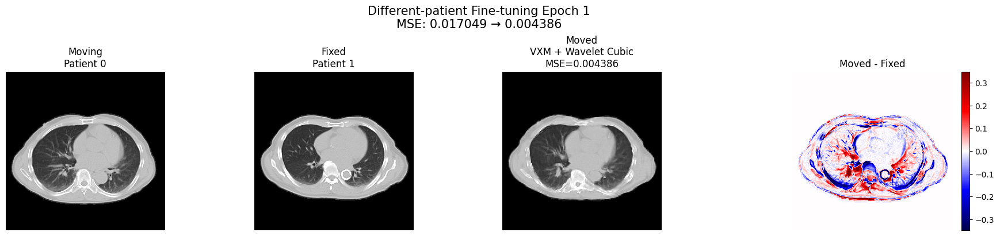


Epoch 00100/30000
Patients:
  Moving = [353, 145]
  Fixed  = [316, 228]
MSE before : 0.02599536
MSE after  : 0.00654756
Pred DVF mean|abs| : 1.5845
Pred DVF max       : 16.3281
GradScaler scale   : 65536.0

Epoch 00200/30000
Patients:
  Moving = [358, 139]
  Fixed  = [83, 33]
MSE before : 0.03196261
MSE after  : 0.00586974
Pred DVF mean|abs| : 1.6197
Pred DVF max       : 18.8281
GradScaler scale   : 65536.0

Epoch 00300/30000
Patients:
  Moving = [187, 81]
  Fixed  = [311, 232]
MSE before : 0.02948614
MSE after  : 0.00462480
Pred DVF mean|abs| : 1.7574
Pred DVF max       : 24.1719
GradScaler scale   : 65536.0

Epoch 00400/30000
Patients:
  Moving = [42, 343]
  Fixed  = [360, 39]
MSE before : 0.02959086
MSE after  : 0.00457118
Pred DVF mean|abs| : 1.7085
Pred DVF max       : 22.6719
GradScaler scale   : 65536.0

Epoch 00500/30000
Patients:
  Moving = [297, 225]
  Fixed  = [360, 257]
MSE before : 0.03509842
MSE after  : 0.00532774
Pred DVF mean|abs| : 1.8924
Pred DVF max       : 24.4219

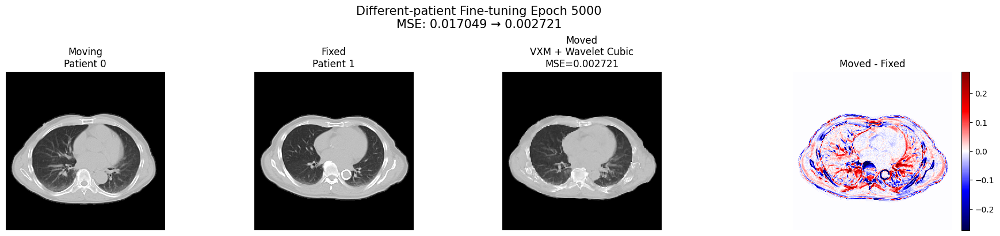


Epoch 05100/30000
Patients:
  Moving = [342, 77]
  Fixed  = [164, 183]
MSE before : 0.02252784
MSE after  : 0.00261336
Pred DVF mean|abs| : 1.0973
Pred DVF max       : 18.0156
GradScaler scale   : 262144.0

Epoch 05200/30000
Patients:
  Moving = [330, 224]
  Fixed  = [355, 68]
MSE before : 0.03310425
MSE after  : 0.00348745
Pred DVF mean|abs| : 1.3826
Pred DVF max       : 18.4375
GradScaler scale   : 262144.0

Epoch 05300/30000
Patients:
  Moving = [318, 356]
  Fixed  = [42, 76]
MSE before : 0.02968435
MSE after  : 0.00374546
Pred DVF mean|abs| : 1.3097
Pred DVF max       : 24.6562
GradScaler scale   : 262144.0

Epoch 05400/30000
Patients:
  Moving = [283, 358]
  Fixed  = [366, 335]
MSE before : 0.02668591
MSE after  : 0.00292553
Pred DVF mean|abs| : 1.0662
Pred DVF max       : 20.3750
GradScaler scale   : 262144.0

Epoch 05500/30000
Patients:
  Moving = [372, 156]
  Fixed  = [119, 245]
MSE before : 0.03261370
MSE after  : 0.00323847
Pred DVF mean|abs| : 1.4087
Pred DVF max       : 29

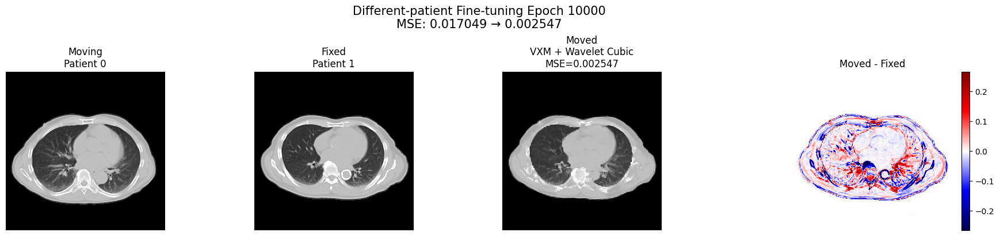


Fine-tuning checkpoint saved: finetune_cubic_different_patients_checkpoints\finetune_epoch_10000.pth

Epoch 10100/30000
Patients:
  Moving = [255, 337]
  Fixed  = [241, 241]
MSE before : 0.03879635
MSE after  : 0.00316861
Pred DVF mean|abs| : 1.8650
Pred DVF max       : 27.8594
GradScaler scale   : 524288.0

Epoch 10200/30000
Patients:
  Moving = [193, 51]
  Fixed  = [138, 249]
MSE before : 0.02742879
MSE after  : 0.00295420
Pred DVF mean|abs| : 1.2904
Pred DVF max       : 18.3906
GradScaler scale   : 524288.0

Epoch 10300/30000
Patients:
  Moving = [395, 34]
  Fixed  = [328, 94]
MSE before : 0.02225689
MSE after  : 0.00278401
Pred DVF mean|abs| : 1.1507
Pred DVF max       : 19.3750
GradScaler scale   : 524288.0

Epoch 10400/30000
Patients:
  Moving = [130, 46]
  Fixed  = [318, 97]
MSE before : 0.03259927
MSE after  : 0.00368570
Pred DVF mean|abs| : 1.4328
Pred DVF max       : 27.2969
GradScaler scale   : 1048576.0

Epoch 10500/30000
Patients:
  Moving = [55, 9]
  Fixed  = [189, 303]


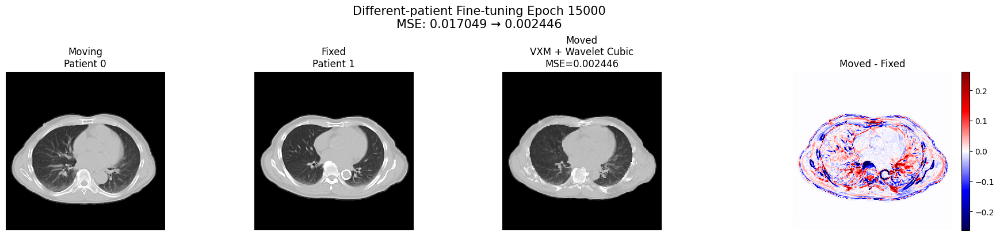


Epoch 15100/30000
Patients:
  Moving = [396, 278]
  Fixed  = [241, 194]
MSE before : 0.03616255
MSE after  : 0.00267130
Pred DVF mean|abs| : 1.4949
Pred DVF max       : 27.3906
GradScaler scale   : 524288.0

Epoch 15200/30000
Patients:
  Moving = [325, 242]
  Fixed  = [330, 98]
MSE before : 0.03096511
MSE after  : 0.00257706
Pred DVF mean|abs| : 1.1798
Pred DVF max       : 29.2344
GradScaler scale   : 524288.0

Epoch 15300/30000
Patients:
  Moving = [227, 263]
  Fixed  = [169, 316]
MSE before : 0.03146116
MSE after  : 0.00295991
Pred DVF mean|abs| : 1.5534
Pred DVF max       : 21.8281
GradScaler scale   : 524288.0

Epoch 15400/30000
Patients:
  Moving = [155, 287]
  Fixed  = [59, 258]
MSE before : 0.03873542
MSE after  : 0.00306276
Pred DVF mean|abs| : 1.4716
Pred DVF max       : 17.1562
GradScaler scale   : 524288.0

Epoch 15500/30000
Patients:
  Moving = [231, 63]
  Fixed  = [192, 148]
MSE before : 0.03390663
MSE after  : 0.00324610
Pred DVF mean|abs| : 1.6090
Pred DVF max       : 2

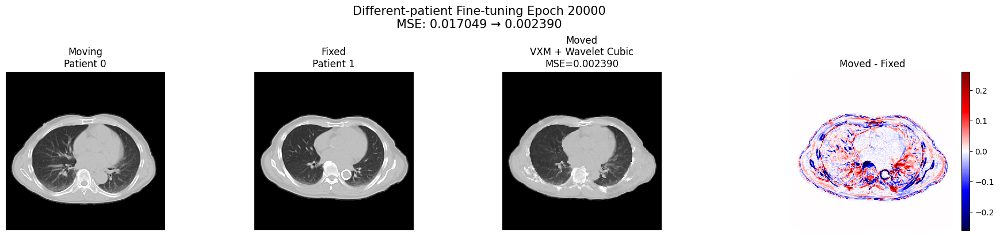


Fine-tuning checkpoint saved: finetune_cubic_different_patients_checkpoints\finetune_epoch_20000.pth

Epoch 20100/30000
Patients:
  Moving = [64, 327]
  Fixed  = [169, 360]
MSE before : 0.03370006
MSE after  : 0.00264707
Pred DVF mean|abs| : 1.5945
Pred DVF max       : 23.8281
GradScaler scale   : 1048576.0

Epoch 20200/30000
Patients:
  Moving = [371, 155]
  Fixed  = [178, 156]
MSE before : 0.05662894
MSE after  : 0.00356125
Pred DVF mean|abs| : 2.3681
Pred DVF max       : 25.7656
GradScaler scale   : 1048576.0

Epoch 20300/30000
Patients:
  Moving = [137, 148]
  Fixed  = [98, 341]
MSE before : 0.03513230
MSE after  : 0.00273647
Pred DVF mean|abs| : 1.2765
Pred DVF max       : 36.9688
GradScaler scale   : 1048576.0

Epoch 20400/30000
Patients:
  Moving = [175, 131]
  Fixed  = [301, 140]
MSE before : 0.02106193
MSE after  : 0.00255896
Pred DVF mean|abs| : 1.1202
Pred DVF max       : 19.9062
GradScaler scale   : 1048576.0

Epoch 20500/30000
Patients:
  Moving = [378, 345]
  Fixed  = [1

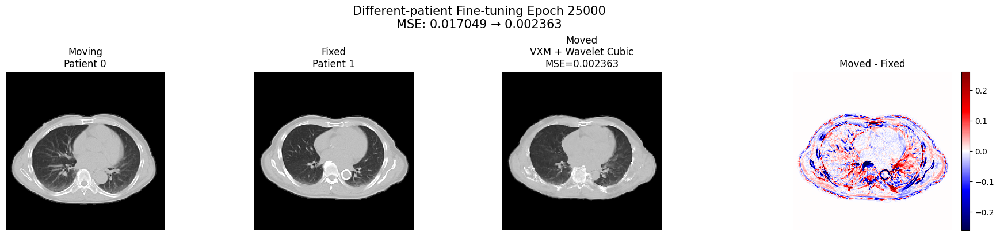


Epoch 25100/30000
Patients:
  Moving = [34, 91]
  Fixed  = [77, 93]
MSE before : 0.02351336
MSE after  : 0.00230705
Pred DVF mean|abs| : 1.2988
Pred DVF max       : 28.5781
GradScaler scale   : 1048576.0

Epoch 25200/30000
Patients:
  Moving = [302, 355]
  Fixed  = [300, 350]
MSE before : 0.02937598
MSE after  : 0.00285607
Pred DVF mean|abs| : 1.3337
Pred DVF max       : 24.6562
GradScaler scale   : 1048576.0

Epoch 25300/30000
Patients:
  Moving = [301, 152]
  Fixed  = [284, 187]
MSE before : 0.02570011
MSE after  : 0.00250324
Pred DVF mean|abs| : 1.4240
Pred DVF max       : 18.5312
GradScaler scale   : 1048576.0

Epoch 25400/30000
Patients:
  Moving = [174, 233]
  Fixed  = [163, 125]
MSE before : 0.04375593
MSE after  : 0.00282569
Pred DVF mean|abs| : 1.6661
Pred DVF max       : 36.5938
GradScaler scale   : 1048576.0

Epoch 25500/30000
Patients:
  Moving = [2, 248]
  Fixed  = [65, 10]
MSE before : 0.02953591
MSE after  : 0.00243359
Pred DVF mean|abs| : 1.5385
Pred DVF max       : 17

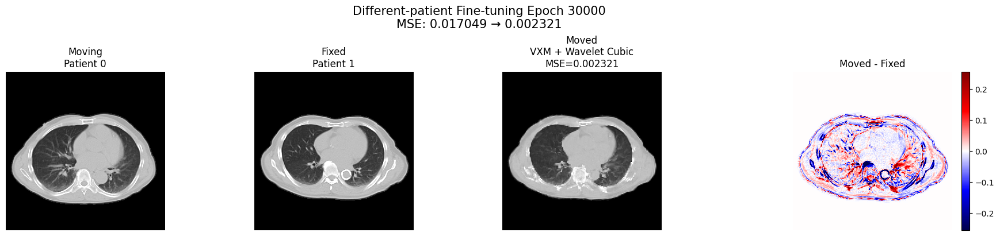


Fine-tuning checkpoint saved: finetune_cubic_different_patients_checkpoints\finetune_epoch_30000.pth

FINE-TUNING COMPLETE
Final: model_DVF_cubic_different_patients_finetuned_final.pth
Latest: model_DVF_cubic_different_patients_finetuned_latest.pth


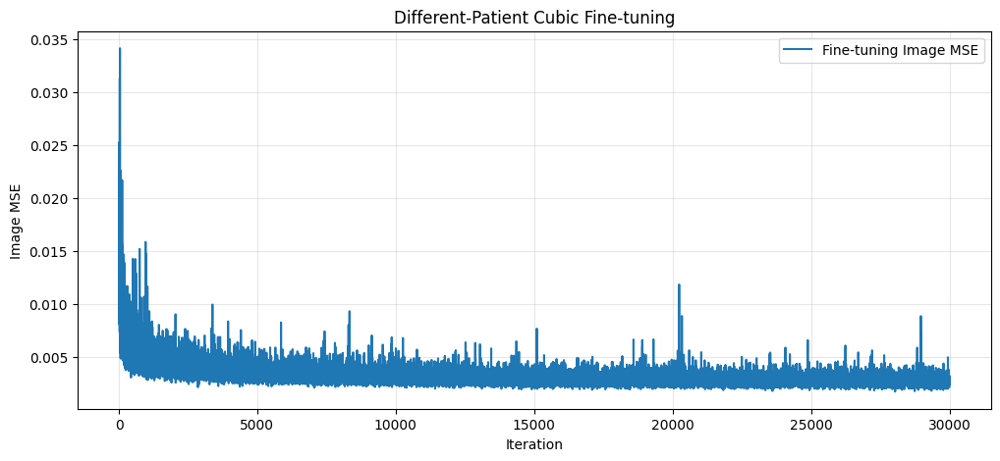

In [53]:
# ======================================================================
# DIFFERENT-PATIENT FINE-TUNING
#
# Pretrained:
#     80,000-iteration Cubic-Cubic Curriculum model
#
# Fine-tuning:
#
#     Different Moving / Fixed patients
#
#     Moving
#         ↓
#     Haar Analysis
#         ↓
#     Current VoxelMorph
#         ↓
#     Wavelet-domain Catmull-Rom Cubic
#         ↓
#     Haar Synthesis
#         ↓
#     Moved
#
# Loss:
#
#     Image MSE only
#
#         L = MSE(Moved, Fixed)
#
# NO:
#
#     Artificial DVF
#     Teacher DVF
#     DVF MSE
#     Smoothness loss
#
# Forward:
#     Full AMP
#
# Loss:
#     FP32
#
# Backward:
#     AMP GradScaler
#
# ======================================================================


# ======================================================================
# 0. Imports
# ======================================================================

from pathlib import Path

import gc
import random
import time

import numpy as np

import torch
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt

from tqdm.notebook import tqdm


# ======================================================================
# 1. Fine-tuning settings
# ======================================================================

FINETUNE_EPOCHS = 30000

FINETUNE_LR = 1e-5

FINETUNE_BATCH_SIZE = 2


# ----------------------------------------------------------------------
# Pretrained curriculum model
# ----------------------------------------------------------------------

PRETRAINED_PATH = Path(
    "model_DVF_cubic_amp_curriculum_final.pth"
)


# ----------------------------------------------------------------------
# Resume
# ----------------------------------------------------------------------

FINETUNE_RESUME = False


# ----------------------------------------------------------------------
# Logging
# ----------------------------------------------------------------------

FINETUNE_CONSOLE_EVERY = 100

FINETUNE_TQDM_EVERY = 10

FINETUNE_OBSERVE_EVERY = 1000

FINETUNE_VISUALIZE_EVERY = 5000


# ----------------------------------------------------------------------
# Checkpoint
# ----------------------------------------------------------------------

FINETUNE_CHECKPOINT_EVERY = 2000


FINETUNE_CHECKPOINT_DIR = Path(
    "finetune_cubic_different_patients_checkpoints"
)

FINETUNE_CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


FINETUNE_LATEST_PATH = Path(
    "model_DVF_cubic_different_patients_finetuned_latest.pth"
)


FINETUNE_FINAL_PATH = Path(
    "model_DVF_cubic_different_patients_finetuned_final.pth"
)


# ----------------------------------------------------------------------
# Observation pair
#
# 学習とは独立した固定患者ペア
# ----------------------------------------------------------------------

OBS_MOVING_ID = 0

OBS_FIXED_ID = 1


# ======================================================================
# 2. Required objects
# ======================================================================

required_names = [

    "x_train",

    "vxm",

    "analysis_fast",

    "synthesis_filter_3d_fast",

    "synthesis_filters_fast",

    "cubic_transformer",

    "device",
]


for name in required_names:

    if name not in globals():

        raise NameError(
            f"{name} が定義されていません。"
            "Curriculum training用の前セルを実行してください。"
        )


# ======================================================================
# 3. Dataset
# ======================================================================

x_train = np.ascontiguousarray(
    x_train,
    dtype=np.float32
)


if len(x_train) < 2:

    raise ValueError(
        "Different-patient fine-tuningには"
        "少なくとも2症例必要です。"
    )


if len(x_train) < FINETUNE_BATCH_SIZE:

    raise ValueError(
        f"BATCH_SIZE={FINETUNE_BATCH_SIZE} に対して "
        f"x_train={len(x_train)} しかありません。"
    )


print()

print("=" * 80)
print("FINE-TUNING DATA")
print("=" * 80)

print(
    "x_train shape :",
    x_train.shape
)

print(
    "x_train dtype :",
    x_train.dtype
)

print(
    "Patients      :",
    len(x_train)
)

print("=" * 80)


# ======================================================================
# 4. Different-patient sampling
# ======================================================================

def sample_different_patients(
    batch_size
):

    # --------------------------------------------------------------
    # Moving
    # --------------------------------------------------------------

    moving_indices = np.random.randint(
        0,
        len(x_train),
        size=batch_size
    )


    # --------------------------------------------------------------
    # Fixed
    # --------------------------------------------------------------

    fixed_indices = np.random.randint(
        0,
        len(x_train),
        size=batch_size
    )


    # --------------------------------------------------------------
    # Moving != Fixed を保証
    # --------------------------------------------------------------

    same = (
        moving_indices
        ==
        fixed_indices
    )


    while np.any(same):

        fixed_indices[same] = (
            np.random.randint(
                0,
                len(x_train),
                size=int(
                    same.sum()
                )
            )
        )

        same = (
            moving_indices
            ==
            fixed_indices
        )


    # --------------------------------------------------------------
    # CPU -> GPU
    # --------------------------------------------------------------

    moving_images = (
        torch.from_numpy(
            x_train[
                moving_indices
            ]
        )
        .unsqueeze(1)
        .to(
            device=device,
            dtype=torch.float32,
            non_blocking=True
        )
    )


    fixed_images = (
        torch.from_numpy(
            x_train[
                fixed_indices
            ]
        )
        .unsqueeze(1)
        .to(
            device=device,
            dtype=torch.float32,
            non_blocking=True
        )
    )


    return (
        moving_images,
        fixed_images,
        moving_indices,
        fixed_indices
    )


# ======================================================================
# 5. Create fresh VoxelMorph
#
# Curriculum cell終了時のmodel3Dをそのまま使うのではなく、
# checkpointから明示的に読み直す。
# ======================================================================

model3D = (
    vxm.networks.VxmDense_128_256_256(
        FULL_SIZE
    )
    .to(device)
)


# ======================================================================
# 6. Load 80k Cubic-Cubic pretrained model
# ======================================================================

if not PRETRAINED_PATH.exists():

    raise FileNotFoundError(
        "80,000 iteration curriculum model not found:\n"
        f"{PRETRAINED_PATH.resolve()}"
    )


try:

    pretrained_checkpoint = torch.load(
        PRETRAINED_PATH,
        map_location=device,
        weights_only=False
    )

except TypeError:

    pretrained_checkpoint = torch.load(
        PRETRAINED_PATH,
        map_location=device
    )


if (
    isinstance(
        pretrained_checkpoint,
        dict
    )
    and
    "model_state_dict"
    in pretrained_checkpoint
):

    pretrained_state_dict = (
        pretrained_checkpoint[
            "model_state_dict"
        ]
    )

else:

    pretrained_state_dict = (
        pretrained_checkpoint
    )


model3D.load_state_dict(
    pretrained_state_dict
)


print()

print("=" * 80)
print("PRETRAINED MODEL LOADED")
print("=" * 80)

print(
    "Checkpoint:",
    PRETRAINED_PATH.resolve()
)

print(
    "Model:",
    model3D.__class__.__name__
)

print("=" * 80)


# ======================================================================
# 7. Optimizer
# ======================================================================

optimizer = optim.Adam(
    model3D.parameters(),
    lr=FINETUNE_LR
)


try:

    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=AMP_ENABLED
    )

except Exception:

    scaler = torch.cuda.amp.GradScaler(
        enabled=AMP_ENABLED
    )


# ======================================================================
# 8. Histories
# ======================================================================

START_FINETUNE_EPOCH = 0


finetune_loss_history = []

finetune_moving_fixed_mse_history = []


# ======================================================================
# 9. Resume
# ======================================================================

if FINETUNE_RESUME:

    if not FINETUNE_LATEST_PATH.exists():

        raise FileNotFoundError(
            "Fine-tuning resume checkpoint not found:\n"
            f"{FINETUNE_LATEST_PATH.resolve()}"
        )


    try:

        checkpoint = torch.load(
            FINETUNE_LATEST_PATH,
            map_location=device,
            weights_only=False
        )

    except TypeError:

        checkpoint = torch.load(
            FINETUNE_LATEST_PATH,
            map_location=device
        )


    model3D.load_state_dict(
        checkpoint[
            "model_state_dict"
        ]
    )


    optimizer.load_state_dict(
        checkpoint[
            "optimizer_state_dict"
        ]
    )


    if checkpoint.get(
        "scaler_state_dict"
    ) is not None:

        scaler.load_state_dict(
            checkpoint[
                "scaler_state_dict"
            ]
        )


    START_FINETUNE_EPOCH = int(
        checkpoint[
            "epoch"
        ]
    )


    finetune_loss_history = (
        checkpoint.get(
            "loss_history",
            []
        )
    )


    finetune_moving_fixed_mse_history = (
        checkpoint.get(
            "moving_fixed_mse_history",
            []
        )
    )


    if "python_random_state" in checkpoint:

        random.setstate(
            checkpoint[
                "python_random_state"
            ]
        )


    if "numpy_random_state" in checkpoint:

        np.random.set_state(
            checkpoint[
                "numpy_random_state"
            ]
        )


    if "torch_random_state" in checkpoint:

        torch.set_rng_state(
            checkpoint[
                "torch_random_state"
            ]
        )


    if (
        torch.cuda.is_available()
        and
        checkpoint.get(
            "cuda_random_state"
        ) is not None
    ):

        torch.cuda.set_rng_state_all(
            checkpoint[
                "cuda_random_state"
            ]
        )


    print()

    print("=" * 80)
    print("RESUME FINE-TUNING")
    print("=" * 80)

    print(
        "Resume epoch:",
        START_FINETUNE_EPOCH
    )

    print("=" * 80)


# ======================================================================
# 10. Fixed observation pair
# ======================================================================

if OBS_MOVING_ID == OBS_FIXED_ID:

    raise ValueError(
        "Observation Moving / Fixed must be different patients."
    )


obs_moving = (
    torch.from_numpy(
        x_train[
            OBS_MOVING_ID:
            OBS_MOVING_ID + 1
        ]
    )
    .unsqueeze(1)
    .to(
        device=device,
        dtype=torch.float32
    )
)


obs_fixed = (
    torch.from_numpy(
        x_train[
            OBS_FIXED_ID:
            OBS_FIXED_ID + 1
        ]
    )
    .unsqueeze(1)
    .to(
        device=device,
        dtype=torch.float32
    )
)


# ----------------------------------------------------------------------
# Haar representations are fixed.
# ----------------------------------------------------------------------

with torch.no_grad():

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        obs_moving_w = analysis_fast(
            obs_moving
        )

        obs_fixed_w = analysis_fast(
            obs_fixed
        )


# ----------------------------------------------------------------------
# Before registration
# ----------------------------------------------------------------------

obs_before_mse = F.mse_loss(
    obs_moving.float(),
    obs_fixed.float()
).item()


print()

print("=" * 80)
print("FIXED OBSERVATION PAIR")
print("=" * 80)

print(
    f"Moving patient : {OBS_MOVING_ID}"
)

print(
    f"Fixed patient  : {OBS_FIXED_ID}"
)

print(
    f"Before MSE     : {obs_before_mse:.8f}"
)

print("=" * 80)


# ======================================================================
# 11. Checkpoint builder
# ======================================================================

def build_finetune_checkpoint(
    epoch
):

    return {

        "epoch":
            epoch,


        "model_state_dict":
            model3D.state_dict(),


        "optimizer_state_dict":
            optimizer.state_dict(),


        "scaler_state_dict":
            scaler.state_dict(),


        "loss_history":
            finetune_loss_history,


        "moving_fixed_mse_history":
            finetune_moving_fixed_mse_history,


        # --------------------------------------------------------------
        # Fine-tuning metadata
        # --------------------------------------------------------------

        "training_type":
            "different_patient_finetuning",


        "pretrained_checkpoint":
            str(
                PRETRAINED_PATH
            ),


        "finetune_epochs":
            FINETUNE_EPOCHS,


        "learning_rate":
            FINETUNE_LR,


        "batch_size":
            FINETUNE_BATCH_SIZE,


        "loss":
            "image_mse_only",


        "image_loss":
            "mse",


        "dvf_loss":
            None,


        "smoothness_loss":
            None,


        # --------------------------------------------------------------
        # Architecture
        # --------------------------------------------------------------

        "analysis":
            "haar_3d",


        "wavelet_warp":
            "cubic_catmull_rom",


        "cubic_a":
            CUBIC_A,


        "cubic_neighbors":
            64,


        "cubic_boundary":
            "out_of_bounds_zero",


        "synthesis":
            "haar_3d",


        "model_class":
            model3D.__class__.__name__,


        # --------------------------------------------------------------
        # AMP
        # --------------------------------------------------------------

        "amp":
            AMP_ENABLED,


        "amp_dtype":
            "float16",


        "loss_dtype":
            "float32",


        # --------------------------------------------------------------
        # RNG
        # --------------------------------------------------------------

        "python_random_state":
            random.getstate(),


        "numpy_random_state":
            np.random.get_state(),


        "torch_random_state":
            torch.get_rng_state(),


        "cuda_random_state":
            (
                torch.cuda.get_rng_state_all()
                if torch.cuda.is_available()
                else
                None
            ),
    }


# ======================================================================
# 12. Settings print
# ======================================================================

print()

print("=" * 80)
print("DIFFERENT-PATIENT FINE-TUNING SETTINGS")
print("=" * 80)

print(
    "Iterations           :",
    FINETUNE_EPOCHS
)

print(
    "Learning rate        :",
    FINETUNE_LR
)

print(
    "Batch size           :",
    FINETUNE_BATCH_SIZE
)

print(
    "Pairing              : Different patients"
)

print(
    "Artificial DVF       : NONE"
)

print(
    "Teacher DVF          : NONE"
)

print(
    "DVF supervision      : NONE"
)

print(
    "Haar Analysis        : YES"
)

print(
    "VoxelMorph           :",
    model3D.__class__.__name__
)

print(
    "Wavelet interpolation: Catmull-Rom Cubic"
)

print(
    "Cubic a              :",
    CUBIC_A
)

print(
    "Haar Synthesis       : YES"
)

print(
    "Loss                 : Image MSE only"
)

print(
    "Smoothness           : NONE"
)

print(
    "AMP                  :",
    AMP_ENABLED
)

print("=" * 80)


# ======================================================================
# 13. Fine-tuning
# ======================================================================

model3D.train()


progress_bar = tqdm(
    range(
        START_FINETUNE_EPOCH,
        FINETUNE_EPOCHS
    ),
    desc="Different-patient Cubic fine-tuning",
    mininterval=1.0
)


for epoch_idx in progress_bar:


    epoch = (
        epoch_idx
        +
        1
    )


    # ==================================================================
    # Different patient pair
    # ==================================================================

    (
        moving_images,
        fixed_images,
        moving_ids,
        fixed_ids

    ) = sample_different_patients(
        FINETUNE_BATCH_SIZE
    )


    # ==================================================================
    # Optimizer reset
    # ==================================================================

    optimizer.zero_grad(
        set_to_none=True
    )


    # ==================================================================
    # Full AMP Forward
    # ==================================================================

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):


        # --------------------------------------------------------------
        # Haar Analysis
        # --------------------------------------------------------------

        moving_w = analysis_fast(
            moving_images
        )


        fixed_w = analysis_fast(
            fixed_images
        )


        # --------------------------------------------------------------
        # VoxelMorph
        #
        # NO true DVF
        # --------------------------------------------------------------

        Vec = model3D(
            moving_w,
            fixed_w
        )


        # --------------------------------------------------------------
        # Sanity checks
        # --------------------------------------------------------------

        if Vec.ndim != 5:

            raise RuntimeError(
                f"DVF dimension error: {Vec.shape}"
            )


        if Vec.shape[1] != 3:

            raise RuntimeError(
                f"DVF channel error: {Vec.shape}"
            )


        if tuple(
            Vec.shape[2:]
        ) != tuple(
            LOW_SIZE
        ):

            raise RuntimeError(
                "DVF spatial size mismatch:\n"
                f"Expected: {LOW_SIZE}\n"
                f"Actual  : {tuple(Vec.shape[2:])}"
            )


        # --------------------------------------------------------------
        # Wavelet-domain Catmull-Rom Cubic
        #
        # IMPORTANT:
        # VoxelMorph SpatialTransformer / Trilinearではない
        # --------------------------------------------------------------

        moving_warped = (
            cubic_transformer(
                moving_w,
                Vec
            )
        )


        # --------------------------------------------------------------
        # Haar Synthesis
        # --------------------------------------------------------------

        transformed_image = (
            synthesis_filter_3d_fast(
                moving_warped,
                synthesis_filters_fast
            )
        )


    # ==================================================================
    # FP32 Image Loss ONLY
    # ==================================================================

    loss_image = F.mse_loss(
        transformed_image.float(),
        fixed_images.float()
    )


    total_loss = (
        loss_image
    )


    # ==================================================================
    # Backward
    # ==================================================================

    scaler.scale(
        total_loss
    ).backward()


    scaler.step(
        optimizer
    )


    scaler.update()


    # ==================================================================
    # Values
    # ==================================================================

    loss_value = (
        total_loss
        .detach()
        .item()
    )


    before_mse_value = (
        F.mse_loss(
            moving_images.float(),
            fixed_images.float()
        )
        .detach()
        .item()
    )


    finetune_loss_history.append(
        loss_value
    )


    finetune_moving_fixed_mse_history.append(
        before_mse_value
    )


    # ==================================================================
    # First iteration shapes
    # ==================================================================

    if (
        epoch
        ==
        START_FINETUNE_EPOCH + 1
    ):

        print()

        print("=" * 80)
        print("FINE-TUNING TENSOR SHAPES")
        print("=" * 80)

        print(
            "Moving         :",
            tuple(
                moving_images.shape
            ),
            moving_images.dtype
        )

        print(
            "Fixed          :",
            tuple(
                fixed_images.shape
            ),
            fixed_images.dtype
        )

        print(
            "Moving Wavelet :",
            tuple(
                moving_w.shape
            ),
            moving_w.dtype
        )

        print(
            "Fixed Wavelet  :",
            tuple(
                fixed_w.shape
            ),
            fixed_w.dtype
        )

        print(
            "Predicted DVF  :",
            tuple(
                Vec.shape
            ),
            Vec.dtype
        )

        print(
            "Moved          :",
            tuple(
                transformed_image.shape
            ),
            transformed_image.dtype
        )

        print("=" * 80)


    # ==================================================================
    # tqdm
    # ==================================================================

    if (
        epoch
        ==
        START_FINETUNE_EPOCH + 1
        or
        epoch
        %
        FINETUNE_TQDM_EVERY
        ==
        0
    ):

        progress_bar.set_postfix(

            loss=f"{loss_value:.6f}",

            before=f"{before_mse_value:.6f}",

            dvf=f"{Vec.detach().float().abs().max().item():.2f}",
        )


    # ==================================================================
    # Console
    # ==================================================================

    if (
        epoch
        ==
        START_FINETUNE_EPOCH + 1
        or
        epoch
        %
        FINETUNE_CONSOLE_EVERY
        ==
        0
    ):

        print()

        print(
            f"Epoch "
            f"{epoch:05d}"
            f"/"
            f"{FINETUNE_EPOCHS}"
        )


        print(
            "Patients:"
        )

        print(
            f"  Moving = "
            f"{moving_ids.tolist()}"
        )

        print(
            f"  Fixed  = "
            f"{fixed_ids.tolist()}"
        )


        print(
            f"MSE before : "
            f"{before_mse_value:.8f}"
        )


        print(
            f"MSE after  : "
            f"{loss_value:.8f}"
        )


        print(
            f"Pred DVF mean|abs| : "
            f"{Vec.detach().float().abs().mean().item():.4f}"
        )


        print(
            f"Pred DVF max       : "
            f"{Vec.detach().float().abs().max().item():.4f}"
        )


        if AMP_ENABLED:

            print(
                f"GradScaler scale   : "
                f"{scaler.get_scale():.1f}"
            )


    # ==================================================================
    # Fixed observation
    # ==================================================================

    do_observation = (

        epoch
        ==
        START_FINETUNE_EPOCH + 1

        or

        epoch
        %
        FINETUNE_OBSERVE_EVERY
        ==
        0
    )


    do_visualization = (

        epoch
        ==
        START_FINETUNE_EPOCH + 1

        or

        epoch
        %
        FINETUNE_VISUALIZE_EVERY
        ==
        0
    )


    if do_observation:


        model3D.eval()


        with torch.no_grad():


            with torch.autocast(
                device_type=device.type,
                dtype=torch.float16,
                enabled=AMP_ENABLED
            ):


                # ------------------------------------------------------
                # VoxelMorph
                # ------------------------------------------------------

                obs_vec = model3D(
                    obs_moving_w,
                    obs_fixed_w
                )


                # ------------------------------------------------------
                # Cubic
                # ------------------------------------------------------

                obs_warped = (
                    cubic_transformer(
                        obs_moving_w,
                        obs_vec
                    )
                )


                # ------------------------------------------------------
                # Haar Synthesis
                # ------------------------------------------------------

                obs_moved = (
                    synthesis_filter_3d_fast(
                        obs_warped,
                        synthesis_filters_fast
                    )
                )


            obs_after_mse = (
                F.mse_loss(
                    obs_moved.float(),
                    obs_fixed.float()
                )
                .item()
            )


            obs_mae_before = (
                F.l1_loss(
                    obs_moving.float(),
                    obs_fixed.float()
                )
                .item()
            )


            obs_mae_after = (
                F.l1_loss(
                    obs_moved.float(),
                    obs_fixed.float()
                )
                .item()
            )


        print()

        print("=" * 70)

        print(
            f"Observation Epoch {epoch}"
        )

        print("=" * 70)


        print(
            f"Patients : "
            f"{OBS_MOVING_ID} -> "
            f"{OBS_FIXED_ID}"
        )


        print(
            f"MSE before : "
            f"{obs_before_mse:.8f}"
        )


        print(
            f"MSE after  : "
            f"{obs_after_mse:.8f}"
        )


        print(
            f"MAE before : "
            f"{obs_mae_before:.8f}"
        )


        print(
            f"MAE after  : "
            f"{obs_mae_after:.8f}"
        )


        print(
            f"DVF mean|abs| : "
            f"{obs_vec.float().abs().mean().item():.4f}"
        )


        print(
            f"DVF max       : "
            f"{obs_vec.float().abs().max().item():.4f}"
        )


        # ==============================================================
        # Visualization
        # ==============================================================

        if do_visualization:


            z = (
                obs_moving.shape[2]
                //
                2
            )


            moving_np = (
                obs_moving[
                    0,
                    0,
                    z
                ]
                .float()
                .cpu()
                .numpy()
            )


            fixed_np = (
                obs_fixed[
                    0,
                    0,
                    z
                ]
                .float()
                .cpu()
                .numpy()
            )


            moved_np = (
                obs_moved[
                    0,
                    0,
                    z
                ]
                .float()
                .cpu()
                .numpy()
            )


            difference_np = (
                moved_np
                -
                fixed_np
            )


            vmin, vmax = np.percentile(
                np.concatenate(
                    [
                        moving_np.ravel(),
                        fixed_np.ravel()
                    ]
                ),
                [
                    1,
                    99
                ]
            )


            diff_limit = max(

                float(
                    np.percentile(
                        np.abs(
                            difference_np
                        ),
                        99
                    )
                ),

                1e-8
            )


            fig, axes = plt.subplots(
                1,
                4,
                figsize=(
                    18,
                    4
                ),
                constrained_layout=True
            )


            axes[0].imshow(
                moving_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )

            axes[0].set_title(
                f"Moving\nPatient {OBS_MOVING_ID}"
            )


            axes[1].imshow(
                fixed_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )

            axes[1].set_title(
                f"Fixed\nPatient {OBS_FIXED_ID}"
            )


            axes[2].imshow(
                moved_np,
                cmap="gray",
                vmin=vmin,
                vmax=vmax
            )

            axes[2].set_title(
                "Moved\n"
                "VXM + Wavelet Cubic\n"
                f"MSE={obs_after_mse:.6f}"
            )


            diff_image = axes[3].imshow(
                difference_np,
                cmap="seismic",
                vmin=-diff_limit,
                vmax=diff_limit
            )


            axes[3].set_title(
                "Moved - Fixed"
            )


            fig.colorbar(
                diff_image,
                ax=axes[3],
                fraction=0.046,
                pad=0.04
            )


            for ax in axes:

                ax.axis(
                    "off"
                )


            fig.suptitle(

                f"Different-patient Fine-tuning "
                f"Epoch {epoch}\n"

                f"MSE: "
                f"{obs_before_mse:.6f} "
                f"→ "
                f"{obs_after_mse:.6f}",

                fontsize=15
            )


            plt.show()


            plt.close(
                fig
            )


        model3D.train()


    # ==================================================================
    # Checkpoint
    # ==================================================================

    if (
        epoch
        %
        FINETUNE_CHECKPOINT_EVERY
        ==
        0
    ):


        checkpoint = (
            build_finetune_checkpoint(
                epoch
            )
        )


        checkpoint_path = (

            FINETUNE_CHECKPOINT_DIR

            /

            f"finetune_epoch_"
            f"{epoch:05d}.pth"
        )


        torch.save(
            checkpoint,
            checkpoint_path
        )


        torch.save(
            checkpoint,
            FINETUNE_LATEST_PATH
        )


        print()

        print(
            "Fine-tuning checkpoint saved:",
            checkpoint_path
        )


# ======================================================================
# 14. Final save
# ======================================================================

final_checkpoint = (
    build_finetune_checkpoint(
        FINETUNE_EPOCHS
    )
)


torch.save(
    final_checkpoint,
    FINETUNE_FINAL_PATH
)


torch.save(
    final_checkpoint,
    FINETUNE_LATEST_PATH
)


print()

print("=" * 80)
print("FINE-TUNING COMPLETE")
print("=" * 80)

print(
    "Final:",
    FINETUNE_FINAL_PATH
)

print(
    "Latest:",
    FINETUNE_LATEST_PATH
)

print("=" * 80)


# ======================================================================
# 15. Loss plot
# ======================================================================

epochs_axis = np.arange(
    1,
    len(
        finetune_loss_history
    )
    +
    1
)


plt.figure(
    figsize=(
        12,
        5
    )
)


plt.plot(
    epochs_axis,
    finetune_loss_history,
    label="Fine-tuning Image MSE"
)


plt.xlabel(
    "Iteration"
)


plt.ylabel(
    "Image MSE"
)


plt.title(
    "Different-Patient Cubic Fine-tuning"
)


plt.grid(
    alpha=0.3
)


plt.legend()


plt.show()

In [48]:
# ======================================================================
# ONE-ITERATION TRAINING SPEED PROFILE
#
# Current production settings:
#
#   Batch size            : BATCH_SIZE
#   Teacher               : Chunked Vectorized Cubic
#   Teacher chunk depth   : TEACHER_CUBIC_CHUNK_DEPTH
#   Haar / VXM / Cubic    : AMP
#   Loss                  : FP32
#   Backward              : GradScaler
#
# 計測対象:
#
#   01 Patient sampling
#   02 CPU -> GPU
#   03 Artificial DVF
#   04 Full Cubic Teacher
#   05 Haar Analysis
#   06 VoxelMorph forward
#   07 Wavelet Cubic
#   08 Haar Synthesis
#   09 Loss
#   10 Backward
#   11 Optimizer
#
# 注意:
#   このセルはoptimizer.step()まで実行するため、
#   モデル重みを1 iteration更新します。
# ======================================================================

import time
import numpy as np
import torch
import torch.nn.functional as F


# ======================================================================
# 0. Settings
# ======================================================================

PROFILE_SHIFT = 20

PROFILE_WARMUP = 2

PROFILE_REPEATS = 5


# ======================================================================
# 1. Timing helper
# ======================================================================

def cuda_sync():

    if torch.cuda.is_available():
        torch.cuda.synchronize()


def timed_call(fn):

    cuda_sync()

    start = time.perf_counter()

    result = fn()

    cuda_sync()

    elapsed = (
        time.perf_counter()
        -
        start
    )

    return result, elapsed


# ======================================================================
# 2. One complete profiled iteration
# ======================================================================

def run_profile_iteration(
    shift,
    do_update=True
):

    times = {}


    # ==================================================================
    # 01. Patient sampling
    # ==================================================================

    def step_patient_sampling():

        return np.random.choice(
            len(x_train),
            size=BATCH_SIZE,
            replace=False
        )


    indices, times["01 Patient sampling"] = (
        timed_call(
            step_patient_sampling
        )
    )


    # ==================================================================
    # 02. CPU -> GPU
    # ==================================================================

    def step_cpu_to_gpu():

        return (
            torch.from_numpy(
                x_train[indices]
            )
            .unsqueeze(1)
            .to(
                device,
                non_blocking=True
            )
        )


    moving_images, times["02 CPU -> GPU"] = (
        timed_call(
            step_cpu_to_gpu
        )
    )


    # ==================================================================
    # 03. Artificial DVF
    # ==================================================================

    def step_artificial_dvf():

        with torch.no_grad():

            return generate_artificial_dvf(
                batch_size=BATCH_SIZE,
                shift=shift
            )


    (
        displacement_field_full,
        displacement_field_low
    ), times["03 Artificial DVF"] = (
        timed_call(
            step_artificial_dvf
        )
    )


    # ==================================================================
    # 04. Full-resolution Teacher Cubic
    # ==================================================================

    def step_teacher():

        with torch.no_grad():

            return cubic_transformer_full_fast(
                moving_images,
                displacement_field_full
            )


    moving_prime, times["04 Full Cubic Teacher"] = (
        timed_call(
            step_teacher
        )
    )


    # ==================================================================
    # Optimizer reset
    # ==================================================================

    optimizer.zero_grad(
        set_to_none=True
    )


    # ==================================================================
    # 05. Haar Analysis
    # ==================================================================

    def step_haar_analysis():

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=AMP_ENABLED
        ):

            moving_w = analysis_fast(
                moving_images
            )

            moving_prime_w = analysis_fast(
                moving_prime
            )

        return (
            moving_w,
            moving_prime_w
        )


    (
        moving_w,
        moving_prime_w
    ), times["05 Haar Analysis"] = (
        timed_call(
            step_haar_analysis
        )
    )


    # ==================================================================
    # 06. VoxelMorph forward
    # ==================================================================

    def step_vxm():

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=AMP_ENABLED
        ):

            return model3D(
                moving_w,
                moving_prime_w
            )


    Vec, times["06 VoxelMorph forward"] = (
        timed_call(
            step_vxm
        )
    )


    # ==================================================================
    # 07. Wavelet Cubic
    # ==================================================================

    def step_wavelet_cubic():

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=AMP_ENABLED
        ):

            return cubic_transformer(
                moving_w,
                Vec
            )


    moving_warped, times["07 Wavelet Cubic"] = (
        timed_call(
            step_wavelet_cubic
        )
    )


    # ==================================================================
    # 08. Haar Synthesis
    # ==================================================================

    def step_haar_synthesis():

        with torch.autocast(
            device_type=device.type,
            dtype=torch.float16,
            enabled=AMP_ENABLED
        ):

            return synthesis_filter_3d_fast(
                moving_warped,
                synthesis_filters_fast
            )


    transformed_image, times["08 Haar Synthesis"] = (
        timed_call(
            step_haar_synthesis
        )
    )


    # ==================================================================
    # 09. Loss
    # ==================================================================

    def step_loss():

        raw_loss_image = F.mse_loss(
            transformed_image.float(),
            moving_prime.float()
        )

        raw_loss_vec = F.mse_loss(
            Vec.float(),
            displacement_field_low.float()
        )

        loss_image = (
            IMAGE_WEIGHT
            *
            raw_loss_image
        )

        loss_vec = (
            DVF_WEIGHT
            *
            raw_loss_vec
        )

        total_loss = (
            loss_image
            +
            loss_vec
        )

        return (
            total_loss,
            raw_loss_image,
            raw_loss_vec
        )


    (
        total_loss,
        raw_loss_image,
        raw_loss_vec
    ), times["09 Loss"] = (
        timed_call(
            step_loss
        )
    )


    # ==================================================================
    # 10. Backward
    # ==================================================================

    def step_backward():

        scaler.scale(
            total_loss
        ).backward()


    _, times["10 Backward"] = (
        timed_call(
            step_backward
        )
    )


    # ==================================================================
    # 11. Optimizer
    # ==================================================================

    def step_optimizer():

        if do_update:

            scaler.step(
                optimizer
            )

            scaler.update()


    _, times["11 Optimizer"] = (
        timed_call(
            step_optimizer
        )
    )


    # ==================================================================
    # Total
    # ==================================================================

    times["TOTAL"] = sum(
        times.values()
    )


    metrics = {

        "total_loss":
            total_loss.detach().item(),

        "image_mse":
            raw_loss_image.detach().item(),

        "dvf_mse":
            raw_loss_vec.detach().item(),

        "true_dvf_full_max":
            displacement_field_full
            .abs()
            .max()
            .item(),

        "true_dvf_low_max":
            displacement_field_low
            .abs()
            .max()
            .item(),

        "pred_dvf_max":
            Vec.detach()
            .abs()
            .max()
            .item(),
    }


    return (
        times,
        metrics
    )


# ======================================================================
# 3. Warm-up
# ======================================================================

print()

print("=" * 80)

print(
    "ONE-ITERATION SPEED PROFILE"
)

print("=" * 80)

print(
    "GPU:",
    torch.cuda.get_device_name(0)
    if torch.cuda.is_available()
    else device
)

print(
    "Batch size          :",
    BATCH_SIZE
)

print(
    "Profile shift       :",
    PROFILE_SHIFT,
    "(pre-smoothing)"
)

print(
    "Teacher chunk depth :",
    TEACHER_CUBIC_CHUNK_DEPTH
)

print(
    "Warm-up             :",
    PROFILE_WARMUP
)

print(
    "Repeats             :",
    PROFILE_REPEATS
)


model3D.train()


print()

print(
    "Warm-up..."
)


for _ in range(
    PROFILE_WARMUP
):

    run_profile_iteration(
        shift=PROFILE_SHIFT,
        do_update=True
    )


cuda_sync()


# ======================================================================
# 4. Measured iterations
# ======================================================================

profile_results = []

profile_metrics = []


print(
    "Profiling..."
)


for repeat_idx in range(
    PROFILE_REPEATS
):

    times, metrics = (
        run_profile_iteration(
            shift=PROFILE_SHIFT,
            do_update=True
        )
    )

    profile_results.append(
        times
    )

    profile_metrics.append(
        metrics
    )

    print(
        f"Repeat "
        f"{repeat_idx + 1}"
        f"/"
        f"{PROFILE_REPEATS}"
        f" : "
        f"{times['TOTAL']:.4f} sec"
    )


# ======================================================================
# 5. Aggregate
# ======================================================================

step_names = list(
    profile_results[0].keys()
)


summary = {}


for step in step_names:

    values = np.asarray(
        [
            result[step]
            for result in profile_results
        ],
        dtype=np.float64
    )

    summary[step] = {

        "mean":
            values.mean(),

        "median":
            np.median(values),

        "std":
            values.std(),

        "min":
            values.min(),

        "max":
            values.max(),
    }


mean_total = summary["TOTAL"]["mean"]


# ======================================================================
# 6. Print table
# ======================================================================

print()

print("=" * 100)

print(
    "ITERATION SPEED PROFILE"
)

print("=" * 100)


print(
    f"{'Step':30s}"
    f"{'Mean [s]':>12s}"
    f"{'Median':>12s}"
    f"{'Std':>12s}"
    f"{'% total':>12s}"
)


print("-" * 100)


for step in step_names:

    if step == "TOTAL":
        continue

    mean_value = (
        summary[step]["mean"]
    )

    median_value = (
        summary[step]["median"]
    )

    std_value = (
        summary[step]["std"]
    )

    percentage = (
        100.0
        *
        mean_value
        /
        mean_total
    )


    print(
        f"{step:30s}"
        f"{mean_value:12.4f}"
        f"{median_value:12.4f}"
        f"{std_value:12.4f}"
        f"{percentage:11.1f}%"
    )


print("-" * 100)


print(
    f"{'TOTAL':30s}"
    f"{mean_total:12.4f}"
    f"{summary['TOTAL']['median']:12.4f}"
    f"{summary['TOTAL']['std']:12.4f}"
    f"{100.0:11.1f}%"
)


print("=" * 100)


# ======================================================================
# 7. Training metrics
# ======================================================================

last_metrics = (
    profile_metrics[-1]
)


print()

print("=" * 80)

print(
    "LAST PROFILE ITERATION METRICS"
)

print("=" * 80)


print(
    f"Total Loss        : "
    f"{last_metrics['total_loss']:.8f}"
)

print(
    f"Image MSE         : "
    f"{last_metrics['image_mse']:.8f}"
)

print(
    f"DVF MSE           : "
    f"{last_metrics['dvf_mse']:.8f}"
)

print(
    f"True DVF max full : "
    f"{last_metrics['true_dvf_full_max']:.4f}"
)

print(
    f"True DVF max low  : "
    f"{last_metrics['true_dvf_low_max']:.4f}"
)

print(
    f"Pred DVF max      : "
    f"{last_metrics['pred_dvf_max']:.4f}"
)


# ======================================================================
# 8. 80,000 iteration estimate
# ======================================================================

estimated_hours = (
    mean_total
    *
    EPOCHS
    /
    3600.0
)


estimated_days = (
    estimated_hours
    /
    24.0
)


print()

print("=" * 80)

print(
    "TRAINING TIME ESTIMATE"
)

print("=" * 80)


print(
    f"Mean iteration time : "
    f"{mean_total:.4f} sec"
)

print(
    f"{EPOCHS:,} iterations   : "
    f"{estimated_hours:.2f} hours"
)

print(
    f"                   : "
    f"{estimated_days:.2f} days"
)

print("=" * 80)


ONE-ITERATION SPEED PROFILE
GPU: NVIDIA GeForce RTX 3090
Batch size          : 2
Profile shift       : 20 (pre-smoothing)
Teacher chunk depth : 1
Warm-up             : 2
Repeats             : 5

Warm-up...
Profiling...
Repeat 1/5 : 4.0070 sec
Repeat 2/5 : 4.0345 sec
Repeat 3/5 : 4.0622 sec
Repeat 4/5 : 4.0970 sec
Repeat 5/5 : 4.0430 sec

ITERATION SPEED PROFILE
Step                              Mean [s]      Median         Std     % total
----------------------------------------------------------------------------------------------------
01 Patient sampling                 0.0001      0.0001      0.0000        0.0%
02 CPU -> GPU                       0.0438      0.0448      0.0027        1.1%
03 Artificial DVF                   0.0062      0.0060      0.0007        0.2%
04 Full Cubic Teacher               0.2900      0.2901      0.0046        7.2%
05 Haar Analysis                    0.0021      0.0021      0.0001        0.1%
06 VoxelMorph forward               2.1066      2.1119      

In [51]:
# ======================================================================
# PRODUCTION-LIKE CUDA EVENT PROFILER
#
# 目的:
#
#   各工程の間で torch.cuda.synchronize() を入れず、
#   実際の学習に近い非同期実行状態のままGPU時間を測る。
#
# CUDA Event:
#
#   Artificial DVF
#   Full Cubic Teacher
#   Haar Analysis
#   VoxelMorph
#   Wavelet Cubic
#   Haar Synthesis
#   Loss
#   Backward
#   Optimizer
#
# さらに、
#   1 iteration全体のwall-clock時間
# も測定する。
#
# optimizer.step()を行うので重みは更新される。
#
# 本番開始前の検証用として使用し、
# その後モデルを再初期化して本番開始すること。
# ======================================================================

import time
import numpy as np
import torch
import torch.nn.functional as F


# ======================================================================
# 0. Settings
# ======================================================================

EVENT_PROFILE_SHIFT = 20

EVENT_PROFILE_WARMUP = 3

EVENT_PROFILE_REPEATS = 10


# ======================================================================
# 1. CUDA Event helper
# ======================================================================

def make_event():

    return torch.cuda.Event(
        enable_timing=True
    )


# ======================================================================
# 2. One production-like iteration
# ======================================================================

def run_event_profile_iteration(
    shift
):

    model3D.train()

    # ------------------------------------------------------------------
    # CPU wall-clock
    # ------------------------------------------------------------------

    torch.cuda.synchronize()

    wall_start = time.perf_counter()


    # ==================================================================
    # CPU patient sampling
    # ==================================================================

    cpu_start = time.perf_counter()

    indices = np.random.choice(
        len(x_train),
        size=BATCH_SIZE,
        replace=False
    )

    cpu_patient_sampling = (
        time.perf_counter()
        -
        cpu_start
    )


    # ==================================================================
    # CPU -> GPU
    # ==================================================================

    e_h2d_start = make_event()
    e_h2d_end   = make_event()

    e_h2d_start.record()

    moving_images = (
        torch.from_numpy(
            x_train[indices]
        )
        .unsqueeze(1)
        .to(
            device,
            non_blocking=True
        )
    )

    e_h2d_end.record()


    # ==================================================================
    # Artificial DVF
    # ==================================================================

    e_dvf_start = make_event()
    e_dvf_end   = make_event()

    e_dvf_start.record()

    with torch.no_grad():

        (
            displacement_field_full,
            displacement_field_low
        ) = generate_artificial_dvf(
            batch_size=BATCH_SIZE,
            shift=shift
        )

    e_dvf_end.record()


    # ==================================================================
    # Full-resolution Teacher Cubic
    # ==================================================================

    e_teacher_start = make_event()
    e_teacher_end   = make_event()

    e_teacher_start.record()

    with torch.no_grad():

        moving_prime = (
            cubic_transformer_full_fast(
                moving_images,
                displacement_field_full
            )
        )

    e_teacher_end.record()


    # ==================================================================
    # Optimizer reset
    #
    # CPU operation mainly
    # ==================================================================

    optimizer.zero_grad(
        set_to_none=True
    )


    # ==================================================================
    # Haar Analysis
    # ==================================================================

    e_haar_start = make_event()
    e_haar_end   = make_event()

    e_haar_start.record()

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        moving_w = analysis_fast(
            moving_images
        )

        moving_prime_w = analysis_fast(
            moving_prime
        )

    e_haar_end.record()


    # ==================================================================
    # VoxelMorph
    # ==================================================================

    e_vxm_start = make_event()
    e_vxm_end   = make_event()

    e_vxm_start.record()

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        Vec = model3D(
            moving_w,
            moving_prime_w
        )

    e_vxm_end.record()


    # ==================================================================
    # Wavelet Cubic
    # ==================================================================

    e_wavelet_start = make_event()
    e_wavelet_end   = make_event()

    e_wavelet_start.record()

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        moving_warped = cubic_transformer(
            moving_w,
            Vec
        )

    e_wavelet_end.record()


    # ==================================================================
    # Haar Synthesis
    # ==================================================================

    e_synthesis_start = make_event()
    e_synthesis_end   = make_event()

    e_synthesis_start.record()

    with torch.autocast(
        device_type=device.type,
        dtype=torch.float16,
        enabled=AMP_ENABLED
    ):

        transformed_image = (
            synthesis_filter_3d_fast(
                moving_warped,
                synthesis_filters_fast
            )
        )

    e_synthesis_end.record()


    # ==================================================================
    # Loss FP32
    # ==================================================================

    e_loss_start = make_event()
    e_loss_end   = make_event()

    e_loss_start.record()

    raw_loss_image = F.mse_loss(
        transformed_image.float(),
        moving_prime.float()
    )

    raw_loss_vec = F.mse_loss(
        Vec.float(),
        displacement_field_low.float()
    )

    total_loss = (
        IMAGE_WEIGHT
        *
        raw_loss_image
        +
        DVF_WEIGHT
        *
        raw_loss_vec
    )

    e_loss_end.record()


    # ==================================================================
    # Backward
    # ==================================================================

    e_backward_start = make_event()
    e_backward_end   = make_event()

    e_backward_start.record()

    scaler.scale(
        total_loss
    ).backward()

    e_backward_end.record()


    # ==================================================================
    # Optimizer
    # ==================================================================

    e_optimizer_start = make_event()
    e_optimizer_end   = make_event()

    e_optimizer_start.record()

    scaler.step(
        optimizer
    )

    scaler.update()

    e_optimizer_end.record()


    # ==================================================================
    # One synchronization only
    # ==================================================================

    torch.cuda.synchronize()


    wall_time = (
        time.perf_counter()
        -
        wall_start
    )


    # ==================================================================
    # CUDA elapsed times
    #
    # milliseconds -> seconds
    # ==================================================================

    gpu_times = {

        "01 H2D":
            e_h2d_start.elapsed_time(
                e_h2d_end
            ) / 1000.0,

        "02 Artificial DVF":
            e_dvf_start.elapsed_time(
                e_dvf_end
            ) / 1000.0,

        "03 Full Cubic Teacher":
            e_teacher_start.elapsed_time(
                e_teacher_end
            ) / 1000.0,

        "04 Haar Analysis":
            e_haar_start.elapsed_time(
                e_haar_end
            ) / 1000.0,

        "05 VoxelMorph":
            e_vxm_start.elapsed_time(
                e_vxm_end
            ) / 1000.0,

        "06 Wavelet Cubic":
            e_wavelet_start.elapsed_time(
                e_wavelet_end
            ) / 1000.0,

        "07 Haar Synthesis":
            e_synthesis_start.elapsed_time(
                e_synthesis_end
            ) / 1000.0,

        "08 Loss":
            e_loss_start.elapsed_time(
                e_loss_end
            ) / 1000.0,

        "09 Backward":
            e_backward_start.elapsed_time(
                e_backward_end
            ) / 1000.0,

        "10 Optimizer":
            e_optimizer_start.elapsed_time(
                e_optimizer_end
            ) / 1000.0,
    }


    metrics = {

        "wall_time":
            wall_time,

        "patient_sampling":
            cpu_patient_sampling,

        "total_loss":
            total_loss.detach().item(),

        "image_mse":
            raw_loss_image.detach().item(),

        "dvf_mse":
            raw_loss_vec.detach().item(),
    }


    return (
        gpu_times,
        metrics
    )


# ======================================================================
# 3. Warm-up
# ======================================================================

print()

print("=" * 90)
print("PRODUCTION-LIKE CUDA EVENT PROFILE")
print("=" * 90)

print(
    "GPU:",
    torch.cuda.get_device_name(0)
)

print(
    "Batch size:",
    BATCH_SIZE
)

print(
    "Shift:",
    EVENT_PROFILE_SHIFT,
    "(pre-smoothing)"
)

print(
    "Teacher chunk:",
    TEACHER_CUBIC_CHUNK_DEPTH
)

print(
    "Warm-up:",
    EVENT_PROFILE_WARMUP
)

print(
    "Repeats:",
    EVENT_PROFILE_REPEATS
)

print("=" * 90)


print()

print(
    "Warm-up..."
)


for _ in range(
    EVENT_PROFILE_WARMUP
):

    run_event_profile_iteration(
        EVENT_PROFILE_SHIFT
    )


# ======================================================================
# 4. Measurement
# ======================================================================

all_gpu_times = []

all_metrics = []


print(
    "Profiling..."
)


for i in range(
    EVENT_PROFILE_REPEATS
):

    gpu_times, metrics = (
        run_event_profile_iteration(
            EVENT_PROFILE_SHIFT
        )
    )

    all_gpu_times.append(
        gpu_times
    )

    all_metrics.append(
        metrics
    )

    print(
        f"Repeat "
        f"{i + 1:02d}"
        f"/"
        f"{EVENT_PROFILE_REPEATS}"
        f" | wall "
        f"{metrics['wall_time']:.4f} sec"
    )


# ======================================================================
# 5. Aggregate GPU timings
# ======================================================================

step_names = list(
    all_gpu_times[0].keys()
)


summary = {}


for name in step_names:

    values = np.asarray(
        [
            r[name]
            for r in all_gpu_times
        ],
        dtype=np.float64
    )

    summary[name] = {

        "mean":
            values.mean(),

        "median":
            np.median(values),

        "std":
            values.std(),

        "min":
            values.min(),

        "max":
            values.max(),
    }


gpu_mean_total = sum(
    summary[name]["mean"]
    for name in step_names
)


wall_values = np.asarray(
    [
        x["wall_time"]
        for x in all_metrics
    ],
    dtype=np.float64
)


wall_mean = (
    wall_values.mean()
)

wall_median = (
    np.median(
        wall_values
    )
)


# ======================================================================
# 6. Results
# ======================================================================

print()

print("=" * 110)

print(
    "CUDA EVENT GPU PROFILE"
)

print("=" * 110)


print(
    f"{'Step':30s}"
    f"{'Mean[s]':>12s}"
    f"{'Median':>12s}"
    f"{'Std':>12s}"
    f"{'% GPU':>12s}"
)


print("-" * 110)


for name in step_names:

    mean_value = (
        summary[name]["mean"]
    )

    percentage = (
        100.0
        *
        mean_value
        /
        gpu_mean_total
    )


    print(
        f"{name:30s}"
        f"{mean_value:12.4f}"
        f"{summary[name]['median']:12.4f}"
        f"{summary[name]['std']:12.4f}"
        f"{percentage:11.1f}%"
    )


print("-" * 110)


print(
    f"{'GPU SUM':30s}"
    f"{gpu_mean_total:12.4f}"
)


print("=" * 110)


# ======================================================================
# 7. Wall-clock
# ======================================================================

print()

print("=" * 90)
print("END-TO-END WALL CLOCK")
print("=" * 90)


print(
    f"Wall mean   : "
    f"{wall_mean:.4f} sec/iteration"
)

print(
    f"Wall median : "
    f"{wall_median:.4f} sec/iteration"
)

print(
    f"GPU event sum: "
    f"{gpu_mean_total:.4f} sec"
)


host_overhead = (
    wall_mean
    -
    gpu_mean_total
)


print(
    f"Wall - GPU sum: "
    f"{host_overhead:.4f} sec"
)


print("=" * 90)


# ======================================================================
# 8. Training estimate
# ======================================================================

hours = (
    wall_mean
    *
    EPOCHS
    /
    3600.0
)


days = (
    hours
    /
    24.0
)


print()

print("=" * 90)
print("TRAINING ESTIMATE")
print("=" * 90)


print(
    f"{EPOCHS:,} iterations:"
)

print(
    f"{hours:.2f} hours"
)

print(
    f"{days:.2f} days"
)

print("=" * 90)


# ======================================================================
# 9. Last metrics
# ======================================================================

last = all_metrics[-1]


print()

print(
    f"Last Total Loss : "
    f"{last['total_loss']:.8f}"
)

print(
    f"Last Image MSE  : "
    f"{last['image_mse']:.8f}"
)

print(
    f"Last DVF MSE    : "
    f"{last['dvf_mse']:.8f}"
)


# ======================================================================
# 10. Restore
# ======================================================================

model3D.train()

optimizer.zero_grad(
    set_to_none=True
)


print()

print(
    "Profiling complete."
)

print(
    "NOTE: optimizer.step() was performed during profiling."
)


PRODUCTION-LIKE CUDA EVENT PROFILE
GPU: NVIDIA GeForce RTX 3090
Batch size: 2
Shift: 20 (pre-smoothing)
Teacher chunk: 1
Warm-up: 3
Repeats: 10

Warm-up...
Profiling...
Repeat 01/10 | wall 0.4969 sec
Repeat 02/10 | wall 0.4996 sec
Repeat 03/10 | wall 0.5041 sec
Repeat 04/10 | wall 0.5008 sec
Repeat 05/10 | wall 0.4988 sec
Repeat 06/10 | wall 0.4939 sec
Repeat 07/10 | wall 0.5032 sec
Repeat 08/10 | wall 0.5113 sec
Repeat 09/10 | wall 0.4942 sec
Repeat 10/10 | wall 0.5259 sec

CUDA EVENT GPU PROFILE
Step                               Mean[s]      Median         Std       % GPU
--------------------------------------------------------------------------------------------------------------
01 H2D                              0.0431      0.0441      0.0035        8.6%
02 Artificial DVF                   0.0021      0.0019      0.0004        0.4%
03 Full Cubic Teacher               0.2878      0.2840      0.0114       57.3%
04 Haar Analysis                    0.0020      0.0021      0.0000   

In [45]:
# ======================================================================
# HYBRID CUBIC VALIDATION
# ======================================================================

hybrid_cubic_transformer_full = (
    Hybrid4LoopCubicSpatialTransformer3D(
        size=FULL_SIZE,
        a=-0.5
    )
    .to(device)
)


# ----------------------------------------------------------------------
# 同じMoving / 同じDVFを使う
# ----------------------------------------------------------------------

test_moving = (
    torch.from_numpy(
        x_train[:BATCH_SIZE]
    )
    .unsqueeze(1)
    .to(
        device=device,
        dtype=torch.float32
    )
)


# 学習乱数を変えたくない場合に備えて保存
torch_state = torch.get_rng_state()

cuda_state = (
    torch.cuda.get_rng_state_all()
    if torch.cuda.is_available()
    else None
)


torch.manual_seed(20260904)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(20260904)


with torch.no_grad():

    test_flow_full, _ = generate_artificial_dvf(
        batch_size=BATCH_SIZE,
        shift=20
    )


# RNGを戻す
torch.set_rng_state(
    torch_state
)

if (
    torch.cuda.is_available()
    and
    cuda_state is not None
):
    torch.cuda.set_rng_state_all(
        cuda_state
    )


# ----------------------------------------------------------------------
# 現在のChunked Cubic
# ----------------------------------------------------------------------

if torch.cuda.is_available():
    torch.cuda.synchronize()

torch.cuda.reset_peak_memory_stats()


with torch.no_grad():

    start = time.perf_counter()

    reference = cubic_transformer_full_fast(
        test_moving,
        test_flow_full
    )

    if torch.cuda.is_available():
        torch.cuda.synchronize()

    current_time = (
        time.perf_counter()
        -
        start
    )


current_vram = (
    torch.cuda.max_memory_allocated()
    /
    1024**3
)


# ----------------------------------------------------------------------
# Hybrid 4-loop
# ----------------------------------------------------------------------

if torch.cuda.is_available():
    torch.cuda.synchronize()

torch.cuda.reset_peak_memory_stats()


with torch.no_grad():

    start = time.perf_counter()

    hybrid = hybrid_cubic_transformer_full(
        test_moving,
        test_flow_full
    )

    if torch.cuda.is_available():
        torch.cuda.synchronize()

    hybrid_time = (
        time.perf_counter()
        -
        start
    )


hybrid_vram = (
    torch.cuda.max_memory_allocated()
    /
    1024**3
)


# ======================================================================
# Numerical difference
# ======================================================================

difference = (
    hybrid.float()
    -
    reference.float()
)


mae = (
    difference
    .abs()
    .mean()
    .item()
)


mse = (
    difference
    .square()
    .mean()
    .item()
)


rmse = (
    mse ** 0.5
)


max_error = (
    difference
    .abs()
    .max()
    .item()
)


relative_l2 = (

    torch.linalg.vector_norm(
        difference
    )

    /

    torch.linalg.vector_norm(
        reference.float()
    ).clamp_min(1e-12)

).item()


# ======================================================================
# Result
# ======================================================================

print()
print("=" * 80)
print("CURRENT CUBIC vs HYBRID 4-LOOP")
print("=" * 80)

print(
    f"MAE         : {mae:.12e}"
)

print(
    f"RMSE        : {rmse:.12e}"
)

print(
    f"Max error   : {max_error:.12e}"
)

print(
    f"Relative L2 : {relative_l2:.12e}"
)

print()

print(
    f"Current time: {current_time:.4f} sec"
)

print(
    f"Hybrid time : {hybrid_time:.4f} sec"
)

print(
    f"Speed ratio : {current_time / hybrid_time:.3f} x"
)

print()

print(
    f"Current VRAM: {current_vram:.3f} GB"
)

print(
    f"Hybrid VRAM : {hybrid_vram:.3f} GB"
)

print()


PASS = (
    mae <= 1e-6
    and
    max_error <= 1e-4
)


print(
    "Numerical equivalence:",
    "PASS" if PASS else "FAIL"
)

print("=" * 80)

NameError: name 'Hybrid4LoopCubicSpatialTransformer3D' is not defined

In [43]:
# ======================================================================
# TEACHER CUBIC AUTO BENCHMARK
#
# Compare:
#
#   1. Old Memory-Efficient Cubic
#   2. Chunked Vectorized Cubic depth=1
#   3. Chunked Vectorized Cubic depth=2
#   4. Chunked Vectorized Cubic depth=4
#   5. Chunked Vectorized Cubic depth=8
#
# Same:
#   - Moving
#   - DVF
#   - FP32
#   - Catmull-Rom a=-0.5
#   - 4×4×4 = 64 neighbors
#   - zero OOB
#   - no renormalization
#
# 最後に数値的に等価な候補の中から
# 最速Teacherを自動選択して
#
#   cubic_transformer_full_fast
#
# に設定する。
# ======================================================================


import time
import random

import numpy as np

import torch
import torch.nn as nn


# ======================================================================
# 0. SETTINGS
# ======================================================================

BENCH_BATCH_SIZE = 2

# 速度測定用DVF
# shift値そのものは速度にはほぼ影響しないが、
# 学習中に近い非ゼロDVFで検証する
BENCH_SHIFT = 20

BENCH_SEED = 20260904

BENCH_WARMUP = 2

BENCH_REPEATS = 5

CHUNK_DEPTHS = [
    1,
    2,
    4,
    8,
]


# ----------------------------------------------------------------------
# Numerical equivalence threshold
# ----------------------------------------------------------------------

MAX_ALLOWED_MAE = 1e-6

MAX_ALLOWED_MAX_ERROR = 1e-4


# ======================================================================
# 1. CHECK REQUIRED OBJECTS
# ======================================================================

required = [

    "x_train",

    "device",

    "FULL_SIZE",

    "generate_artificial_dvf",

    "ChunkedVectorizedCubicSpatialTransformer3D",
]


for name in required:

    if name not in globals():

        raise NameError(
            f"{name} がありません。"
            "学習セルを先に実行してください。"
        )


if not torch.cuda.is_available():

    raise RuntimeError(
        "このbenchmarkはCUDA GPUを前提にしています。"
    )


print("=" * 80)
print("TEACHER CUBIC AUTO BENCHMARK")
print("=" * 80)

print(
    "GPU        :",
    torch.cuda.get_device_name(0)
)

print(
    "Batch size :",
    BENCH_BATCH_SIZE
)

print(
    "Shift      :",
    BENCH_SHIFT
)

print(
    "Warm-up    :",
    BENCH_WARMUP
)

print(
    "Repeats    :",
    BENCH_REPEATS
)


# ======================================================================
# 2. OLD MEMORY-EFFICIENT CUBIC
# ======================================================================

def cubic_weight_old(
    x,
    a=-0.5
):

    ax = torch.abs(x)

    ax2 = ax * ax
    ax3 = ax2 * ax

    w1 = (
        (a + 2.0) * ax3
        -
        (a + 3.0) * ax2
        +
        1.0
    )

    w2 = (
        a * ax3
        -
        5.0 * a * ax2
        +
        8.0 * a * ax
        -
        4.0 * a
    )

    return torch.where(
        ax <= 1.0,
        w1,
        torch.where(
            ax < 2.0,
            w2,
            torch.zeros_like(ax)
        )
    )


class BenchmarkMemoryEfficientCubicSpatialTransformer3D(
    nn.Module
):

    def __init__(
        self,
        size,
        a=-0.5
    ):

        super().__init__()

        self.size = tuple(size)
        self.a = float(a)

        D, H, W = self.size

        z = torch.arange(
            D,
            dtype=torch.float32
        )

        y = torch.arange(
            H,
            dtype=torch.float32
        )

        x = torch.arange(
            W,
            dtype=torch.float32
        )

        zz, yy, xx = torch.meshgrid(
            z,
            y,
            x,
            indexing="ij"
        )

        grid = torch.stack(
            [
                zz,
                yy,
                xx
            ],
            dim=0
        )

        self.register_buffer(
            "grid",
            grid.unsqueeze(0),
            persistent=False
        )


    def forward(
        self,
        source,
        flow
    ):

        B, C, D, H, W = source.shape

        if (D, H, W) != self.size:

            raise ValueError(
                f"source size {source.shape[2:]} "
                f"!= {self.size}"
            )

        if flow.shape != (
            B,
            3,
            D,
            H,
            W
        ):

            raise ValueError(
                f"flow shape error: {flow.shape}"
            )


        grid = self.grid.to(
            dtype=flow.dtype
        )

        coords = (
            grid
            +
            flow
        )

        z = coords[:, 0]
        y = coords[:, 1]
        x = coords[:, 2]

        z0 = torch.floor(z)
        y0 = torch.floor(y)
        x0 = torch.floor(x)


        output = torch.zeros(
            (
                B,
                C,
                D,
                H,
                W
            ),
            dtype=source.dtype,
            device=source.device
        )


        source_flat = source.reshape(
            B,
            C,
            -1
        )


        offsets = (
            -1,
            0,
            1,
            2
        )


        for oz in offsets:

            zi_float = (
                z0
                +
                oz
            )

            wz = cubic_weight_old(
                z - zi_float,
                self.a
            )

            zi = zi_float.long()

            valid_z = (
                (zi >= 0)
                &
                (zi < D)
            )

            zi_safe = zi.clamp(
                0,
                D - 1
            )


            for oy in offsets:

                yi_float = (
                    y0
                    +
                    oy
                )

                wy = cubic_weight_old(
                    y - yi_float,
                    self.a
                )

                yi = yi_float.long()

                valid_y = (
                    (yi >= 0)
                    &
                    (yi < H)
                )

                yi_safe = yi.clamp(
                    0,
                    H - 1
                )


                wzy = (
                    wz
                    *
                    wy
                )

                valid_zy = (
                    valid_z
                    &
                    valid_y
                )


                for ox in offsets:

                    xi_float = (
                        x0
                        +
                        ox
                    )

                    wx = cubic_weight_old(
                        x - xi_float,
                        self.a
                    )

                    xi = xi_float.long()

                    valid_x = (
                        (xi >= 0)
                        &
                        (xi < W)
                    )

                    xi_safe = xi.clamp(
                        0,
                        W - 1
                    )


                    weight = (
                        wzy
                        *
                        wx
                    )


                    valid = (
                        valid_zy
                        &
                        valid_x
                    )


                    weight = (
                        weight
                        *
                        valid.to(
                            weight.dtype
                        )
                    )


                    linear_index = (
                        zi_safe
                        *
                        (H * W)
                        +
                        yi_safe
                        *
                        W
                        +
                        xi_safe
                    )


                    linear_index = (
                        linear_index
                        .reshape(
                            B,
                            1,
                            -1
                        )
                        .expand(
                            -1,
                            C,
                            -1
                        )
                    )


                    sampled = torch.gather(
                        source_flat,
                        dim=2,
                        index=linear_index
                    )


                    sampled = sampled.reshape(
                        B,
                        C,
                        D,
                        H,
                        W
                    )


                    output.add_(
                        sampled
                        *
                        weight.unsqueeze(1)
                    )


        return output


# ======================================================================
# 3. SAVE RNG STATE
#
# このbenchmarkを実行しても、
# その後の本番学習の乱数系列へ影響させない
# ======================================================================

python_rng_state = random.getstate()

numpy_rng_state = np.random.get_state()

torch_rng_state = torch.get_rng_state()

cuda_rng_state = torch.cuda.get_rng_state_all()


# ======================================================================
# 4. CREATE FIXED TEST DATA
# ======================================================================

random.seed(
    BENCH_SEED
)

np.random.seed(
    BENCH_SEED
)

torch.manual_seed(
    BENCH_SEED
)

torch.cuda.manual_seed_all(
    BENCH_SEED
)


# ----------------------------------------------------------------------
# Moving
# ----------------------------------------------------------------------

test_indices = np.arange(
    BENCH_BATCH_SIZE
)


test_moving = (
    torch.from_numpy(
        x_train[
            test_indices
        ]
    )
    .unsqueeze(1)
    .to(
        device=device,
        dtype=torch.float32
    )
)


# ----------------------------------------------------------------------
# Fixed DVF
# ----------------------------------------------------------------------

with torch.no_grad():

    (
        test_flow_full,
        _
    ) = generate_artificial_dvf(
        batch_size=BENCH_BATCH_SIZE,
        shift=BENCH_SHIFT
    )


test_flow_full = (
    test_flow_full
    .detach()
    .float()
)


print()

print("=" * 80)
print("TEST DATA")
print("=" * 80)

print(
    "Moving :",
    tuple(test_moving.shape),
    test_moving.dtype
)

print(
    "Flow   :",
    tuple(test_flow_full.shape),
    test_flow_full.dtype
)

print(
    "Flow max:",
    test_flow_full.abs().max().item()
)


# ======================================================================
# 5. RESTORE RNG
# ======================================================================

random.setstate(
    python_rng_state
)

np.random.set_state(
    numpy_rng_state
)

torch.set_rng_state(
    torch_rng_state
)

torch.cuda.set_rng_state_all(
    cuda_rng_state
)


# ======================================================================
# 6. CREATE TRANSFORMERS
# ======================================================================

old_transformer = (
    BenchmarkMemoryEfficientCubicSpatialTransformer3D(
        size=FULL_SIZE,
        a=-0.5
    )
    .to(device)
)


chunk_transformers = {}

for depth in CHUNK_DEPTHS:

    chunk_transformers[
        depth
    ] = (
        ChunkedVectorizedCubicSpatialTransformer3D(
            size=FULL_SIZE,
            a=-0.5,
            chunk_depth=depth
        )
        .to(device)
    )


# ======================================================================
# 7. REFERENCE OUTPUT
#
# Old Memory-Efficientをreferenceにする
# ======================================================================

torch.cuda.empty_cache()

torch.cuda.synchronize()


with torch.no_grad():

    reference_output = old_transformer(
        test_moving,
        test_flow_full
    )


torch.cuda.synchronize()


print()

print("=" * 80)
print("REFERENCE CREATED")
print("=" * 80)

print(
    "Reference:",
    tuple(reference_output.shape),
    reference_output.dtype
)


# ======================================================================
# 8. NUMERICAL EQUIVALENCE
# ======================================================================

numerical_results = {}


print()

print("=" * 80)
print("NUMERICAL EQUIVALENCE")
print("=" * 80)


for depth in CHUNK_DEPTHS:

    transformer = chunk_transformers[
        depth
    ]

    torch.cuda.empty_cache()

    torch.cuda.synchronize()


    with torch.no_grad():

        candidate_output = transformer(
            test_moving,
            test_flow_full
        )


    torch.cuda.synchronize()


    diff = (
        candidate_output.float()
        -
        reference_output.float()
    )


    mae = (
        diff.abs()
        .mean()
        .item()
    )


    mse = (
        diff.square()
        .mean()
        .item()
    )


    rmse = (
        mse ** 0.5
    )


    max_error = (
        diff.abs()
        .max()
        .item()
    )


    reference_l2 = (
        torch.linalg.vector_norm(
            reference_output.float()
        )
        .item()
    )


    diff_l2 = (
        torch.linalg.vector_norm(
            diff
        )
        .item()
    )


    relative_l2 = (
        diff_l2
        /
        max(
            reference_l2,
            1e-12
        )
    )


    equivalent = (
        mae
        <= MAX_ALLOWED_MAE
        and
        max_error
        <= MAX_ALLOWED_MAX_ERROR
    )


    numerical_results[
        depth
    ] = {

        "mae":
            mae,

        "mse":
            mse,

        "rmse":
            rmse,

        "max_error":
            max_error,

        "relative_l2":
            relative_l2,

        "equivalent":
            equivalent,
    }


    print()

    print(
        f"Chunk depth = {depth}"
    )

    print(
        f"  MAE        : {mae:.12e}"
    )

    print(
        f"  RMSE       : {rmse:.12e}"
    )

    print(
        f"  Max error  : {max_error:.12e}"
    )

    print(
        f"  Relative L2: {relative_l2:.12e}"
    )

    print(
        "  PASS       :",
        equivalent
    )


    del candidate_output

    del diff


# ======================================================================
# 9. BENCHMARK FUNCTION
# ======================================================================

def benchmark_transformer(
    transformer,
    source,
    flow,
    warmup=2,
    repeats=5
):

    transformer.eval()


    # ------------------------------------------------------------------
    # Warm-up
    # ------------------------------------------------------------------

    with torch.no_grad():

        for _ in range(
            warmup
        ):

            _ = transformer(
                source,
                flow
            )


    torch.cuda.synchronize()


    # ------------------------------------------------------------------
    # Clear allocator cache
    # ------------------------------------------------------------------

    torch.cuda.empty_cache()

    torch.cuda.synchronize()


    # ------------------------------------------------------------------
    # Baseline memory
    # ------------------------------------------------------------------

    baseline_memory = (
        torch.cuda.memory_allocated()
    )


    torch.cuda.reset_peak_memory_stats()


    times = []


    # ------------------------------------------------------------------
    # Benchmark
    # ------------------------------------------------------------------

    with torch.no_grad():

        for _ in range(
            repeats
        ):

            torch.cuda.synchronize()

            start = time.perf_counter()


            output = transformer(
                source,
                flow
            )


            torch.cuda.synchronize()


            elapsed = (
                time.perf_counter()
                -
                start
            )


            times.append(
                elapsed
            )


    peak_memory = (
        torch.cuda.max_memory_allocated()
    )


    incremental_peak = max(
        peak_memory
        -
        baseline_memory,
        0
    )


    del output


    times = np.asarray(
        times,
        dtype=np.float64
    )


    return {

        "mean":
            float(
                times.mean()
            ),

        "median":
            float(
                np.median(
                    times
                )
            ),

        "std":
            float(
                times.std()
            ),

        "min":
            float(
                times.min()
            ),

        "max":
            float(
                times.max()
            ),

        "peak_gb":
            float(
                peak_memory
                /
                (1024 ** 3)
            ),

        "incremental_peak_gb":
            float(
                incremental_peak
                /
                (1024 ** 3)
            ),
    }


# ======================================================================
# 10. SPEED BENCHMARK
# ======================================================================

benchmark_results = {}


print()

print("=" * 80)
print("SPEED / VRAM BENCHMARK")
print("=" * 80)


# ----------------------------------------------------------------------
# OLD
# ----------------------------------------------------------------------

print()

print(
    "Benchmarking OLD Memory-Efficient..."
)


benchmark_results[
    "old"
] = benchmark_transformer(

    old_transformer,

    test_moving,

    test_flow_full,

    warmup=BENCH_WARMUP,

    repeats=BENCH_REPEATS
)


# ----------------------------------------------------------------------
# CHUNKED
# ----------------------------------------------------------------------

for depth in CHUNK_DEPTHS:

    print()

    print(
        f"Benchmarking Chunk depth={depth}..."
    )


    benchmark_results[
        f"chunk_{depth}"
    ] = benchmark_transformer(

        chunk_transformers[
            depth
        ],

        test_moving,

        test_flow_full,

        warmup=BENCH_WARMUP,

        repeats=BENCH_REPEATS
    )


# ======================================================================
# 11. PRINT RESULTS
# ======================================================================

print()

print("=" * 100)
print("RESULT TABLE")
print("=" * 100)

print(
    f"{'Method':<25}"
    f"{'Mean[s]':>12}"
    f"{'Median[s]':>12}"
    f"{'Std[s]':>12}"
    f"{'Min[s]':>12}"
    f"{'Max[s]':>12}"
    f"{'PeakGB':>12}"
    f"{'ExtraGB':>12}"
    f"{'Numerical':>14}"
)

print(
    "-" * 100
)


# ----------------------------------------------------------------------
# Old
# ----------------------------------------------------------------------

r = benchmark_results[
    "old"
]


print(
    f"{'OLD Memory-Efficient':<25}"
    f"{r['mean']:>12.4f}"
    f"{r['median']:>12.4f}"
    f"{r['std']:>12.4f}"
    f"{r['min']:>12.4f}"
    f"{r['max']:>12.4f}"
    f"{r['peak_gb']:>12.3f}"
    f"{r['incremental_peak_gb']:>12.3f}"
    f"{'REFERENCE':>14}"
)


# ----------------------------------------------------------------------
# Chunk
# ----------------------------------------------------------------------

for depth in CHUNK_DEPTHS:

    r = benchmark_results[
        f"chunk_{depth}"
    ]

    n = numerical_results[
        depth
    ]

    status = (
        "PASS"
        if n["equivalent"]
        else
        "FAIL"
    )


    print(
        f"{f'Chunk depth={depth}':<25}"
        f"{r['mean']:>12.4f}"
        f"{r['median']:>12.4f}"
        f"{r['std']:>12.4f}"
        f"{r['min']:>12.4f}"
        f"{r['max']:>12.4f}"
        f"{r['peak_gb']:>12.3f}"
        f"{r['incremental_peak_gb']:>12.3f}"
        f"{status:>14}"
    )


# ======================================================================
# 12. SELECT FASTEST VALID IMPLEMENTATION
# ======================================================================

valid_candidates = []


# Oldはreferenceなので常に候補
valid_candidates.append(
    (
        "old",
        benchmark_results[
            "old"
        ]["median"]
    )
)


for depth in CHUNK_DEPTHS:

    if numerical_results[
        depth
    ]["equivalent"]:

        valid_candidates.append(
            (
                f"chunk_{depth}",
                benchmark_results[
                    f"chunk_{depth}"
                ]["median"]
            )
        )


best_name, best_time = min(
    valid_candidates,
    key=lambda x: x[1]
)


old_time = benchmark_results[
    "old"
]["median"]


speedup_vs_old = (
    old_time
    /
    best_time
)


# ======================================================================
# 13. AUTO ASSIGN
# ======================================================================

if best_name == "old":

    cubic_transformer_full_fast = (
        old_transformer
    )

    TEACHER_CUBIC_IMPLEMENTATION = (
        "memory_efficient_64_sample_accumulation"
    )

    TEACHER_CUBIC_CHUNK_DEPTH = None

    TEACHER_TARGET_IMAGE_WARP = (
        "cubic_catmull_rom_memory_efficient"
    )

else:

    best_depth = int(
        best_name.split(
            "_"
        )[1]
    )

    cubic_transformer_full_fast = (
        chunk_transformers[
            best_depth
        ]
    )

    TEACHER_CUBIC_IMPLEMENTATION = (
        "chunked_vectorized_64_neighbors"
    )

    TEACHER_CUBIC_CHUNK_DEPTH = (
        best_depth
    )

    TEACHER_TARGET_IMAGE_WARP = (
        "cubic_catmull_rom_chunked_vectorized"
    )


# ======================================================================
# 14. FINAL RESULT
# ======================================================================

print()

print("=" * 100)
print("AUTO SELECTION RESULT")
print("=" * 100)

print(
    "Selected implementation :",
    best_name
)

print(
    f"Selected median time     : "
    f"{best_time:.4f} sec"
)

print(
    f"Old median time          : "
    f"{old_time:.4f} sec"
)

print(
    f"Speedup vs old           : "
    f"{speedup_vs_old:.3f} x"
)

print()

print(
    "TEACHER_CUBIC_IMPLEMENTATION :",
    TEACHER_CUBIC_IMPLEMENTATION
)

print(
    "TEACHER_CUBIC_CHUNK_DEPTH    :",
    TEACHER_CUBIC_CHUNK_DEPTH
)

print(
    "TEACHER_TARGET_IMAGE_WARP    :",
    TEACHER_TARGET_IMAGE_WARP
)

print()

print(
    "cubic_transformer_full_fast :",
    type(
        cubic_transformer_full_fast
    ).__name__
)

print("=" * 100)


# ======================================================================
# 15. IMPORTANT
# ======================================================================

print()

print(
    ">>> 最速かつ数値等価なTeacherを "
    "cubic_transformer_full_fast に自動設定しました。"
)

print(
    ">>> この結果を確認してから本番学習を開始してください。"
)

TEACHER CUBIC AUTO BENCHMARK
GPU        : NVIDIA GeForce RTX 3090
Batch size : 2
Shift      : 20
Warm-up    : 2
Repeats    : 5

TEST DATA
Moving : (2, 1, 128, 256, 256) torch.float32
Flow   : (2, 3, 128, 256, 256) torch.float32
Flow max: 3.8248419761657715

REFERENCE CREATED
Reference: (2, 1, 128, 256, 256) torch.float32

NUMERICAL EQUIVALENCE

Chunk depth = 1
  MAE        : 2.477077387653e-08
  RMSE       : 5.472993115501e-08
  Max error  : 7.152557373047e-07
  Relative L2: 1.681647214492e-07
  PASS       : True

Chunk depth = 2
  MAE        : 2.477077387653e-08
  RMSE       : 5.472993115501e-08
  Max error  : 7.152557373047e-07
  Relative L2: 1.681647214492e-07
  PASS       : True

Chunk depth = 4
  MAE        : 2.477077387653e-08
  RMSE       : 5.472993115501e-08
  Max error  : 7.152557373047e-07
  Relative L2: 1.681647214492e-07
  PASS       : True

Chunk depth = 8
  MAE        : 2.477077387653e-08
  RMSE       : 5.472993115501e-08
  Max error  : 7.152557373047e-07
  Relative L2: 1

In [ ]:
# ======================================================================
# VALIDATION:
# Current Memory-Efficient Cubic
#          vs
# Chunked Vectorized Cubic
#
# Purpose:
#   Full-resolution Teacher Cubic の高速化候補を
#   学習コードへ差し替える前に検証する。
#
# Compare:
#   1. MAE
#   2. MSE
#   3. RMSE
#   4. Max absolute error
#   5. Relative L2 error
#   6. Execution time
#   7. Peak VRAM
#
# Conditions:
#   Catmull-Rom / Keys cubic
#   a = -0.5
#   4 x 4 x 4 = 64 neighbors
#   Outside = 0
#   FP32
#   torch.no_grad()
#
# ======================================================================

import time
import numpy as np
import torch
import torch.nn as nn


# ======================================================================
# 0. Settings
# ======================================================================

FULL_SIZE = (
    128,
    256,
    256
)

CUBIC_A = -0.5

# --------------------------------------------------------------
# 最初は2推奨
#
# 1 : VRAM最小、やや遅い
# 2 : 安全寄り
# 4 : 速くなる可能性あり
# 8 : RTX3090なら試せる可能性あり
#
# 大きくするとvectorizationが強くなる一方、
# VRAM使用量が増える。
# --------------------------------------------------------------

CHUNK_DEPTH = 2


# Benchmark
WARMUP_RUNS = 2
BENCHMARK_RUNS = 5


# ======================================================================
# 1. Required objects
# ======================================================================

required_names = [
    "x_train",
    "device",
    "generate_artificial_dvf",
    "cubic_transformer_full_fast",
]

for name in required_names:

    if name not in globals():

        raise NameError(
            f"{name} がありません。"
            "学習用セルを先に実行してください。"
        )


# ======================================================================
# 2. Cubic weight
# ======================================================================

def cubic_weight_chunked(
    x,
    a=-0.5
):

    ax = torch.abs(x)

    ax2 = ax * ax
    ax3 = ax2 * ax

    w1 = (
        (a + 2.0) * ax3
        -
        (a + 3.0) * ax2
        +
        1.0
    )

    w2 = (
        a * ax3
        -
        5.0 * a * ax2
        +
        8.0 * a * ax
        -
        4.0 * a
    )

    return torch.where(
        ax <= 1.0,
        w1,
        torch.where(
            ax < 2.0,
            w2,
            torch.zeros_like(ax)
        )
    )


# ======================================================================
# 3. Chunked Vectorized Cubic
# ======================================================================

class ChunkedVectorizedCubicSpatialTransformer3D(
    nn.Module
):

    def __init__(
        self,
        size,
        a=-0.5,
        chunk_depth=2
    ):

        super().__init__()

        self.size = tuple(size)

        self.a = float(a)

        self.chunk_depth = int(
            chunk_depth
        )

        if self.chunk_depth <= 0:

            raise ValueError(
                "chunk_depth must be >= 1"
            )


        D, H, W = self.size


        # --------------------------------------------------------------
        # Full 3D gridを持たず、
        # 1D gridだけ保持する。
        #
        # VRAM節約。
        # --------------------------------------------------------------

        self.register_buffer(
            "z_grid",
            torch.arange(
                D,
                dtype=torch.float32
            ),
            persistent=False
        )

        self.register_buffer(
            "y_grid",
            torch.arange(
                H,
                dtype=torch.float32
            ),
            persistent=False
        )

        self.register_buffer(
            "x_grid",
            torch.arange(
                W,
                dtype=torch.float32
            ),
            persistent=False
        )


        offsets = torch.tensor(
            [-1, 0, 1, 2],
            dtype=torch.float32
        )


        self.register_buffer(
            "offsets",
            offsets,
            persistent=False
        )


    def forward(
        self,
        source,
        flow
    ):

        B, C, D, H, W = source.shape


        if (D, H, W) != self.size:

            raise ValueError(
                f"source spatial size "
                f"{tuple(source.shape[2:])} "
                f"!= {self.size}"
            )


        if flow.shape != (
            B,
            3,
            D,
            H,
            W
        ):

            raise ValueError(
                f"flow shape error: "
                f"{tuple(flow.shape)}"
            )


        # --------------------------------------------------------------
        # TeacherではFP32を想定
        # --------------------------------------------------------------

        dtype = flow.dtype
        dev = flow.device


        output = torch.empty(
            (
                B,
                C,
                D,
                H,
                W
            ),
            dtype=source.dtype,
            device=source.device
        )


        source_flat = source.reshape(
            B,
            C,
            D * H * W
        )


        offsets = self.offsets.to(
            device=dev,
            dtype=dtype
        )


        # ==============================================================
        # Z chunk loop
        # ==============================================================

        for z_start in range(
            0,
            D,
            self.chunk_depth
        ):

            z_end = min(
                z_start + self.chunk_depth,
                D
            )

            cd = (
                z_end
                -
                z_start
            )


            # ----------------------------------------------------------
            # Coordinate
            # ----------------------------------------------------------

            base_z = (
                self.z_grid[
                    z_start:z_end
                ]
                .to(
                    device=dev,
                    dtype=dtype
                )
                .view(
                    1,
                    cd,
                    1,
                    1
                )
            )


            base_y = (
                self.y_grid
                .to(
                    device=dev,
                    dtype=dtype
                )
                .view(
                    1,
                    1,
                    H,
                    1
                )
            )


            base_x = (
                self.x_grid
                .to(
                    device=dev,
                    dtype=dtype
                )
                .view(
                    1,
                    1,
                    1,
                    W
                )
            )


            z = (
                base_z
                +
                flow[
                    :,
                    0,
                    z_start:z_end
                ]
            )


            y = (
                base_y
                +
                flow[
                    :,
                    1,
                    z_start:z_end
                ]
            )


            x = (
                base_x
                +
                flow[
                    :,
                    2,
                    z_start:z_end
                ]
            )


            # ----------------------------------------------------------
            # floor
            # ----------------------------------------------------------

            z0 = torch.floor(z)
            y0 = torch.floor(y)
            x0 = torch.floor(x)


            # ==========================================================
            # 4 candidates / axis
            #
            # shape:
            #
            #   (B, 4, cd, H, W)
            # ==========================================================

            zi_float = (
                z0.unsqueeze(1)
                +
                offsets.view(
                    1,
                    4,
                    1,
                    1,
                    1
                )
            )


            yi_float = (
                y0.unsqueeze(1)
                +
                offsets.view(
                    1,
                    4,
                    1,
                    1,
                    1
                )
            )


            xi_float = (
                x0.unsqueeze(1)
                +
                offsets.view(
                    1,
                    4,
                    1,
                    1,
                    1
                )
            )


            # ==========================================================
            # Cubic weights
            # ==========================================================

            wz = cubic_weight_chunked(
                z.unsqueeze(1) - zi_float,
                self.a
            )


            wy = cubic_weight_chunked(
                y.unsqueeze(1) - yi_float,
                self.a
            )


            wx = cubic_weight_chunked(
                x.unsqueeze(1) - xi_float,
                self.a
            )


            # ==========================================================
            # Integer index
            # ==========================================================

            zi = zi_float.long()
            yi = yi_float.long()
            xi = xi_float.long()


            valid_z = (
                (zi >= 0)
                &
                (zi < D)
            )


            valid_y = (
                (yi >= 0)
                &
                (yi < H)
            )


            valid_x = (
                (xi >= 0)
                &
                (xi < W)
            )


            zi_safe = zi.clamp(
                0,
                D - 1
            )


            yi_safe = yi.clamp(
                0,
                H - 1
            )


            xi_safe = xi.clamp(
                0,
                W - 1
            )


            # ==========================================================
            # Vectorize 4 x 4 x 4 = 64 neighbors
            #
            # (B,4,1,1,cd,H,W)
            # (B,1,4,1,cd,H,W)
            # (B,1,1,4,cd,H,W)
            #
            # →
            #
            # (B,4,4,4,cd,H,W)
            # ==========================================================

            linear_index = (

                zi_safe[
                    :,
                    :,
                    None,
                    None
                ]

                *

                (H * W)

                +

                yi_safe[
                    :,
                    None,
                    :,
                    None
                ]

                *

                W

                +

                xi_safe[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (

                wz[
                    :,
                    :,
                    None,
                    None
                ]

                *

                wy[
                    :,
                    None,
                    :,
                    None
                ]

                *

                wx[
                    :,
                    None,
                    None,
                    :
                ]
            )


            valid = (

                valid_z[
                    :,
                    :,
                    None,
                    None
                ]

                &

                valid_y[
                    :,
                    None,
                    :,
                    None
                ]

                &

                valid_x[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (
                weight
                *
                valid.to(
                    weight.dtype
                )
            )


            # ==========================================================
            # Flatten 64-neighbor dimension
            #
            # linear_index:
            #
            #   (B,64,cd,H,W)
            #
            # weight:
            #
            #   (B,64,cd,H,W)
            # ==========================================================

            linear_index = (
                linear_index
                .reshape(
                    B,
                    64,
                    cd,
                    H,
                    W
                )
            )


            weight = (
                weight
                .reshape(
                    B,
                    64,
                    cd,
                    H,
                    W
                )
            )


            # ==========================================================
            # gather
            # ==============================================================

            gather_index = (
                linear_index
                .reshape(
                    B,
                    1,
                    -1
                )
                .expand(
                    -1,
                    C,
                    -1
                )
            )


            sampled = torch.gather(
                source_flat,
                dim=2,
                index=gather_index
            )


            sampled = sampled.reshape(
                B,
                C,
                64,
                cd,
                H,
                W
            )


            # ==========================================================
            # Weighted sum
            #
            # 64 neighbors -> 1 voxel
            # ==========================================================

            chunk_output = torch.sum(

                sampled

                *

                weight.unsqueeze(1),

                dim=2
            )


            output[
                :,
                :,
                z_start:z_end
            ] = chunk_output


        return output


# ======================================================================
# 4. Create new transformer
# ======================================================================

cubic_transformer_full_chunked = (

    ChunkedVectorizedCubicSpatialTransformer3D(

        size=FULL_SIZE,

        a=CUBIC_A,

        chunk_depth=CHUNK_DEPTH
    )

    .to(device)
)


print("=" * 80)
print("CHUNKED CUBIC SETTINGS")
print("=" * 80)

print(
    "Size        :",
    FULL_SIZE
)

print(
    "Cubic a     :",
    CUBIC_A
)

print(
    "Chunk depth :",
    CHUNK_DEPTH
)


# ======================================================================
# 5. Test input
#
# 学習条件と合わせるためBATCH_SIZE=2
# ======================================================================

TEST_BATCH_SIZE = 2

TEST_SHIFT = 20


indices = np.arange(
    TEST_BATCH_SIZE
)


test_moving = (

    torch.from_numpy(
        x_train[indices]
    )

    .unsqueeze(1)

    .to(
        device,
        dtype=torch.float32
    )
)


# --------------------------------------------------------------
# 同じDVFを両方へ入力する
# --------------------------------------------------------------

torch.manual_seed(
    20260904
)

if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        20260904
    )


with torch.no_grad():

    test_flow_full, _ = (
        generate_artificial_dvf(

            batch_size=TEST_BATCH_SIZE,

            shift=TEST_SHIFT
        )
    )


print()
print("=" * 80)
print("TEST INPUT")
print("=" * 80)

print(
    "Moving:",
    tuple(test_moving.shape),
    test_moving.dtype
)

print(
    "Flow  :",
    tuple(test_flow_full.shape),
    test_flow_full.dtype
)

print(
    "Flow max:",
    test_flow_full.abs().max().item()
)


# ======================================================================
# 6. Numerical equivalence
# ======================================================================

if torch.cuda.is_available():

    torch.cuda.empty_cache()

    torch.cuda.synchronize()


print()
print("=" * 80)
print("NUMERICAL EQUIVALENCE")
print("=" * 80)


# --------------------------------------------------------------
# Current implementation
# --------------------------------------------------------------

with torch.no_grad():

    reference_output = (

        cubic_transformer_full_fast(

            test_moving,

            test_flow_full
        )
    )


# --------------------------------------------------------------
# New implementation
# --------------------------------------------------------------

with torch.no_grad():

    chunked_output = (

        cubic_transformer_full_chunked(

            test_moving,

            test_flow_full
        )
    )


if torch.cuda.is_available():

    torch.cuda.synchronize()


# --------------------------------------------------------------
# FP64で誤差評価
# --------------------------------------------------------------

ref64 = reference_output.double()

new64 = chunked_output.double()


difference = (
    new64
    -
    ref64
)


abs_difference = (
    difference.abs()
)


mae = (
    abs_difference.mean().item()
)


mse = (
    (difference ** 2)
    .mean()
    .item()
)


rmse = (
    np.sqrt(mse)
)


max_error = (
    abs_difference
    .max()
    .item()
)


relative_l2 = (

    torch.linalg.vector_norm(
        difference
    )

    /

    (
        torch.linalg.vector_norm(
            ref64
        )

        +

        1e-12
    )

).item()


print(
    f"MAE              : "
    f"{mae:.12e}"
)

print(
    f"MSE              : "
    f"{mse:.12e}"
)

print(
    f"RMSE             : "
    f"{rmse:.12e}"
)

print(
    f"Max absolute err : "
    f"{max_error:.12e}"
)

print(
    f"Relative L2      : "
    f"{relative_l2:.12e}"
)


print()

print(
    "torch.allclose "
    "(atol=1e-6, rtol=1e-5):",
    torch.allclose(
        reference_output,
        chunked_output,
        atol=1e-6,
        rtol=1e-5
    )
)


# ======================================================================
# 7. Release output tensors before speed benchmark
# ======================================================================

del reference_output
del chunked_output
del ref64
del new64
del difference
del abs_difference


if torch.cuda.is_available():

    torch.cuda.empty_cache()


# ======================================================================
# 8. Benchmark function
# ======================================================================

def benchmark_transformer(
    transformer,
    name,
    moving,
    flow,
    warmup_runs=2,
    benchmark_runs=5
):

    # --------------------------------------------------------------
    # Warm-up
    # --------------------------------------------------------------

    with torch.no_grad():

        for _ in range(
            warmup_runs
        ):

            _ = transformer(
                moving,
                flow
            )


    if torch.cuda.is_available():

        torch.cuda.synchronize()

        torch.cuda.empty_cache()

        torch.cuda.reset_peak_memory_stats()


    # --------------------------------------------------------------
    # Benchmark
    # --------------------------------------------------------------

    times = []


    with torch.no_grad():

        for _ in range(
            benchmark_runs
        ):

            if torch.cuda.is_available():

                torch.cuda.synchronize()


            t0 = time.perf_counter()


            output = transformer(
                moving,
                flow
            )


            if torch.cuda.is_available():

                torch.cuda.synchronize()


            times.append(
                time.perf_counter()
                -
                t0
            )


    peak_vram = (

        torch.cuda.max_memory_allocated()
        /
        1024**3

        if torch.cuda.is_available()

        else

        0.0
    )


    times = np.asarray(
        times,
        dtype=np.float64
    )


    result = {

        "name":
            name,

        "mean":
            times.mean(),

        "median":
            np.median(times),

        "std":
            times.std(),

        "min":
            times.min(),

        "max":
            times.max(),

        "peak_vram":
            peak_vram
    }


    del output


    if torch.cuda.is_available():

        torch.cuda.empty_cache()


    return result


# ======================================================================
# 9. Current Memory-Efficient benchmark
# ======================================================================

print()
print("=" * 80)
print("SPEED / VRAM BENCHMARK")
print("=" * 80)


old_result = benchmark_transformer(

    transformer=cubic_transformer_full_fast,

    name="Current Memory-Efficient",

    moving=test_moving,

    flow=test_flow_full,

    warmup_runs=WARMUP_RUNS,

    benchmark_runs=BENCHMARK_RUNS
)


# ======================================================================
# 10. Chunked Vectorized benchmark
# ======================================================================

new_result = benchmark_transformer(

    transformer=cubic_transformer_full_chunked,

    name=f"Chunked Vectorized (depth={CHUNK_DEPTH})",

    moving=test_moving,

    flow=test_flow_full,

    warmup_runs=WARMUP_RUNS,

    benchmark_runs=BENCHMARK_RUNS
)


# ======================================================================
# 11. Print benchmark
# ======================================================================

for result in [
    old_result,
    new_result
]:

    print()

    print(
        result["name"]
    )

    print(
        f"  Mean   : "
        f"{result['mean']:.4f} sec"
    )

    print(
        f"  Median : "
        f"{result['median']:.4f} sec"
    )

    print(
        f"  Std    : "
        f"{result['std']:.4f} sec"
    )

    print(
        f"  Min    : "
        f"{result['min']:.4f} sec"
    )

    print(
        f"  Max    : "
        f"{result['max']:.4f} sec"
    )

    print(
        f"  Peak VRAM : "
        f"{result['peak_vram']:.3f} GB"
    )


speedup = (

    old_result["mean"]

    /

    new_result["mean"]
)


vram_reduction = (

    100.0

    *

    (
        old_result["peak_vram"]
        -
        new_result["peak_vram"]
    )

    /

    old_result["peak_vram"]

    if old_result["peak_vram"] > 0

    else 0.0
)


print()
print("=" * 80)
print("SUMMARY")
print("=" * 80)

print(
    f"Speedup       : "
    f"{speedup:.3f} x"
)

print(
    f"VRAM change   : "
    f"{vram_reduction:.2f} % reduction"
)

print(
    f"Numerical MAE : "
    f"{mae:.12e}"
)

print(
    f"Numerical RMSE: "
    f"{rmse:.12e}"
)

print(
    f"Max error     : "
    f"{max_error:.12e}"
)

print(
    f"Relative L2   : "
    f"{relative_l2:.12e}"
)

print()
print("=" * 80)

if (
    mae < 1e-6
    and
    max_error < 1e-4
):

    print(
        "NUMERICAL VALIDATION: PASS"
    )

else:

    print(
        "NUMERICAL VALIDATION: CHECK REQUIRED"
    )


if speedup > 1.0:

    print(
        "SPEED VALIDATION: FASTER"
    )

else:

    print(
        "SPEED VALIDATION: NOT FASTER"
    )

print("=" * 80)


ITERATION SPEED PROFILE
01 Artificial DVF              0.1767 sec (  1.5%)
02 Full Cubic Teacher          7.9286 sec ( 65.7%)
03 Haar Analysis               0.0023 sec (  0.0%)
04 VoxelMorph forward          0.4158 sec (  3.4%)
05 Wavelet Cubic forward       1.0357 sec (  8.6%)
06 Haar Synthesis              0.1010 sec (  0.8%)
07 Loss                        0.0193 sec (  0.2%)
08 Backward                    2.3953 sec ( 19.8%)
09 Optimizer                   0.0021 sec (  0.0%)
----------------------------------------------------------------------
TOTAL                         12.0768 sec


In [35]:
# ======================================================================
# SciPy-compatible GPU Gaussian
# 再定義 + SciPy比較
# ======================================================================

import numpy as np
import torch
import torch.nn.functional as F

from scipy.ndimage import gaussian_filter


# ======================================================================
# 1. SciPy-compatible reflect index
# ======================================================================

def scipy_reflect_indices(
    length,
    pad,
    device
):

    positions = torch.arange(
        -pad,
        length + pad,
        device=device,
        dtype=torch.long
    )

    if length == 1:

        return torch.zeros_like(
            positions
        )

    period = 2 * length

    idx = torch.remainder(
        positions,
        period
    )

    idx = torch.where(
        idx < length,
        idx,
        period - 1 - idx
    )

    return idx


# ======================================================================
# 2. Reflect padding
# ======================================================================

def scipy_reflect_pad_3d_axis(
    tensor,
    axis,
    pad
):

    if pad == 0:

        return tensor

    length = tensor.shape[axis]

    idx = scipy_reflect_indices(
        length=length,
        pad=pad,
        device=tensor.device
    )

    return torch.index_select(
        tensor,
        dim=axis,
        index=idx
    )


# ======================================================================
# 3. GPU Gaussian
#
# ★ F.pad(mode="reflect") は一切使わない
# ======================================================================

def gaussian_smooth_3d_training(
    tensor
):

    if GAUSSIAN_SIGMA <= 0:

        return tensor

    r = GAUSSIAN_RADIUS


    # ------------------------------------------------------------------
    # Z
    # ------------------------------------------------------------------

    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=2,
        pad=r
    )

    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KZ,
        padding=0,
        groups=3
    )


    # ------------------------------------------------------------------
    # Y
    # ------------------------------------------------------------------

    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=3,
        pad=r
    )

    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KY,
        padding=0,
        groups=3
    )


    # ------------------------------------------------------------------
    # X
    # ------------------------------------------------------------------

    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=4,
        pad=r
    )

    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KX,
        padding=0,
        groups=3
    )

    return tensor


# ======================================================================
# 4. 今どの関数が使われているか確認
#
# 出力に "F.pad" が入っていたら古い版。
# ======================================================================

import inspect

source_code = inspect.getsource(
    gaussian_smooth_3d_training
)

print("=" * 80)
print("CURRENT gaussian_smooth_3d_training")
print("=" * 80)

print(source_code)

if 'mode="reflect"' in source_code or "mode='reflect'" in source_code:

    raise RuntimeError(
        "古い F.pad(mode='reflect') 版が使われています。"
    )

print()
print(
    "OK: scipy_reflect_indices() 版が有効です"
)


# ======================================================================
# 5. Test input
# ======================================================================

TEST_SEED = 12345

TEST_SHIFT = 20.0

TEST_BATCH = 1


torch.manual_seed(
    TEST_SEED
)

if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        TEST_SEED
    )


test_dvf = (
    (
        torch.rand(
            (
                TEST_BATCH,
                3,
                *COARSE_SIZE
            ),
            device=device,
            dtype=torch.float32
        )
        *
        2.0
    )
    -
    1.0
) * TEST_SHIFT


print()

print("=" * 80)
print("INPUT")
print("=" * 80)

print(
    "Shape:",
    tuple(test_dvf.shape)
)

print(
    "dtype:",
    test_dvf.dtype
)

print(
    "Range:",
    test_dvf.min().item(),
    "~",
    test_dvf.max().item()
)

print(
    "Gaussian radius:",
    GAUSSIAN_RADIUS
)


# ======================================================================
# 6. SciPy
# ======================================================================

test_np = (
    test_dvf
    .detach()
    .cpu()
    .numpy()
)


scipy_np = gaussian_filter(
    test_np,
    sigma=[
        0,
        0,
        GAUSSIAN_SIGMA,
        GAUSSIAN_SIGMA,
        GAUSSIAN_SIGMA
    ],
    mode="reflect",
    truncate=GAUSSIAN_TRUNCATE
)


scipy_result = (
    torch.from_numpy(
        scipy_np
    )
    .to(
        device=device,
        dtype=torch.float32
    )
)


# ======================================================================
# 7. GPU
# ======================================================================

with torch.no_grad():

    gpu_result = gaussian_smooth_3d_training(
        test_dvf
    )


# ======================================================================
# 8. Difference
# ======================================================================

diff = (
    gpu_result
    -
    scipy_result
)

abs_diff = diff.abs()


mae = abs_diff.mean().item()

mse = (
    diff.square()
    .mean()
    .item()
)

rmse = (
    diff.square()
    .mean()
    .sqrt()
    .item()
)

max_error = (
    abs_diff
    .max()
    .item()
)


# ======================================================================
# 9. Exact equality
# ======================================================================

exact_equal = torch.equal(
    gpu_result,
    scipy_result
)

allclose_exact = torch.allclose(
    gpu_result,
    scipy_result,
    rtol=0.0,
    atol=0.0
)


# ======================================================================
# 10. Max-error position
# ======================================================================

flat_index = (
    abs_diff
    .reshape(-1)
    .argmax()
    .item()
)

max_index = np.unravel_index(
    flat_index,
    tuple(abs_diff.shape)
)


# ======================================================================
# 11. Print
# ======================================================================

print()

print("=" * 80)
print("SCIPY vs scipy_reflect_indices GPU GAUSSIAN")
print("=" * 80)

print(
    f"MAE       : {mae:.10e}"
)

print(
    f"MSE       : {mse:.10e}"
)

print(
    f"RMSE      : {rmse:.10e}"
)

print(
    f"Max error : {max_error:.10e}"
)

print()

print(
    "SciPy max abs:",
    scipy_result.abs().max().item()
)

print(
    "GPU max abs  :",
    gpu_result.abs().max().item()
)

print()

print(
    "torch.equal     :",
    exact_equal
)

print(
    "allclose exact  :",
    allclose_exact
)

print()

print(
    "Max error index:",
    max_index
)

print(
    "SciPy value:",
    scipy_result[max_index].item()
)

print(
    "GPU value  :",
    gpu_result[max_index].item()
)


# ======================================================================
# 12. 判定
# ======================================================================

print()

print("=" * 80)
print("JUDGEMENT")
print("=" * 80)


if exact_equal:

    print(
        "PERFECT: SciPy と GPU が float32 で完全一致しています。"
    )

elif max_error < 1e-6:

    print(
        "OK: 差は float32 の丸め誤差レベルです。"
    )

else:

    print(
        "WARNING: SciPy と GPU の差が大きいため、"
        "まだ本番学習には使用しないでください。"
    )

CURRENT gaussian_smooth_3d_training
def gaussian_smooth_3d_training(
    tensor
):

    if GAUSSIAN_SIGMA <= 0:

        return tensor

    r = GAUSSIAN_RADIUS


    # ------------------------------------------------------------------
    # Z
    # ------------------------------------------------------------------

    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=2,
        pad=r
    )

    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KZ,
        padding=0,
        groups=3
    )


    # ------------------------------------------------------------------
    # Y
    # ------------------------------------------------------------------

    tensor = scipy_reflect_pad_3d_axis(
        tensor,
        axis=3,
        pad=r
    )

    tensor = F.conv3d(
        tensor,
        GAUSSIAN_KY,
        padding=0,
        groups=3
    )


    # ------------------------------------------------------------------
    # X
    # -----------------------------------------------

In [32]:
# ======================================================================
# SciPy vs GPU Gaussian consistency test
# ======================================================================

from scipy.ndimage import gaussian_filter


torch.manual_seed(12345)

test_dvf = torch.rand(
    1,
    3,
    8,
    16,
    16,
    device=device,
    dtype=torch.float32
)

test_dvf = (
    test_dvf * 2.0 - 1.0
) * 20.0


# ======================================================================
# SciPy
# ======================================================================

test_np = (
    test_dvf
    .detach()
    .cpu()
    .numpy()
)


scipy_np = gaussian_filter(
    test_np,
    sigma=[
        0,
        0,
        GAUSSIAN_SIGMA,
        GAUSSIAN_SIGMA,
        GAUSSIAN_SIGMA
    ],
    mode="reflect",
    truncate=4.0
)


scipy_result = torch.from_numpy(
    scipy_np
).to(device)


# ======================================================================
# GPU
# ======================================================================

gpu_result = gaussian_smooth_3d_training(
    test_dvf
)


# ======================================================================
# Difference
# ======================================================================

diff = (
    scipy_result.float()
    -
    gpu_result.float()
)


mae = (
    diff.abs().mean().item()
)

rmse = (
    torch.sqrt(
        torch.mean(
            diff ** 2
        )
    ).item()
)

max_error = (
    diff.abs().max().item()
)


print("=" * 80)
print("SCIPY vs GPU GAUSSIAN")
print("=" * 80)

print(
    f"MAE       : {mae:.10e}"
)

print(
    f"RMSE      : {rmse:.10e}"
)

print(
    f"Max error : {max_error:.10e}"
)

print()

print(
    "SciPy max:",
    scipy_result.abs().max().item()
)

print(
    "GPU max  :",
    gpu_result.abs().max().item()
)

SCIPY vs GPU GAUSSIAN
MAE       : 0.0000000000e+00
RMSE      : 0.0000000000e+00
Max error : 0.0000000000e+00

SciPy max: 3.8289246559143066
GPU max  : 3.8289246559143066


In [23]:
import inspect

print("=" * 80)
print("VxmDense_128_256_256.__init__")
print("=" * 80)

print(
    inspect.signature(
        vxm.networks.VxmDense_128_256_256.__init__
    )
)


print()
print("=" * 80)
print("VxmDense_128_256_256.forward")
print("=" * 80)

print(
    inspect.signature(
        vxm.networks.VxmDense_128_256_256.forward
    )
)

VxmDense_128_256_256.__init__
(self, inshape, nb_unet_features=None, nb_unet_levels=None, unet_feat_mult=1, nb_unet_conv_per_level=1, int_steps=7, int_downsize=2, bidir=False, use_probs=False, src_feats=1, trg_feats=1, unet_half_res=False)

VxmDense_128_256_256.forward
(self, source, target, registration=False, return_warped=False)


In [39]:
# ======================================================================
# FULL AMP TEST
# FP32 vs AMP including Wavelet Cubic + Haar
#
# Test:
#   FP32:
#       Haar -> VXM -> Cubic -> Synthesis
#
#   AMP:
#       Haar -> VXM -> Cubic -> Synthesis
#
# Target:
#       Full-resolution Cubicで事前に同一画像を生成
#
# Timing:
#       Warm-up : 5
#       Test    : 20
# ======================================================================

import time
import numpy as np
import torch
import torch.nn.functional as F


# ======================================================================
# 0. Settings
# ======================================================================

TEST_BATCH_SIZE = 1
TEST_SHIFT = 10

WARMUP = 5
N_TEST = 20

IMAGE_WEIGHT_TEST = 100.0
DVF_WEIGHT_TEST = 0.01


print("=" * 80)
print("FULL AMP TEST")
print("=" * 80)

print("Device :", device)

if torch.cuda.is_available():
    print(
        "GPU    :",
        torch.cuda.get_device_name(0)
    )


# ======================================================================
# 1. Fixed input
# ======================================================================

test_indices = np.arange(
    TEST_BATCH_SIZE
)

test_moving = (
    torch.from_numpy(
        np.ascontiguousarray(
            x_train[test_indices],
            dtype=np.float32
        )
    )
    .unsqueeze(1)
    .to(device)
)


# ======================================================================
# 2. Fixed artificial DVF
# ======================================================================

torch.manual_seed(99999)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(99999)


with torch.no_grad():

    test_flow_full, test_flow_low = (
        generate_artificial_dvf(
            batch_size=TEST_BATCH_SIZE,
            shift=TEST_SHIFT
        )
    )


# ======================================================================
# 3. Fixed target
#
# 教師画像はFP32 Cubicで1回だけ生成
# ======================================================================

with torch.no_grad():

    test_target = cubic_transformer256(
        test_moving,
        test_flow_full
    )


# ======================================================================
# 4. FP32 forward
# ======================================================================

def forward_fp32():

    moving = test_moving.float()
    target = test_target.float()

    moving_w = analysis_fast(
        moving
    )

    target_w = analysis_fast(
        target
    )

    vec = model3D(
        moving_w,
        target_w
    )

    warped = cubic_transformer(
        moving_w,
        vec
    )

    moved = synthesis_filter_3d_fast(
        warped,
        synthesis_filters_fast
    )

    image_loss = F.mse_loss(
        moved.float(),
        target.float()
    )

    dvf_loss = F.mse_loss(
        vec.float(),
        test_flow_low.float()
    )

    total_loss = (
        IMAGE_WEIGHT_TEST * image_loss
        +
        DVF_WEIGHT_TEST * dvf_loss
    )

    return (
        vec,
        moved,
        image_loss,
        dvf_loss,
        total_loss
    )


# ======================================================================
# 5. FULL AMP forward
# ======================================================================

def forward_amp():

    with torch.autocast(
        device_type="cuda",
        dtype=torch.float16,
        enabled=torch.cuda.is_available()
    ):

        # --------------------------------------------------------------
        # Haar Analysis
        # --------------------------------------------------------------

        moving_w = analysis_fast(
            test_moving
        )

        target_w = analysis_fast(
            test_target
        )


        # --------------------------------------------------------------
        # VoxelMorph
        # --------------------------------------------------------------

        vec = model3D(
            moving_w,
            target_w
        )


        # --------------------------------------------------------------
        # Cubic
        #
        # autocast内なので、対応演算はAMP対象
        # --------------------------------------------------------------

        warped = cubic_transformer(
            moving_w,
            vec
        )


        # --------------------------------------------------------------
        # Haar Synthesis
        # --------------------------------------------------------------

        moved = synthesis_filter_3d_fast(
            warped,
            synthesis_filters_fast
        )


    # ------------------------------------------------------------------
    # LossはFP32
    # ------------------------------------------------------------------

    image_loss = F.mse_loss(
        moved.float(),
        test_target.float()
    )

    dvf_loss = F.mse_loss(
        vec.float(),
        test_flow_low.float()
    )

    total_loss = (
        IMAGE_WEIGHT_TEST * image_loss
        +
        DVF_WEIGHT_TEST * dvf_loss
    )

    return (
        vec,
        moved,
        image_loss,
        dvf_loss,
        total_loss
    )


# ======================================================================
# 6. Model evaluation
# ======================================================================

model3D.eval()


# ======================================================================
# 7. Warm-up FP32
# ======================================================================

print()
print("FP32 warm-up...")


with torch.no_grad():

    for _ in range(WARMUP):

        _ = forward_fp32()


if torch.cuda.is_available():
    torch.cuda.synchronize()


# ======================================================================
# 8. FP32 measurement
# ======================================================================

if torch.cuda.is_available():

    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()


fp32_times = []


with torch.no_grad():

    for _ in range(N_TEST):

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        start = time.perf_counter()

        result_fp32 = forward_fp32()

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        end = time.perf_counter()

        fp32_times.append(
            end - start
        )


fp32_peak = (
    torch.cuda.max_memory_allocated()
    / 1024**3
    if torch.cuda.is_available()
    else float("nan")
)


# ======================================================================
# 9. Warm-up AMP
# ======================================================================

print("AMP warm-up...")


with torch.no_grad():

    for _ in range(WARMUP):

        _ = forward_amp()


if torch.cuda.is_available():
    torch.cuda.synchronize()


# ======================================================================
# 10. AMP measurement
# ======================================================================

if torch.cuda.is_available():

    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()
    torch.cuda.synchronize()


amp_times = []


with torch.no_grad():

    for _ in range(N_TEST):

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        start = time.perf_counter()

        result_amp = forward_amp()

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        end = time.perf_counter()

        amp_times.append(
            end - start
        )


amp_peak = (
    torch.cuda.max_memory_allocated()
    / 1024**3
    if torch.cuda.is_available()
    else float("nan")
)


# ======================================================================
# 11. Results
# ======================================================================

(
    vec_fp32,
    moved_fp32,
    image_fp32,
    dvf_fp32,
    total_fp32

) = result_fp32


(
    vec_amp,
    moved_amp,
    image_amp,
    dvf_amp,
    total_amp

) = result_amp


# ======================================================================
# 12. Numerical comparison
# ======================================================================

dvf_diff = (
    vec_fp32.float()
    -
    vec_amp.float()
)


image_diff = (
    moved_fp32.float()
    -
    moved_amp.float()
)


dvf_mae = (
    dvf_diff.abs().mean().item()
)

dvf_rmse = (
    torch.sqrt(
        torch.mean(
            dvf_diff ** 2
        )
    ).item()
)

dvf_max = (
    dvf_diff.abs().max().item()
)


image_mae = (
    image_diff.abs().mean().item()
)

image_rmse = (
    torch.sqrt(
        torch.mean(
            image_diff ** 2
        )
    ).item()
)

image_max = (
    image_diff.abs().max().item()
)


loss_relative_error = (
    abs(
        total_amp.item()
        -
        total_fp32.item()
    )
    /
    max(
        abs(total_fp32.item()),
        1e-12
    )
    *
    100.0
)


# ======================================================================
# 13. NaN / Inf
# ======================================================================

amp_nan = (
    torch.isnan(vec_amp).any()
    or
    torch.isnan(moved_amp).any()
)

amp_inf = (
    torch.isinf(vec_amp).any()
    or
    torch.isinf(moved_amp).any()
)


# ======================================================================
# 14. Timing statistics
# ======================================================================

fp32_mean = np.mean(
    fp32_times
)

fp32_std = np.std(
    fp32_times
)


amp_mean = np.mean(
    amp_times
)

amp_std = np.std(
    amp_times
)


speedup = (
    fp32_mean
    /
    amp_mean
)


memory_reduction = (
    (
        fp32_peak
        -
        amp_peak
    )
    /
    fp32_peak
    *
    100.0
)


# ======================================================================
# 15. Print
# ======================================================================

print()

print("=" * 80)
print("FP32")
print("=" * 80)

print(
    f"Image MSE : {image_fp32.item():.10f}"
)

print(
    f"DVF MSE   : {dvf_fp32.item():.10f}"
)

print(
    f"Total Loss: {total_fp32.item():.10f}"
)

print(
    f"Time      : {fp32_mean:.4f} ± {fp32_std:.4f} sec"
)

print(
    f"Peak VRAM : {fp32_peak:.3f} GB"
)


print()

print("=" * 80)
print("FULL AMP")
print("=" * 80)

print(
    f"Image MSE : {image_amp.item():.10f}"
)

print(
    f"DVF MSE   : {dvf_amp.item():.10f}"
)

print(
    f"Total Loss: {total_amp.item():.10f}"
)

print(
    f"Time      : {amp_mean:.4f} ± {amp_std:.4f} sec"
)

print(
    f"Peak VRAM : {amp_peak:.3f} GB"
)


print()

print("=" * 80)
print("FP32 vs FULL AMP")
print("=" * 80)

print(
    f"Loss relative error : {loss_relative_error:.8f} %"
)

print()

print(
    f"DVF MAE             : {dvf_mae:.10e}"
)

print(
    f"DVF RMSE            : {dvf_rmse:.10e}"
)

print(
    f"DVF Max error       : {dvf_max:.10e}"
)

print()

print(
    f"Image MAE           : {image_mae:.10e}"
)

print(
    f"Image RMSE          : {image_rmse:.10e}"
)

print(
    f"Image Max error     : {image_max:.10e}"
)

print()

print(
    f"Speedup             : {speedup:.3f} x"
)

print(
    f"VRAM reduction      : {memory_reduction:.2f} %"
)

print()

print(
    "AMP NaN             :",
    bool(amp_nan)
)

print(
    "AMP Inf             :",
    bool(amp_inf)
)


# ======================================================================
# 16. Judgement
# ======================================================================

print()

print("=" * 80)
print("JUDGEMENT")
print("=" * 80)


if amp_nan or amp_inf:

    print(
        "NG: AMPでNaN / Infが発生"
    )

else:

    print(
        "NaN / Inf : OK"
    )

    if loss_relative_error < 0.1:

        print(
            "Numerical difference : VERY SMALL"
        )

    elif loss_relative_error < 1.0:

        print(
            "Numerical difference : SMALL"
        )

    else:

        print(
            "Numerical difference : CHECK REQUIRED"
        )

    print(
        f"Measured speedup : {speedup:.2f}x"
    )

FULL AMP TEST
Device : cuda
GPU    : NVIDIA GeForce RTX 3090

FP32 warm-up...
AMP warm-up...

FP32
Image MSE : 0.0006295888
DVF MSE   : 0.0616348758
Total Loss: 0.0635752305
Time      : 1.0841 ± 0.0678 sec
Peak VRAM : 8.494 GB

FULL AMP
Image MSE : 0.0006312454
DVF MSE   : 0.0616349094
Total Loss: 0.0637408942
Time      : 0.5996 ± 0.0063 sec
Peak VRAM : 6.374 GB

FP32 vs FULL AMP
Loss relative error : 0.26057894 %

DVF MAE             : 3.7357847305e-07
DVF RMSE            : 4.9411249847e-07
DVF Max error       : 2.9802322388e-06

Image MAE           : 1.3228110038e-04
Image RMSE          : 3.9035655209e-04
Image Max error     : 5.7469010353e-03

Speedup             : 1.808 x
VRAM reduction      : 24.96 %

AMP NaN             : False
AMP Inf             : False

JUDGEMENT
NaN / Inf : OK
Numerical difference : SMALL
Measured speedup : 1.81x


In [41]:
# ======================================================================
# TEACHER CUBIC REPLACEMENT VALIDATION
#
# Current:
#   MemoryEfficientCubicSpatialTransformer3D
#
# Candidate:
#   ChunkedVectorizedCubicSpatialTransformer3D
#
# Compare:
#   - MAE
#   - MSE
#   - RMSE
#   - Max absolute error
#   - Relative L2
#   - allclose
#   - Time
#   - Peak VRAM
#
# Purpose:
#   学習コードのTeacher Cubicを差し替える前に、
#   補間結果が実質同一かつ高速か確認する。
# ======================================================================


# ======================================================================
# 0. Imports
# ======================================================================

import time
import numpy as np

import torch
import torch.nn as nn


# ======================================================================
# 1. Settings
# ======================================================================

FULL_SIZE = (
    128,
    256,
    256
)

CUBIC_A = -0.5

TEST_BATCH_SIZE = 2

TEST_SHIFT = 20

TEST_SEED = 20260904


# ----------------------------------------------------------------------
# Chunk depth
#
# まず2
#
# その後
#   4
#   8
#
# を試して一番速いものを選ぶ
# ----------------------------------------------------------------------

CHUNK_DEPTH = 4


# ----------------------------------------------------------------------
# Benchmark
# ----------------------------------------------------------------------

WARMUP_RUNS = 2

BENCHMARK_RUNS = 5


# ======================================================================
# 2. Required objects
# ======================================================================

required_names = [

    "x_train",

    "device",

    "generate_artificial_dvf",

    "cubic_transformer_full_fast",

]


for name in required_names:

    if name not in globals():

        raise NameError(
            f"{name} が定義されていません。"
        )


# ======================================================================
# 3. Cubic weight
# ======================================================================

def cubic_weight_chunked(
    x,
    a=-0.5
):

    ax = torch.abs(x)

    ax2 = ax * ax

    ax3 = ax2 * ax


    w1 = (

        (a + 2.0) * ax3

        -

        (a + 3.0) * ax2

        +

        1.0
    )


    w2 = (

        a * ax3

        -

        5.0 * a * ax2

        +

        8.0 * a * ax

        -

        4.0 * a
    )


    return torch.where(

        ax <= 1.0,

        w1,

        torch.where(

            ax < 2.0,

            w2,

            torch.zeros_like(
                ax
            )
        )
    )


# ======================================================================
# 4. Chunked Vectorized Cubic
# ======================================================================

class ChunkedVectorizedCubicSpatialTransformer3D(
    nn.Module
):

    def __init__(
        self,
        size,
        a=-0.5,
        chunk_depth=2
    ):

        super().__init__()


        self.size = tuple(
            size
        )

        self.a = float(
            a
        )

        self.chunk_depth = int(
            chunk_depth
        )


        if self.chunk_depth < 1:

            raise ValueError(
                "chunk_depth must be >= 1"
            )


        D, H, W = self.size


        # --------------------------------------------------------------
        # 1D gridのみ保持
        # --------------------------------------------------------------

        self.register_buffer(

            "z_grid",

            torch.arange(
                D,
                dtype=torch.float32
            ),

            persistent=False
        )


        self.register_buffer(

            "y_grid",

            torch.arange(
                H,
                dtype=torch.float32
            ),

            persistent=False
        )


        self.register_buffer(

            "x_grid",

            torch.arange(
                W,
                dtype=torch.float32
            ),

            persistent=False
        )


        self.register_buffer(

            "offsets",

            torch.tensor(
                [
                    -1.0,
                    0.0,
                    1.0,
                    2.0
                ],
                dtype=torch.float32
            ),

            persistent=False
        )


    def forward(
        self,
        source,
        flow
    ):

        B, C, D, H, W = (
            source.shape
        )


        if (
            D,
            H,
            W
        ) != self.size:

            raise ValueError(

                f"Source size error: "
                f"{source.shape[2:]}"
            )


        if flow.shape != (

            B,
            3,
            D,
            H,
            W

        ):

            raise ValueError(

                f"Flow shape error: "
                f"{flow.shape}"
            )


        dtype = flow.dtype

        dev = flow.device


        # ==============================================================
        # Output
        # ==============================================================

        output = torch.empty(

            (
                B,
                C,
                D,
                H,
                W
            ),

            dtype=source.dtype,

            device=source.device
        )


        # ==============================================================
        # Flatten source
        # ==============================================================

        source_flat = source.reshape(

            B,
            C,
            -1
        )


        offsets = self.offsets.to(

            device=dev,

            dtype=dtype
        )


        # ==============================================================
        # Z chunk
        # ==============================================================

        for z_start in range(

            0,

            D,

            self.chunk_depth

        ):


            z_end = min(

                z_start
                +
                self.chunk_depth,

                D
            )


            chunk_d = (

                z_end

                -

                z_start
            )


            # ==========================================================
            # Base coordinates
            # ==========================================================

            base_z = (

                self.z_grid[
                    z_start:z_end
                ]

                .to(
                    device=dev,
                    dtype=dtype
                )

                .view(
                    1,
                    chunk_d,
                    1,
                    1
                )
            )


            base_y = (

                self.y_grid

                .to(
                    device=dev,
                    dtype=dtype
                )

                .view(
                    1,
                    1,
                    H,
                    1
                )
            )


            base_x = (

                self.x_grid

                .to(
                    device=dev,
                    dtype=dtype
                )

                .view(
                    1,
                    1,
                    1,
                    W
                )
            )


            # ==========================================================
            # Sampling coordinates
            # ==========================================================

            z = (

                base_z

                +

                flow[
                    :,
                    0,
                    z_start:z_end
                ]
            )


            y = (

                base_y

                +

                flow[
                    :,
                    1,
                    z_start:z_end
                ]
            )


            x = (

                base_x

                +

                flow[
                    :,
                    2,
                    z_start:z_end
                ]
            )


            # ==========================================================
            # Floor
            # ==========================================================

            z0 = torch.floor(
                z
            )

            y0 = torch.floor(
                y
            )

            x0 = torch.floor(
                x
            )


            # ==========================================================
            # 4 candidates per axis
            #
            # (B,4,chunk,H,W)
            # ==========================================================

            offset_view = offsets.view(

                1,
                4,
                1,
                1,
                1
            )


            zi_float = (

                z.unsqueeze(1)

                * 0

                +

                z0.unsqueeze(1)

                +

                offset_view
            )


            yi_float = (

                y.unsqueeze(1)

                * 0

                +

                y0.unsqueeze(1)

                +

                offset_view
            )


            xi_float = (

                x.unsqueeze(1)

                * 0

                +

                x0.unsqueeze(1)

                +

                offset_view
            )


            # ==========================================================
            # Cubic weights
            # ==========================================================

            wz = cubic_weight_chunked(

                z.unsqueeze(1)
                -
                zi_float,

                self.a
            )


            wy = cubic_weight_chunked(

                y.unsqueeze(1)
                -
                yi_float,

                self.a
            )


            wx = cubic_weight_chunked(

                x.unsqueeze(1)
                -
                xi_float,

                self.a
            )


            # ==========================================================
            # Integer index
            # ==========================================================

            zi = zi_float.long()

            yi = yi_float.long()

            xi = xi_float.long()


            valid_z = (

                (zi >= 0)

                &

                (zi < D)
            )


            valid_y = (

                (yi >= 0)

                &

                (yi < H)
            )


            valid_x = (

                (xi >= 0)

                &

                (xi < W)
            )


            zi_safe = zi.clamp(

                0,

                D - 1
            )


            yi_safe = yi.clamp(

                0,

                H - 1
            )


            xi_safe = xi.clamp(

                0,

                W - 1
            )


            # ==========================================================
            # Expand 4 x 4 x 4
            #
            # -> 64 neighbors
            # ==========================================================

            linear_index = (

                zi_safe[
                    :,
                    :,
                    None,
                    None
                ]

                *

                (H * W)

                +

                yi_safe[
                    :,
                    None,
                    :,
                    None
                ]

                *

                W

                +

                xi_safe[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (

                wz[
                    :,
                    :,
                    None,
                    None
                ]

                *

                wy[
                    :,
                    None,
                    :,
                    None
                ]

                *

                wx[
                    :,
                    None,
                    None,
                    :
                ]
            )


            valid = (

                valid_z[
                    :,
                    :,
                    None,
                    None
                ]

                &

                valid_y[
                    :,
                    None,
                    :,
                    None
                ]

                &

                valid_x[
                    :,
                    None,
                    None,
                    :
                ]
            )


            weight = (

                weight

                *

                valid.to(
                    weight.dtype
                )
            )


            # ==========================================================
            # 64 neighbors
            # ==========================================================

            linear_index = (

                linear_index

                .reshape(

                    B,
                    64,
                    chunk_d,
                    H,
                    W
                )
            )


            weight = (

                weight

                .reshape(

                    B,
                    64,
                    chunk_d,
                    H,
                    W
                )
            )


            # ==========================================================
            # Gather
            # ==========================================================

            gather_index = (

                linear_index

                .reshape(

                    B,
                    1,
                    -1
                )

                .expand(

                    -1,

                    C,

                    -1
                )
            )


            sampled = torch.gather(

                source_flat,

                dim=2,

                index=gather_index
            )


            sampled = sampled.reshape(

                B,
                C,
                64,
                chunk_d,
                H,
                W
            )


            # ==========================================================
            # Weighted sum
            # ==========================================================

            chunk_output = (

                sampled

                *

                weight.unsqueeze(1)

            ).sum(
                dim=2
            )


            # ==========================================================
            # Store
            # ==========================================================

            output[
                :,
                :,
                z_start:z_end
            ] = chunk_output


        return output


# ======================================================================
# 5. Create candidate
# ======================================================================

cubic_transformer_full_candidate = (

    ChunkedVectorizedCubicSpatialTransformer3D(

        size=FULL_SIZE,

        a=CUBIC_A,

        chunk_depth=CHUNK_DEPTH
    )

    .to(device)
)


# ======================================================================
# 6. Prepare exactly same test input
# ======================================================================

test_indices = np.arange(
    TEST_BATCH_SIZE
)


test_moving = (

    torch.from_numpy(

        x_train[
            test_indices
        ]
    )

    .unsqueeze(1)

    .to(

        device,

        dtype=torch.float32
    )
)


# ======================================================================
# 7. Fixed DVF
# ======================================================================

torch.manual_seed(
    TEST_SEED
)

if torch.cuda.is_available():

    torch.cuda.manual_seed_all(
        TEST_SEED
    )


with torch.no_grad():

    test_flow_full, _ = (

        generate_artificial_dvf(

            batch_size=TEST_BATCH_SIZE,

            shift=TEST_SHIFT
        )
    )


print()
print("=" * 80)
print("TEST SETTINGS")
print("=" * 80)

print(
    "Batch size  :",
    TEST_BATCH_SIZE
)

print(
    "Moving      :",
    tuple(
        test_moving.shape
    )
)

print(
    "Flow        :",
    tuple(
        test_flow_full.shape
    )
)

print(
    "Flow max    :",
    test_flow_full.abs().max().item()
)

print(
    "Chunk depth :",
    CHUNK_DEPTH
)

print(
    "Cubic a     :",
    CUBIC_A
)


# ======================================================================
# 8. Numerical equivalence
# ======================================================================

if torch.cuda.is_available():

    torch.cuda.empty_cache()

    torch.cuda.synchronize()


print()
print("=" * 80)
print("NUMERICAL EQUIVALENCE")
print("=" * 80)


# ----------------------------------------------------------------------
# Current
# ----------------------------------------------------------------------

with torch.no_grad():

    current_output = (

        cubic_transformer_full_fast(

            test_moving,

            test_flow_full
        )
    )


# ----------------------------------------------------------------------
# Candidate
# ----------------------------------------------------------------------

with torch.no_grad():

    candidate_output = (

        cubic_transformer_full_candidate(

            test_moving,

            test_flow_full
        )
    )


if torch.cuda.is_available():

    torch.cuda.synchronize()


# ======================================================================
# 9. Error
# ======================================================================

current64 = current_output.double()

candidate64 = candidate_output.double()


diff = (

    candidate64

    -

    current64
)


abs_diff = diff.abs()


MAE = (

    abs_diff.mean().item()
)


MSE = (

    (diff ** 2)

    .mean()

    .item()
)


RMSE = (

    np.sqrt(
        MSE
    )
)


MAX_ERROR = (

    abs_diff

    .max()

    .item()
)


RELATIVE_L2 = (

    torch.linalg.vector_norm(
        diff
    )

    /

    (
        torch.linalg.vector_norm(
            current64
        )

        +

        1e-12
    )

).item()


ALLCLOSE_1E6 = torch.allclose(

    current_output,

    candidate_output,

    atol=1e-6,

    rtol=1e-5
)


ALLCLOSE_1E5 = torch.allclose(

    current_output,

    candidate_output,

    atol=1e-5,

    rtol=1e-5
)


print(
    f"MAE              : "
    f"{MAE:.12e}"
)

print(
    f"MSE              : "
    f"{MSE:.12e}"
)

print(
    f"RMSE             : "
    f"{RMSE:.12e}"
)

print(
    f"Max absolute err : "
    f"{MAX_ERROR:.12e}"
)

print(
    f"Relative L2      : "
    f"{RELATIVE_L2:.12e}"
)

print()

print(
    "allclose atol=1e-6 :",
    ALLCLOSE_1E6
)

print(
    "allclose atol=1e-5 :",
    ALLCLOSE_1E5
)


# ======================================================================
# 10. Delete comparison outputs
# ======================================================================

del current_output
del candidate_output
del current64
del candidate64
del diff
del abs_diff


if torch.cuda.is_available():

    torch.cuda.empty_cache()


# ======================================================================
# 11. Benchmark helper
# ======================================================================

def benchmark_teacher_cubic(

    transformer,

    name,

    moving,

    flow,

    warmup_runs=2,

    benchmark_runs=5
):

    # --------------------------------------------------------------
    # Warm-up
    # --------------------------------------------------------------

    with torch.no_grad():

        for _ in range(
            warmup_runs
        ):

            _ = transformer(

                moving,

                flow
            )


    if torch.cuda.is_available():

        torch.cuda.synchronize()

        torch.cuda.empty_cache()

        torch.cuda.reset_peak_memory_stats()


    times = []


    # --------------------------------------------------------------
    # Benchmark
    # --------------------------------------------------------------

    with torch.no_grad():

        for _ in range(
            benchmark_runs
        ):


            if torch.cuda.is_available():

                torch.cuda.synchronize()


            start = time.perf_counter()


            output = transformer(

                moving,

                flow
            )


            if torch.cuda.is_available():

                torch.cuda.synchronize()


            elapsed = (

                time.perf_counter()

                -

                start
            )


            times.append(
                elapsed
            )


    times = np.asarray(

        times,

        dtype=np.float64
    )


    if torch.cuda.is_available():

        peak_vram = (

            torch.cuda.max_memory_allocated()

            /

            1024**3
        )

    else:

        peak_vram = 0.0


    result = {

        "name":
            name,

        "mean":
            times.mean(),

        "median":
            np.median(
                times
            ),

        "std":
            times.std(),

        "min":
            times.min(),

        "max":
            times.max(),

        "peak_vram":
            peak_vram,
    }


    del output


    if torch.cuda.is_available():

        torch.cuda.empty_cache()


    return result


# ======================================================================
# 12. Benchmark Current
# ======================================================================

print()
print("=" * 80)
print("SPEED / VRAM BENCHMARK")
print("=" * 80)


current_result = benchmark_teacher_cubic(

    transformer=(
        cubic_transformer_full_fast
    ),

    name=(
        "Current Memory-Efficient Cubic"
    ),

    moving=test_moving,

    flow=test_flow_full,

    warmup_runs=WARMUP_RUNS,

    benchmark_runs=BENCHMARK_RUNS
)


# ======================================================================
# 13. Benchmark Candidate
# ======================================================================

candidate_result = benchmark_teacher_cubic(

    transformer=(
        cubic_transformer_full_candidate
    ),

    name=(
        f"Chunked Vectorized Cubic "
        f"(depth={CHUNK_DEPTH})"
    ),

    moving=test_moving,

    flow=test_flow_full,

    warmup_runs=WARMUP_RUNS,

    benchmark_runs=BENCHMARK_RUNS
)


# ======================================================================
# 14. Print benchmark
# ======================================================================

for result in [

    current_result,

    candidate_result

]:

    print()

    print(
        result["name"]
    )

    print(
        f"Mean      : "
        f"{result['mean']:.4f} sec"
    )

    print(
        f"Median    : "
        f"{result['median']:.4f} sec"
    )

    print(
        f"Std       : "
        f"{result['std']:.4f} sec"
    )

    print(
        f"Min       : "
        f"{result['min']:.4f} sec"
    )

    print(
        f"Max       : "
        f"{result['max']:.4f} sec"
    )

    print(
        f"Peak VRAM : "
        f"{result['peak_vram']:.3f} GB"
    )


# ======================================================================
# 15. Summary
# ======================================================================

SPEEDUP = (

    current_result["mean"]

    /

    candidate_result["mean"]
)


VRAM_CHANGE = (

    candidate_result["peak_vram"]

    -

    current_result["peak_vram"]
)


VRAM_CHANGE_PERCENT = (

    100.0

    *

    VRAM_CHANGE

    /

    current_result["peak_vram"]

    if current_result["peak_vram"] > 0

    else 0.0
)


print()
print("=" * 80)
print("FINAL SUMMARY")
print("=" * 80)

print(
    f"MAE              : "
    f"{MAE:.12e}"
)

print(
    f"RMSE             : "
    f"{RMSE:.12e}"
)

print(
    f"Max absolute err : "
    f"{MAX_ERROR:.12e}"
)

print(
    f"Relative L2      : "
    f"{RELATIVE_L2:.12e}"
)

print()

print(
    f"Current time     : "
    f"{current_result['mean']:.4f} sec"
)

print(
    f"Candidate time   : "
    f"{candidate_result['mean']:.4f} sec"
)

print(
    f"Speedup          : "
    f"{SPEEDUP:.3f} x"
)

print()

print(
    f"Current VRAM     : "
    f"{current_result['peak_vram']:.3f} GB"
)

print(
    f"Candidate VRAM   : "
    f"{candidate_result['peak_vram']:.3f} GB"
)

print(
    f"VRAM change      : "
    f"{VRAM_CHANGE:+.3f} GB "
    f"({VRAM_CHANGE_PERCENT:+.2f} %)"
)


# ======================================================================
# 16. Automatic judgement
# ======================================================================

print()
print("=" * 80)
print("JUDGEMENT")
print("=" * 80)


numerical_ok = (

    MAE < 1e-6

    and

    RMSE < 1e-6

    and

    MAX_ERROR < 1e-4
)


speed_ok = (

    SPEEDUP > 1.0
)


if numerical_ok:

    print(
        "Numerical equivalence : PASS"
    )

else:

    print(
        "Numerical equivalence : CHECK"
    )


if speed_ok:

    print(
        "Speed                : FASTER"
    )

else:

    print(
        "Speed                : NOT FASTER"
    )


if (

    numerical_ok

    and

    speed_ok

):

    print()

    print(
        ">>> REPLACEMENT CANDIDATE: OK"
    )

    print(
        ">>> 学習コードへの差し替え候補として使用可能"
    )

else:

    print()

    print(
        ">>> まだ学習コードへ差し替えないでください"
    )


print("=" * 80)


TEST SETTINGS
Batch size  : 2
Moving      : (2, 1, 128, 256, 256)
Flow        : (2, 3, 128, 256, 256)
Flow max    : 3.8248419761657715
Chunk depth : 4
Cubic a     : -0.5

NUMERICAL EQUIVALENCE
MAE              : 2.477077347444e-08
MSE              : 2.995365474227e-15
RMSE             : 5.472993215990e-08
Max absolute err : 7.152557373047e-07
Relative L2      : 1.681647281835e-07

allclose atol=1e-6 : True
allclose atol=1e-5 : True

SPEED / VRAM BENCHMARK

Current Memory-Efficient Cubic
Mean      : 5.3175 sec
Median    : 5.5635 sec
Std       : 0.5123 sec
Min       : 4.2953 sec
Max       : 5.6115 sec
Peak VRAM : 5.903 GB

Chunked Vectorized Cubic (depth=4)
Mean      : 3.4203 sec
Median    : 3.3776 sec
Std       : 0.0878 sec
Min       : 3.3744 sec
Max       : 3.5959 sec
Peak VRAM : 4.674 GB

FINAL SUMMARY
MAE              : 2.477077347444e-08
RMSE             : 5.472993215990e-08
Max absolute err : 7.152557373047e-07
Relative L2      : 1.681647281835e-07

Current time     : 5.3175 sec
C

In [30]:
# ======================================================================
# OLD CUBIC vs MEMORY-EFFICIENT CUBIC
# Numerical consistency test
# ======================================================================

cubic_test_fast = (
    MemoryEfficientCubicSpatialTransformer3D(
        size=(
            64,
            128,
            128
        ),
        a=-0.5
    )
    .to(device)
)


torch.manual_seed(1234)


test_source = torch.randn(
    1,
    1,
    64,
    128,
    128,
    device=device,
    dtype=torch.float32
)


test_flow = (
    torch.rand(
        1,
        3,
        64,
        128,
        128,
        device=device
    )
    *
    4.0
    -
    2.0
)


with torch.no_grad():

    old_result = cubic_transformer(
        test_source,
        test_flow
    )

    fast_result = cubic_test_fast(
        test_source,
        test_flow
    )


difference = (
    old_result
    -
    fast_result
)


mae = (
    difference
    .abs()
    .mean()
    .item()
)


rmse = (
    torch.sqrt(
        torch.mean(
            difference ** 2
        )
    )
    .item()
)


max_error = (
    difference
    .abs()
    .max()
    .item()
)


print("=" * 80)
print("OLD vs MEMORY-EFFICIENT CUBIC")
print("=" * 80)

print(
    f"MAE       : {mae:.10e}"
)

print(
    f"RMSE      : {rmse:.10e}"
)

print(
    f"Max error : {max_error:.10e}"
)

print()

print(
    "Old dtype :",
    old_result.dtype
)

print(
    "New dtype :",
    fast_result.dtype
)

OLD vs MEMORY-EFFICIENT CUBIC
MAE       : 7.1326610396e-08
RMSE      : 1.1252252818e-07
Max error : 1.6689300537e-06

Old dtype : torch.float32
New dtype : torch.float32


In [31]:
# ======================================================================
# FULL-RESOLUTION CUBIC BENCHMARK
#
# Old Cubic vs Memory-Efficient Cubic
#
# 同一:
#   source
#   flow
#
# 比較:
#   ・数値差
#   ・平均時間
#   ・Peak VRAM
# ======================================================================

import time
import numpy as np
import torch


# ======================================================================
# Settings
# ======================================================================

WARMUP = 3
N_TEST = 10

TEST_BATCH_SIZE = 1
TEST_SHIFT = 10


print("=" * 80)
print("FULL-RESOLUTION CUBIC BENCHMARK")
print("=" * 80)


# ======================================================================
# Fixed source
# ======================================================================

test_source_full = (
    torch.from_numpy(
        np.ascontiguousarray(
            x_train[:TEST_BATCH_SIZE],
            dtype=np.float32
        )
    )
    .unsqueeze(1)
    .to(device)
)


# ======================================================================
# Fixed flow
# ======================================================================

torch.manual_seed(12345)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(12345)


with torch.no_grad():

    test_flow_full, _ = generate_artificial_dvf(
        batch_size=TEST_BATCH_SIZE,
        shift=TEST_SHIFT
    )


# ======================================================================
# New transformer
# ======================================================================

cubic_transformer256_memory = (
    MemoryEfficientCubicSpatialTransformer3D(
        size=(
            128,
            256,
            256
        ),
        a=-0.5
    )
    .to(device)
)


# ======================================================================
# Old warm-up
# ======================================================================

print()
print("Old Cubic warm-up...")


with torch.no_grad():

    for _ in range(WARMUP):

        _ = cubic_transformer256(
            test_source_full,
            test_flow_full
        )


torch.cuda.synchronize()


# ======================================================================
# Old benchmark
# ======================================================================

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()


old_times = []


with torch.no_grad():

    for _ in range(N_TEST):

        torch.cuda.synchronize()

        start = time.perf_counter()

        old_result = cubic_transformer256(
            test_source_full,
            test_flow_full
        )

        torch.cuda.synchronize()

        old_times.append(
            time.perf_counter() - start
        )


old_peak = (
    torch.cuda.max_memory_allocated()
    /
    1024**3
)


# ======================================================================
# Memory-efficient warm-up
# ======================================================================

print("Memory-efficient Cubic warm-up...")


with torch.no_grad():

    for _ in range(WARMUP):

        _ = cubic_transformer256_memory(
            test_source_full,
            test_flow_full
        )


torch.cuda.synchronize()


# ======================================================================
# Memory-efficient benchmark
# ======================================================================

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()


new_times = []


with torch.no_grad():

    for _ in range(N_TEST):

        torch.cuda.synchronize()

        start = time.perf_counter()

        new_result = cubic_transformer256_memory(
            test_source_full,
            test_flow_full
        )

        torch.cuda.synchronize()

        new_times.append(
            time.perf_counter() - start
        )


new_peak = (
    torch.cuda.max_memory_allocated()
    /
    1024**3
)


# ======================================================================
# Numerical difference
# ======================================================================

diff = (
    old_result.float()
    -
    new_result.float()
)


mae = (
    diff.abs().mean().item()
)


rmse = (
    torch.sqrt(
        torch.mean(
            diff ** 2
        )
    ).item()
)


max_error = (
    diff.abs().max().item()
)


# ======================================================================
# Timing
# ======================================================================

old_mean = np.mean(
    old_times
)

old_std = np.std(
    old_times
)

new_mean = np.mean(
    new_times
)

new_std = np.std(
    new_times
)


speed_ratio = (
    old_mean
    /
    new_mean
)


memory_reduction = (
    (
        old_peak
        -
        new_peak
    )
    /
    old_peak
    *
    100.0
)


# ======================================================================
# Print
# ======================================================================

print()

print("=" * 80)
print("OLD CUBIC")
print("=" * 80)

print(
    f"Time      : "
    f"{old_mean:.4f} ± {old_std:.4f} sec"
)

print(
    f"Peak VRAM : "
    f"{old_peak:.3f} GB"
)


print()

print("=" * 80)
print("MEMORY-EFFICIENT CUBIC")
print("=" * 80)

print(
    f"Time      : "
    f"{new_mean:.4f} ± {new_std:.4f} sec"
)

print(
    f"Peak VRAM : "
    f"{new_peak:.3f} GB"
)


print()

print("=" * 80)
print("COMPARISON")
print("=" * 80)

print(
    f"MAE       : "
    f"{mae:.10e}"
)

print(
    f"RMSE      : "
    f"{rmse:.10e}"
)

print(
    f"Max error : "
    f"{max_error:.10e}"
)

print()

print(
    f"Speed ratio         : "
    f"{speed_ratio:.3f} x"
)

print(
    f"VRAM reduction      : "
    f"{memory_reduction:.2f} %"
)

FULL-RESOLUTION CUBIC BENCHMARK

Old Cubic warm-up...
Memory-efficient Cubic warm-up...

OLD CUBIC
Time      : 2.3376 ± 0.1178 sec
Peak VRAM : 16.016 GB

MEMORY-EFFICIENT CUBIC
Time      : 0.3193 ± 0.0017 sec
Peak VRAM : 4.509 GB

COMPARISON
MAE       : 2.5370868073e-08
RMSE      : 5.5245678254e-08
Max error : 6.5565109253e-07

Speed ratio         : 7.322 x
VRAM reduction      : 71.84 %


In [28]:
# ======================================================================
# MEMORY-EFFICIENT CUBIC SPATIAL TRANSFORMER 3D
#
# Catmull-Rom / Keys cubic convolution
# a = -0.5
#
# 特徴:
#   ・64近傍の巨大テンソルを一括生成しない
#   ・4×4×4を逐次加算
#   ・Full-resolutionでのVRAM削減を狙う
#   ・既存Cubicと同じカーネル
# ======================================================================

import torch
import torch.nn as nn


# ======================================================================
# Cubic weight
# ======================================================================

def cubic_weight_memory_efficient(
    x,
    a=-0.5
):

    ax = torch.abs(x)

    ax2 = ax * ax
    ax3 = ax2 * ax


    w1 = (
        (a + 2.0) * ax3
        -
        (a + 3.0) * ax2
        +
        1.0
    )


    w2 = (
        a * ax3
        -
        5.0 * a * ax2
        +
        8.0 * a * ax
        -
        4.0 * a
    )


    return torch.where(
        ax <= 1.0,
        w1,
        torch.where(
            ax < 2.0,
            w2,
            torch.zeros_like(ax)
        )
    )


# ======================================================================
# Transformer
# ======================================================================

class MemoryEfficientCubicSpatialTransformer3D(
    nn.Module
):

    def __init__(
        self,
        size,
        a=-0.5
    ):

        super().__init__()

        self.size = tuple(size)

        self.a = float(a)


        D, H, W = self.size


        z = torch.arange(
            D,
            dtype=torch.float32
        )

        y = torch.arange(
            H,
            dtype=torch.float32
        )

        x = torch.arange(
            W,
            dtype=torch.float32
        )


        zz, yy, xx = torch.meshgrid(
            z,
            y,
            x,
            indexing="ij"
        )


        grid = torch.stack(
            [
                zz,
                yy,
                xx
            ],
            dim=0
        )


        self.register_buffer(
            "grid",
            grid.unsqueeze(0),
            persistent=False
        )


    def forward(
        self,
        source,
        flow
    ):

        # --------------------------------------------------------------
        # source
        #
        # (B,C,D,H,W)
        #
        # flow
        #
        # (B,3,D,H,W)
        #
        # channel:
        #
        # 0 = z
        # 1 = y
        # 2 = x
        # --------------------------------------------------------------

        B, C, D, H, W = source.shape


        if (
            D,
            H,
            W
        ) != self.size:

            raise ValueError(
                f"source size {source.shape[2:]} "
                f"!= transformer size {self.size}"
            )


        if flow.shape != (
            B,
            3,
            D,
            H,
            W
        ):

            raise ValueError(
                f"flow shape error: {flow.shape}"
            )


        # --------------------------------------------------------------
        # Coordinates
        # --------------------------------------------------------------

        grid = self.grid.to(
            dtype=flow.dtype
        )


        coords = (
            grid
            +
            flow
        )


        z = coords[:, 0]
        y = coords[:, 1]
        x = coords[:, 2]


        # --------------------------------------------------------------
        # floor
        # --------------------------------------------------------------

        z0 = torch.floor(z)
        y0 = torch.floor(y)
        x0 = torch.floor(x)


        # --------------------------------------------------------------
        # output
        # --------------------------------------------------------------

        output = torch.zeros(
            (
                B,
                C,
                D,
                H,
                W
            ),
            dtype=source.dtype,
            device=source.device
        )


        # --------------------------------------------------------------
        # Flatten source
        # --------------------------------------------------------------

        source_flat = source.reshape(
            B,
            C,
            -1
        )


        # --------------------------------------------------------------
        # 4 × 4 × 4
        # --------------------------------------------------------------

        offsets = (
            -1,
            0,
            1,
            2
        )


        for oz in offsets:

            zi_float = (
                z0
                +
                oz
            )


            wz = cubic_weight_memory_efficient(
                z - zi_float,
                self.a
            )


            zi = zi_float.long()


            valid_z = (
                (zi >= 0)
                &
                (zi < D)
            )


            zi_safe = zi.clamp(
                0,
                D - 1
            )


            for oy in offsets:

                yi_float = (
                    y0
                    +
                    oy
                )


                wy = cubic_weight_memory_efficient(
                    y - yi_float,
                    self.a
                )


                yi = yi_float.long()


                valid_y = (
                    (yi >= 0)
                    &
                    (yi < H)
                )


                yi_safe = yi.clamp(
                    0,
                    H - 1
                )


                wzy = (
                    wz
                    *
                    wy
                )


                valid_zy = (
                    valid_z
                    &
                    valid_y
                )


                for ox in offsets:

                    xi_float = (
                        x0
                        +
                        ox
                    )


                    wx = cubic_weight_memory_efficient(
                        x - xi_float,
                        self.a
                    )


                    xi = xi_float.long()


                    valid_x = (
                        (xi >= 0)
                        &
                        (xi < W)
                    )


                    xi_safe = xi.clamp(
                        0,
                        W - 1
                    )


                    # --------------------------------------------------
                    # Final weight
                    # --------------------------------------------------

                    weight = (
                        wzy
                        *
                        wx
                    )


                    valid = (
                        valid_zy
                        &
                        valid_x
                    )


                    weight = (
                        weight
                        *
                        valid.to(
                            weight.dtype
                        )
                    )


                    # --------------------------------------------------
                    # Linear index
                    #
                    # index =
                    #     z * H * W
                    #     +
                    #     y * W
                    #     +
                    #     x
                    # --------------------------------------------------

                    linear_index = (
                        zi_safe
                        *
                        (H * W)
                        +
                        yi_safe
                        *
                        W
                        +
                        xi_safe
                    )


                    linear_index = (
                        linear_index.reshape(
                            B,
                            1,
                            -1
                        )
                        .expand(
                            -1,
                            C,
                            -1
                        )
                    )


                    # --------------------------------------------------
                    # Gather
                    # --------------------------------------------------

                    sampled = torch.gather(
                        source_flat,
                        dim=2,
                        index=linear_index
                    )


                    sampled = sampled.reshape(
                        B,
                        C,
                        D,
                        H,
                        W
                    )


                    # --------------------------------------------------
                    # Weighted accumulation
                    # --------------------------------------------------

                    output.add_(
                        sampled
                        *
                        weight.unsqueeze(1)
                    )


        return output

In [24]:
print(
    inspect.getsource(
        vxm.networks.VxmDense_128_256_256.forward
    )
)

    def forward(self, source, target, registration=False, return_warped=False):

    # source(moving) と target(fixed) を U-Net に入力して特徴を抽出する
    # ここが論文の gθ(f, m) に相当する
        x = self.unet_model(source, target)

    # U-Net の出力から DVF(flow field) を予測する
    # ここで得られる flow_field / pos_flow が論文の u に相当する
        flow_field = self.flow(x)
        pos_flow = flow_field

    # ``source`` / ``target`` are external analysis-filter/downsampled
    # coefficients with shape [B, 8, D, H, W].  The U-Net groups them into
    # four bands internally only for DVF estimation.
        if return_warped:
            if source.ndim != 5 or source.shape[1] != 8:
                raise ValueError('source must have shape [B, 8, D, H, W]')
            if target.shape != source.shape:
                raise ValueError('target must have the same shape as source')

            # The one estimated DVF is applied to all eight Moving bands.
            moved_coeffs = self.transformer(source, pos_flow)
            moved